# Обзор метрик, оценка монетизации и юнит-экономики, поиск инсайтов и точек роста, A/B-тестирование

Заказчик - растущий маркетплейс. Команда хочет понять, как чувствует себя продукт: кто приходит, кто остаётся, кто платит, кто уходит. А ещё: на каких каналах держится рост, какие категории товаров приносят деньги, а какие висят мёртвым грузом.

Предстоит пройти пять этапов: 
- Первичный анализ и сбор данных.
- Обзор ключевых метрик.
- Оценка метрик монетизации и юнит-экономики.
- Поиск инсайтов и точек роста. Сегментация и формулирование гипотез.
- Подготовка эксперимента и подведение его итогов.

### Данные:
Данные хранятся в 5 датафреймах:
- https://code.s3.yandex.net/datasets/pa_diploma_orders.csv (данные о заказах)
- https://code.s3.yandex.net/datasets/pa_diploma_campaign_costs.csv (данные о каналах привлечения)
- https://code.s3.yandex.net/datasets/pa_diploma_sessions.csv (данные о сессиях)
- https://code.s3.yandex.net/datasets/pa_diploma_users.csv (данные о пользователях)
- https://code.s3.yandex.net/datasets/pa_diploma_events.csv (данные о событиях)

Поля датасета `/datasets/pa_diploma_orders.csv`:
- `order_id` - идентификационный номер заказа
- `user_id` - уникальный идентификационный номер пользователя
- `order_date` - дата заказа 
- `product_name` - наименование товара
- `quantity` - количество единиц товара в заказе
- `unit_price` - цена за одну единицу товара на момент заказ
- `total_price` -  общая стоимость позиции в заказе (quantity × unit_price)
- `category_name` - название категории товара
- `order_week` - когорта по неделе заказа
- `order_month` - когорта по месяцу заказа

**Выручка маркетплейса = 5% от total_price**

Поля датасета `/datasets/pa_diploma_campaign_costs.csv`:
- `acq_channel` - канал привлечения
- `spend_month` - месяц, в который был потрачен бюджет, YYYY-MM (отражает период, в котором были привлечены пользователи)
- `budget` - маркетинговый бюджет (в денежном выражении), потраченный на данный канал в указанном месяце

Поля датасета `/datasets/pa_diploma_sessions.csv`:
- `session_id` — уникальный идентификатор сессии пользователя
- `user_id`  — уникальный идентификатор пользователя
- `session_start`  — дата и время начала сессии
- `os` — операционная система
- `device` — тип устройства, на котором началась сессия
- `region` — регион или город 
- `browser`  — браузер пользователя
- `country` — страна пользователя
- `entry_path` — страница входа в сессию
- `path_start` — первая страница или путь кампании, из которой пришёл пользователь
- `utm_source` — источник трафика из UTM-меток
- `screen_size` — разрешение экрана пользователя 
- `scroll_depth` — глубина прокрутки страницы в процентах
- `user_segment` — сегмент пользователя
- `utm_campaign_id` — идентификатор кампании из UTM
- `session_week` - когорта по неделе сессии
- `session_month` - когорта по месяцу сессии

Поля датасета `/datasets/pa_diploma_users.csv`:
- `user_id` - уникальный идентификационный номер пользователя
- `registration_date` - дата регистрации пользователя
- `os` - операционная система
- `age` - возраст
- `device` - тип устройства
- `gender` - пол
- `region` - регион
- `browser` - браузер
- `country` - страна
- `acq_channel` - канал привлечения
- `campaign_id` - идентификатор рекламной кампании
- `user_segment` - пользовательский сегмент
- `buyer_segment` - сегмент покупателя
- `cohort_week` - недельная когорта по дате регистрации
- `cohort_month` - месячная когорта по дате регистрации

Поля датасета `t/datasets/pa_diploma_events.csv`:
- `eventy_id` - уникальный идентификатор события
- `session_id` - идентификатор сессии пользователя, во время которой произошло событие
- `user_id` - уникальный идентификатор пользователя
- `event_date` - дата события
- `event_type` - тип события
- `os` - операционная система
- `device` - тип устройства, на котором произошло событие
- `event_index` - порядковый номер события в текущей сессии
- `user_segment` - сегмент пользователя (например, новичок, активный, VIP и т. п.), для которого может строиться персонализация или сегментация поведения
- `product_name` - наименование товара, к которому относится событие
- `event_week` - неделя события
- `event_month` - месяц события

Описание событий:
- `page_view` - открытие любой страницы сайта или приложения пользователем.
- `product_view` - просмотр страницы конкретного товара.
- `product_click` - Ккик по товару (например, из списка товаров или на баннере).
- `add_to_cart` - добавление товара в корзину.
- `remove_from_cart` - удаление товара из корзины.
- `search` - выполнение поиска по сайту или приложению.
- `filter_apply` - применение фильтра (например, по цене, бренду, категории).
- `checkout_start` - начало оформления заказа (переход к оформлению корзины).
- `checkout_complete` - завершение оформления заказа (не гарантирует покупку, покупка зависит от факта оплаты).
- `user_login` - вход пользователя в личный кабинет или аккаунт.
- `user_logout` - выход пользователя из аккаунта.
- `wishlist_add` - добавление товара в список желаемого (wishlist).
- `category_view` - просмотр страницы категории товаров.
- `banner_click` - клик по рекламному баннеру на сайте или в приложении.
- `promo_view` - просмотр промо-акции или специального предложения.


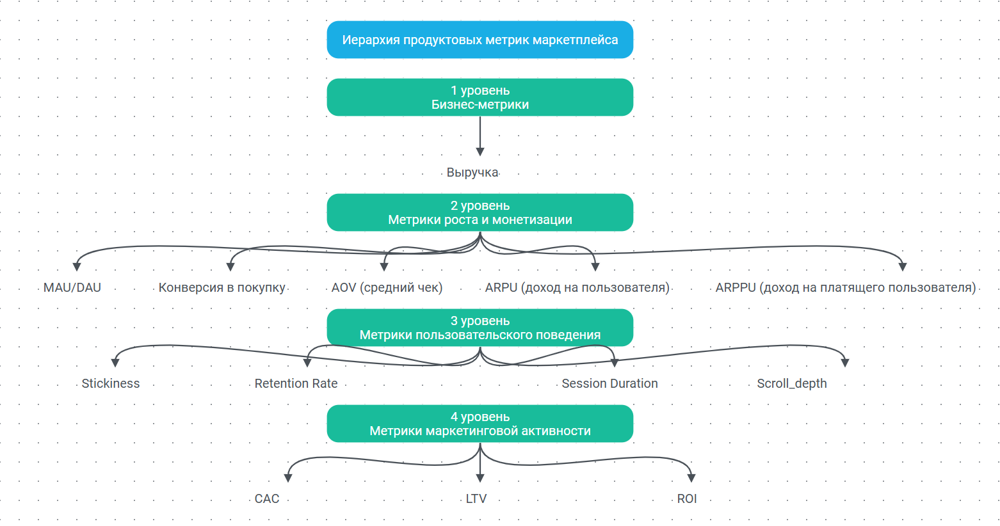

Основные термины:

- DAU (Daily Active Users) — это количество уникальных пользователей, которые взаимодействуют с продуктом или сервисом в течение одного дня.

- MAU (Monthly Active Users) — это количество уникальных пользователей, которые взаимодействуют с продуктом или сервисом в течение одного месяца.

- Stickiness (Индекс вовлеченности) — это соотношение DAU к MAU, показывающее, какая доля месячной аудитории возвращается к продукту ежедневно. 

- LTV (Lifetime Value) - это совокупная прибыль, которую приносит один клиент за весь период взаимодействия с компанией, учитывая средний чек, частоту покупок и срок удержания.

- CAC (Customer Acquisition Cost) - это средние затраты на привлечение одного платящего клиента, включая все маркетинговые расходы.

- ROI (Return on Investment) - это показатель окупаемости инвестиций, отражающий процент возврата средств от вложений в маркетинг или другие бизнес-процессы.

- Retention Rate - это процент клиентов, которые продолжают пользоваться продуктом или услугой через определенный период времени.

- ARPU (Average Revenue Per User) - это средний доход, который компания получает с одного пользователя, включая как платящих, так и неплатящих клиентов.

- ARPPU (Average Revenue Per Paying User) - это средний доход с одного платящего пользователя, рассчитываемый без учета неплатящей аудитории.

- AOV (Average Order Value) - это средняя сумма одного заказа, показывающая, сколько в среднем тратит клиент за одну покупку.

# Блок кода и расчета метрик

## Предобработка данных

In [1]:
# Загружаем все необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import numpy as np
import scipy
from scipy import stats
from scipy.stats import linregress
from statsmodels.stats.proportion import proportions_ztest

In [2]:
#Загружаем датасеты 
orders = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_orders.csv')
campaign_costs = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_campaign_costs.csv')
sessions = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_sessions.csv')
users = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_users.csv')
events = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_events.csv')

In [3]:
#Напишем несколько функций, чтобы ускорить предобработку
def common_info(df):
    """"
    Функция для ознакомления с датафреймом: 
    на вход принимает необходимый датафрейм и выводит первые пять строк, общую 
    информацию и процент пустых значений
    """
    name = [name for name, obj in globals().items() if obj is df][0]
    display(f'Первые 5 строк датафрейма {name}')
    display(df.head())
    display(f'Информация о датафрейме {name}')
    display(df.info())
    display('Процент пропущенных значений в столбцах датафрейма')
    empty = df.isna().sum() / df.shape[0]
    display(empty)

def duplicates(df, subset = None):
    """
    Анализ явных и неявных дубликатов в датафрейме
    
    Параметры:
    df - pandas DataFrame для проверки
    subset - список столбцов для проверки неявных дубликатов (опционально)
    
    Выводит:
    - Количество явных дубликатов (полных копий строк)
    - Количество неявных дубликатов (по указанным столбцам)
    - Удаляет ТОЛЬКО ЯВНЫЕ дубликаты
    """
    name = [name for name, obj in globals().items() if obj is df][0]
    duplicates = df.duplicated().sum()
    display(f'В датафрейме {name} найдено {duplicates} явных дубликатов')
    if duplicates > 0:
        original_rows = df.shape[0]
        df = df.drop_duplicates()
        deleted_rows = df.shape[0]
        part_of_deleted = deleted_rows / original_rows * 100 
        display(f'Было удалено {part_of_deleted}% строк')
    duplicates = df.duplicated(subset = subset).sum()
    display(f'В датафрейме {name} найдено {duplicates} неявных дубликатов')
    
def numeric_data(df, columns):
    """
    Анализ числовых столбцов с описательной статистикой и визуализацией распределения
    Параметры:
    df - pandas DataFrame
    columns - список числовых столбцов для анализа
    """
    pd.set_option('display.float_format', '{:.2f}'.format)
    name = [name for name, obj in globals().items() if obj is df][0]
    for column in columns:
        # Проверка что столбец числовой
        if not np.issubdtype(df[column].dtype, np.number):
            print(f"Столбец '{column}' не является числовым и будет пропущен")
            continue
        display(f'Описание столбца {column}')
        display(df[column].describe())
        mean = df[column].mean()
        plt.figure(figsize = (12,6))
        plt.ticklabel_format(style='plain', axis='both')
        plt.hist(df[column], bins = 50, color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
        plt.title(f'Гистограмма распределения столбца {column} датафрейма {name}')
        plt.xlabel('Значение')
        plt.ylabel('Частота')
        plt.axvline(x = mean, linestyle = '--', color = 'red', label = f'Среднее: {mean:.2f}')
        plt.legend()
        plt.show()
        
        
# Оптимизация числовых типов данных
def optimize_memory_usage(df: pd.DataFrame, print_size: bool=True) -> pd.DataFrame:
        '''
        Function optimizes memory usage in dataframe
        df: pd.DataFrame - data table
        print_size: bool - display of optimization results
        return pd.DataFrame - amount of optimized memory
        '''
        numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64'] # Типы, которые будем проверять на оптимизацию
        # Размер занимаемой памяти до оптимизации (в Мб)
        before_size = df.memory_usage().sum() / 1024**2    
        for column in df.columns:
            column_type = df[column].dtypes
            if column_type in numerics:
                column_min = df[column].min()
                column_max = df[column].max()
                if str(column_type).startswith('int'):
                    if column_min > np.iinfo(np.int8).min and column_max < np.iinfo(np.int8).max:
                        df[column] = df[column].astype(np.int8)
                    elif column_min > np.iinfo(np.int16).min and column_max < np.iinfo(np.int16).max:
                        df[column] = df[column].astype(np.int16)
                    elif column_min > np.iinfo(np.int32).min and column_max < np.iinfo(np.int32).max:
                        df[column] = df[column].astype(np.int32)
                    elif column_min > np.iinfo(np.int64).min and column_max < np.iinfo(np.int64).max:
                        df[column] = df[column].astype(np.int64)  
                else:
                    if column_min > np.finfo(np.float32).min and column_max < np.finfo(np.float32).max:
                        df[column] = df[column].astype(np.float32)
                    else:
                        df[column] = df[column].astype(np.float64)    
        # Размер занимаемой памяти после оптимизации (в Мб)
        after_size = df.memory_usage().sum() / 1024**2
        if print_size: print('Размер использования памяти: до {:5.2f} Mb - после {:5.2f} Mb ({:.1f}%)'
                             .format(before_size, after_size, 100 * (before_size - after_size) / before_size))
        return df

Прежде чем переходить к расчету метрик, необходимо провести предобработку данных, чтобы убедиться в их корректности.


**Предобработка датафрейма `orders`**

In [4]:
# Предобработка датафрейма orders
common_info(orders)

'Первые 5 строк датафрейма orders'

,order_id,user_id,order_date,product_name,quantity,unit_price,total_price,category_name,order_week,order_month
0,1,3,2024-01-19 01:52:52.000,Шуруповерт,2,5539.13,11078.26,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
1,2,3,2024-01-19 01:52:52.000,Молоток слесарный,1,11340.38,11340.38,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
2,3,3,2024-01-19 01:52:52.000,Секатор садовый,2,10892.09,21784.18,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
3,4,3,2024-01-25 13:59:38.000,Шуруповерт,2,5539.13,11078.26,Инструменты и садовый инвентарь,2024-01-22,2024-01-01
4,5,3,2024-01-25 13:59:38.000,Чай черный,1,2099.59,2099.59,Продукты питания,2024-01-22,2024-01-01


'Информация о датафрейме orders'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31357 entries, 0 to 31356
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   order_id       31357 non-null  int64  
 1   user_id        31357 non-null  int64  
 2   order_date     31357 non-null  object 
 3   product_name   31357 non-null  object 
 4   quantity       31357 non-null  int64  
 5   unit_price     31357 non-null  float64
 6   total_price    31357 non-null  float64
 7   category_name  31357 non-null  object 
 8   order_week     31357 non-null  object 
 9   order_month    31357 non-null  object 
dtypes: float64(2), int64(3), object(5)
memory usage: 2.4+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

order_id         0.0
user_id          0.0
order_date       0.0
product_name     0.0
quantity         0.0
unit_price       0.0
total_price      0.0
category_name    0.0
order_week       0.0
order_month      0.0
dtype: float64

Датафрейм `order` содержит 31357 строк и 10 столбцов, не имеющих пропусков данных.

- Столбцы `order_id`, `user_id`, `quantity` представлены типом `int64`, что корректно. Однако для оптимизации памяти, проведем понижение размерности. 
- Столбцы `unit_price`, `total_price` содержат данные типа `float64`. Также проведем понижение размерности. 
- Столбцы `product_name`, `category_name` имеют данные типа `object`, что является корректным.
- Столбцы `order_date`, `order_week`, `order_month` необходимо привести к формату `datetime`, так как они содержат дату и время. 

Содержимое датафрейма совпадает с заявленным описанием. 

In [5]:
# Приведем нужные столбцы к типу даты и времени
orders['order_date'] = pd.to_datetime(orders['order_date'])
orders['order_week'] = pd.to_datetime(orders['order_week'])
orders['order_month'] = pd.to_datetime(orders['order_month'])

In [6]:
# Проверим данные на дубликаты
duplicates(orders, ['order_id', 'user_id', 'order_date', 'product_name'])

'В датафрейме orders найдено 0 явных дубликатов'

'В датафрейме orders найдено 0 неявных дубликатов'

In [7]:
#Проверим, все ли пользователи из orders eсть в датафрейме users
orders_users = orders['user_id'].unique()
users_users = users['user_id'].unique()

# Находим пересечение пользователей
common_users = set(orders_users) & set(users_users)
# Пользователи, которые есть в orders, но нет в users
only_in_orders = set(orders_users) - set(users_users)
# Пользователи, которые есть в users, но нет в orders
only_in_users = set(users_users) - set(orders_users)

print(f"Общие пользователи: {len(common_users)}")
print(f"Только в orders: {len(only_in_orders)}")
print(f"Только в users: {len(only_in_users)}")

Общие пользователи: 8654
Только в orders: 268
Только в users: 35497


Видим, что 268 пользователей, совершивших заказ, не попали в таблицу users. Удалим данные о них, чтобы очистить датафрейм.

In [8]:
original_rows = orders.shape[0]
orders = orders[orders['user_id'].isin(only_in_orders) == False]
deleted_rows = original_rows - orders.shape[0]
part_of_deleted = deleted_rows / original_rows * 100
display(f'В результате предобработки данных было удалено {round(part_of_deleted, 2)}% от исходного датафрейма')

'В результате предобработки данных было удалено 2.91% от исходного датафрейма'

'Описание столбца unit_price'

count   30446.00
mean     6984.24
std      8165.87
min       339.00
25%      2122.44
50%      4406.63
75%      9372.36
max     63932.38
Name: unit_price, dtype: float64

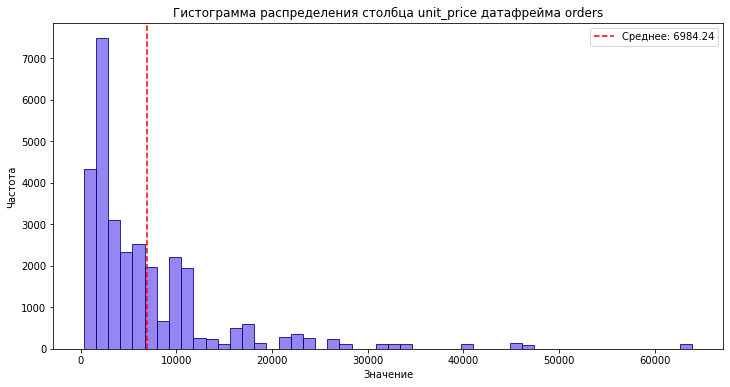

'Описание столбца total_price'

count    30446.00
mean     14024.12
std      18643.53
min        339.00
25%       3776.74
50%       7552.44
75%      17657.46
max     191797.14
Name: total_price, dtype: float64

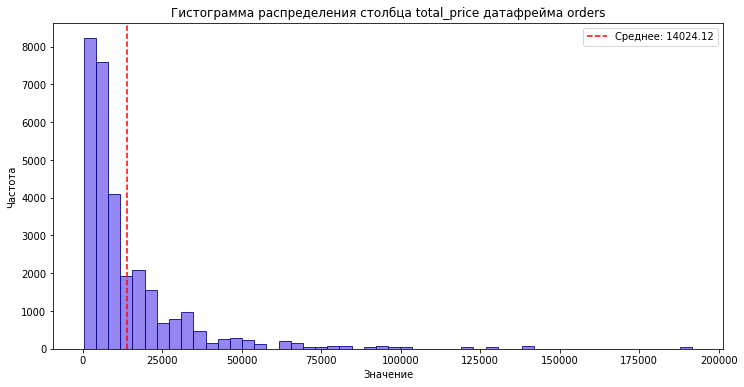

In [9]:
# Проверим распределение в столбцых unit_price, total_price
numeric_data(orders, ['unit_price', 'total_price'])

Столбец `unit_price`: распределение столбца демонстрирует значительный разброс: среднее значение (6987.90) меньше стандартного отклонения (8170.14), что указывает на высокую вариативность цен за единицу товара. Медиана (4406.63) почти в полтора раза ниже среднего, подтверждая правостороннюю асимметрию — редкие, но дорогие позиции смещают среднее вправо. Минимальная цена (339) и максимальная (63932.38) сильно различаются, при этом 75% данных не превышают 9395.95, что говорит о наличии выбросов в верхнем диапазоне. 

Столбец `total_price`: распределение имеет сильный разброс данных, так как стандартное отклонение (18667.4) значительно превышает среднее значение (14030.18), что указывает на высокую вариативность. Медиана (7554.64) меньше среднего, что говорит о правосторонней асимметрии — в данных присутствуют редкие, но очень высокие значения, тянущие среднее вверх. Минимальная цена составляет 339, а максимальная — 191797.14, при этом 75% данных лежат ниже 17657, подтверждая наличие выбросов в верхней части распределения.

Гистограммы подтверждают, что данные имеют сильный разброс с явно выраженным правым хвостом. Посмотрим на данные, которые лежат выше 99 процентиля по исследуемым столбцам, и сделаем вывод об аномальности. В случае вбросов, отфильтруем данные по 99 процентилю, чтобы исключить аномальные значения.

In [10]:
for column in orders[['unit_price', 'total_price']]:
    p_99 = orders[column].quantile(0.99)
    orders_99 = orders[orders[column] >= p_99]
orders_99['product_name'].unique()

array(['Диван угловой', 'Кровать двуспальная', 'Комод с ящиками',
       'Стол обеденный', 'Тумба ТВ', 'Шкаф-купе', 'Фен для волос'],
      dtype=object)

Анализ данных выявил: заказы, в которых как цена за единицу товара или общая сумма превышают 99-й процентиль, содержат товары ['Диван угловой', 'Кровать двуспальная', 'Комод с ящиками','Стол обеденный', 'Тумба ТВ', 'Шкаф-купе', 'Фен для волос'] Это позволяет предположить, что подобные значения не являются случайными выбросами или ошибками в данных, а отражают реальные транзакции с дорогостоящими товарами. Вероятно, высокая стоимость связана с особенностями товаров — например, с их премиальным качеством, крупными габаритами или сложной комплектацией. Таким образом, аномально высокие значения в распределении цен объясняются естественными рыночными факторами, а не искажениями данных.

Перейдем к предобработке датафрейма `campaign_costs`.

**Предобработка датафрейма `campaign_costs`**

In [11]:
common_info(campaign_costs)

'Первые 5 строк датафрейма campaign_costs'

,Unnamed: 0,acq_channel,spend_month,budget
0,0,Affiliate,2024-01-01,179343.39
1,1,Affiliate,2024-02-01,175488.49
2,2,Affiliate,2024-03-01,164543.48
3,3,Affiliate,2024-04-01,186869.98
4,4,Affiliate,2024-05-01,166443.77


'Информация о датафрейме campaign_costs'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88 entries, 0 to 87
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   88 non-null     int64  
 1   acq_channel  88 non-null     object 
 2   spend_month  88 non-null     object 
 3   budget       88 non-null     float64
dtypes: float64(1), int64(1), object(2)
memory usage: 2.9+ KB


None

'Процент пропущенных значений в столбцах датафрейма'

Unnamed: 0    0.00
acq_channel   0.00
spend_month   0.00
budget        0.00
dtype: float64

Датафрейм `campaign_costs` содержит 88 строк и 4 столбца без пропусков:
- Столбец `unnamed` не содержит полезной информации, в связи с чем будет удален из датафрейма.
- Столбец `acq_channel` представлен типом `object`, что корректно для его содержимого.
- Столбец `spend_month` хранит типа данных `object`, необходимо привести к типу `datetime`.
- Для столбца `budget` был выбран тип `float64`, что объясняется содержимым. 

In [12]:
# Удаляем столбец
campaign_costs = campaign_costs.drop('Unnamed: 0', axis = 1)
#Исправляем тип данных
campaign_costs['spend_month'] = pd.to_datetime(campaign_costs['spend_month'])

In [13]:
#Проверяем на дубликаты
duplicates(campaign_costs)

'В датафрейме campaign_costs найдено 0 явных дубликатов'

'В датафрейме campaign_costs найдено 0 неявных дубликатов'

'Описание столбца budget'

count        88.00
mean     219626.91
std      337353.10
min        6674.10
25%       42045.93
50%      111437.61
75%      172605.02
max     1533683.38
Name: budget, dtype: float64

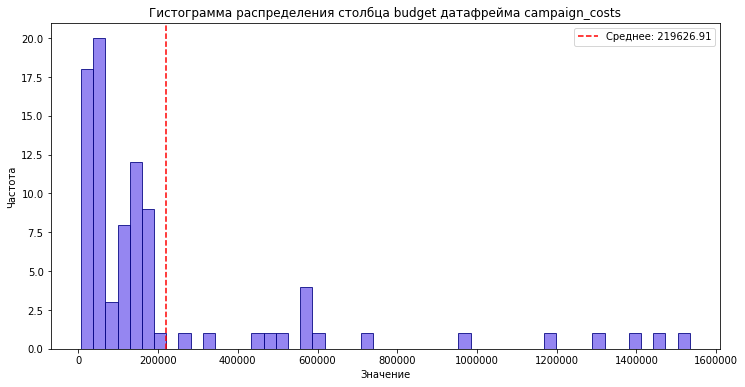

In [14]:
numeric_data(campaign_costs, ['budget'])

Распределение бюджета в данных показывает высокую вариативность — средний бюджет составляет около 219627, но стандартное отклонение (337353) почти в полтора раза превышает среднее, что указывает на сильный разброс значений. Медиана (111438) значительно ниже среднего, подтверждая правостороннюю асимметрию (что видно и на гистограмме): большинство бюджетов сосредоточено в относительно низком диапазоне, но есть редкие крайне высокие значения.

**Предобработка датафрейма `sessions`**

In [15]:
common_info(sessions)

'Первые 5 строк датафрейма sessions'

,session_id,user_id,session_start,os,device,region,browser,country,entry_path,path_start,utm_source,screen_size,scroll_depth,user_segment,utm_campaign_id,session_week,session_month
0,705,160,2024-01-12 02:30:37.000,Windows,mobile,Москва,Safari,Россия,/home,/recommend/10,unknown,768x1024,51,regular,14,2024-01-08,2024-01-01
1,706,160,2024-01-10 06:04:41.000,Windows,mobile,Москва,Safari,Россия,/home,/sale/2,unknown,375x667,71,regular,14,2024-01-08,2024-01-01
2,707,160,2024-01-23 03:31:16.000,Windows,mobile,Москва,Safari,Россия,/checkout,/click/20,unknown,768x1024,84,regular,14,2024-01-22,2024-01-01
3,708,160,2024-01-18 13:43:45.000,Windows,mobile,Москва,Safari,Россия,/category,/campaign/20,unknown,768x1024,20,regular,14,2024-01-15,2024-01-01
4,709,160,2024-01-21 01:09:58.000,Windows,mobile,Москва,Safari,Россия,/promo,/sale/3,unknown,1366x768,88,regular,14,2024-01-15,2024-01-01


'Информация о датафрейме sessions'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119535 entries, 0 to 119534
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   session_id       119535 non-null  int64 
 1   user_id          119535 non-null  int64 
 2   session_start    119535 non-null  object
 3   os               119535 non-null  object
 4   device           119535 non-null  object
 5   region           119535 non-null  object
 6   browser          119535 non-null  object
 7   country          119535 non-null  object
 8   entry_path       119535 non-null  object
 9   path_start       119535 non-null  object
 10  utm_source       119535 non-null  object
 11  screen_size      119535 non-null  object
 12  scroll_depth     119535 non-null  int64 
 13  user_segment     119535 non-null  object
 14  utm_campaign_id  119535 non-null  int64 
 15  session_week     119535 non-null  object
 16  session_month    119535 non-null  object
dtypes: int64(4

None

'Процент пропущенных значений в столбцах датафрейма'

session_id        0.00
user_id           0.00
session_start     0.00
os                0.00
device            0.00
region            0.00
browser           0.00
country           0.00
entry_path        0.00
path_start        0.00
utm_source        0.00
screen_size       0.00
scroll_depth      0.00
user_segment      0.00
utm_campaign_id   0.00
session_week      0.00
session_month     0.00
dtype: float64

Датафрейм содержит 119535 строк с 17 колонками различного типа. Все данные полностью заполнены.

Структура данных включает:
- 4 числовых столбца (`int64`): `session_id`, `user_id`, `scroll_depth`, `utm_campaign_id`, что корректно для содержимого. 
- 13 текстовых колонок (`object`): временные метки (`session_start`, `session_week`, `session_month`), которые необходимо привести к формату `datetime`, технические параметры (`os`, `device`, `browser`, `screen_size`), географические данные (`region`, `country`), пути навигации (`entry_path`, `path_start`), маркетинговые метки (`utm_source`) и сегменты пользователей (`user_segment`).

In [16]:
#Приведем к нужному типу данных
for column in sessions[['session_start', 'session_week', 'session_month']]:
    sessions[column] = pd.to_datetime(sessions[column])

In [17]:
#Проверим на дубликаты
duplicates(sessions, ['session_id', 'user_id', 'session_start'])

'В датафрейме sessions найдено 0 явных дубликатов'

'В датафрейме sessions найдено 0 неявных дубликатов'

In [18]:
# Посмотрим, какие уникальные значения есть у текстовых данных
for column in sessions[['os', 'device', 'region', 'browser', 'country', 'user_segment']]:
    display(f'Уникальные значения в столбце {column}: {sessions[column].unique()}')

"Уникальные значения в столбце os: ['Windows' 'macOS' 'Android' 'iOS']"

"Уникальные значения в столбце device: ['mobile' 'tablet' 'desktop']"

"Уникальные значения в столбце region: ['Москва' 'Московская область' 'Другие регионы' 'Краснодар' 'Новосибирск'\n 'Санкт-Петербург' 'Нижний Новгород' 'Екатеринбург' 'Ростов-на-Дону']"

"Уникальные значения в столбце browser: ['Safari' 'Firefox' 'Chrome' 'Edge']"

"Уникальные значения в столбце country: ['Россия']"

"Уникальные значения в столбце user_segment: ['regular' 'rare' 'medium' 'one_time']"

Анализ уникальных значений в категориальных столбцах показывает следующую картину: операционные системы представлены четырьмя основными вариантами (Windows, macOS, Android, iOS), устройства делятся на три типа (мобильные, планшеты и десктопы), география охватывает девять ключевых регионов России, при этом все пользователи находятся исключительно в России. Браузеры распределены между четырьмя популярными вариантами (Safari, Firefox, Chrome, Edge), а пользовательские сегменты включают четыре категории по частоте взаимодействия (регулярные, редкие, средние и разовые пользователи). Разнообразие значений в столбцах свидетельствует о хорошей дифференциации пользовательских характеристик, что позволяет проводить детальный анализ по различным сегментам.

**Предобработка датафрейма `users`**

In [19]:
common_info(users)

'Первые 5 строк датафрейма users'

,user_id,registration_date,os,age,device,gender,region,browser,country,acq_channel,campaign_id,user_segment,buyer_segment,cohort_week,cohort_month
0,1,2024-01-01 00:47:00.000,macOS,35,desktop,M,Москва,Firefox,Россия,Google Ads,33,спящий,regular,2024-01-01,2024-01-01
1,2,2024-01-01 19:01:00.000,iOS,53,desktop,M,Москва,Edge,Россия,Email Marketing,18,спящий,rare,2024-01-01,2024-01-01
2,3,2024-01-01 04:13:00.000,Android,66,mobile,F,Санкт-Петербург,Chrome,Россия,Google Ads,6,VIP,regular,2024-01-01,2024-01-01
3,4,2024-01-01 17:18:00.000,Windows,58,desktop,M,Краснодар,Firefox,Россия,Affiliate,25,новичок,one_time,2024-01-01,2024-01-01
4,5,2024-01-01 08:29:00.000,Android,58,desktop,F,Другие регионы,Edge,Россия,Google Ads,18,новичок,regular,2024-01-01,2024-01-01


'Информация о датафрейме users'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44151 entries, 0 to 44150
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   user_id            44151 non-null  int64 
 1   registration_date  44151 non-null  object
 2   os                 44151 non-null  object
 3   age                44151 non-null  int64 
 4   device             44151 non-null  object
 5   gender             44151 non-null  object
 6   region             44151 non-null  object
 7   browser            44151 non-null  object
 8   country            44151 non-null  object
 9   acq_channel        44151 non-null  object
 10  campaign_id        44151 non-null  int64 
 11  user_segment       44151 non-null  object
 12  buyer_segment      44151 non-null  object
 13  cohort_week        44151 non-null  object
 14  cohort_month       44151 non-null  object
dtypes: int64(3), object(12)
memory usage: 5.1+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

user_id             0.00
registration_date   0.00
os                  0.00
age                 0.00
device              0.00
gender              0.00
region              0.00
browser             0.00
country             0.00
acq_channel         0.00
campaign_id         0.00
user_segment        0.00
buyer_segment       0.00
cohort_week         0.00
cohort_month        0.00
dtype: float64

Датафрейм содержит 44151 строку (столько пользователей) с 15 колонками различных типов. Все данные полностью заполнены.

Структура данных включает:
- 3 числовых столбца (`int64`): `user_id`, `age`, `campaign_id`
- 12 текстовых колонок (`object`):
  - временные метки (`registration_date`, `cohort_week`, `cohort_month`), которые необходимо привести к типу `datetime`
  - технические параметры (`os`, `device`, `browser`)
  - демографические данные (`gender`)
  - географические данные (`region`, `country`)
  - маркетинговые показатели (`acq_channel`)
  - пользовательские сегменты (`user_segment`, `buyer_segment`)

In [20]:
#Приведем к нужному типу данных
for column in users[['registration_date', 'cohort_week', 'cohort_month']]:
    users[column] = pd.to_datetime(users[column])

In [21]:
#Проверим на дубликаты
duplicates(users, ['user_id'])

'В датафрейме users найдено 0 явных дубликатов'

'В датафрейме users найдено 0 неявных дубликатов'

In [22]:
# Посмотрим, какие уникальные значения есть у текстовых данных
for column in users[['os', 'device', 'region', 'browser', 'country', 'user_segment', 'buyer_segment', 'acq_channel', 'gender']]:
    display(f'Уникальные значения в столбце {column}: {users[column].unique()}')

"Уникальные значения в столбце os: ['macOS' 'iOS' 'Android' 'Windows']"

"Уникальные значения в столбце device: ['desktop' 'mobile' 'tablet']"

"Уникальные значения в столбце region: ['Москва' 'Санкт-Петербург' 'Краснодар' 'Другие регионы' 'Нижний Новгород'\n 'Екатеринбург' 'Московская область' 'Новосибирск' 'Ростов-на-Дону']"

"Уникальные значения в столбце browser: ['Firefox' 'Edge' 'Chrome' 'Safari']"

"Уникальные значения в столбце country: ['Россия']"

"Уникальные значения в столбце user_segment: ['спящий' 'VIP' 'новичок' 'активный']"

"Уникальные значения в столбце buyer_segment: ['regular' 'rare' 'one_time' 'medium']"

"Уникальные значения в столбце acq_channel: ['Google Ads' 'Email Marketing' 'Affiliate' 'SEO' 'Facebook/Instagram'\n 'TikTok']"

"Уникальные значения в столбце gender: ['M' 'F']"

Анализ уникальных значений в столбцах показывает разнообразный профиль пользовательской базы: операционные системы представлены четырьмя основными платформами (macOS, iOS, Android, Windows), устройства охватывают все популярные типы (десктопы, мобильные и планшеты), а география включает девять регионов России. Браузеры включают четыре основных варианта (Firefox, Edge, Chrome, Safari), а гендерное распределение соответствует стандартам. Особый интерес представляют маркетинговые каналы привлечения, где наряду с классическими инструментами (Google Ads, Email Marketing, SEO) присутствуют современные платформы (Facebook/Instagram, TikTok), что свидетельствует о комплексной стратегии привлечения пользователей. Сегментация аудитории реализована по двум ключевым направлениям: по активности (спящие, VIP, новички, активные) и по покупательскому поведению (регулярные, редкие, разовые, средние), что позволяет проводить детальный анализ различных групп пользователей и их вклада в бизнес-показатели. 

'Описание столбца age'

count   44151.00
mean       43.99
std        15.29
min        18.00
25%        31.00
50%        44.00
75%        57.00
max        70.00
Name: age, dtype: float64

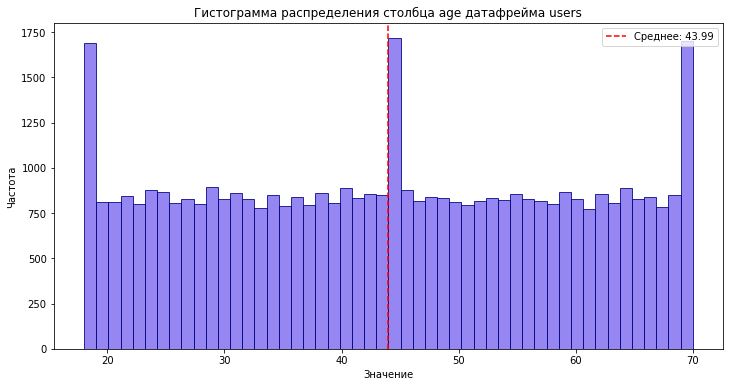

In [23]:
numeric_data(users, ['age'])

Распределение возраста пользователей показывает, что средний показатель составляет около 44 лет при стандартном отклонении в 15 лет, что указывает на значительный разброс данных вокруг среднего значения. Минимальный возраст пользователей ограничен 18 годами, а максимальный достигает 70 лет, при этом медианное значение совпадает со средним и составляет 44 года, что свидетельствует о симметричном распределении данных без существенных выбросов. 

**Предобработка датафрейма `events`**

In [24]:
common_info(events)

'Первые 5 строк датафрейма events'

,event_id,session_id,user_id,event_date,event_type,os,device,event_index,user_segment,product_name,event_week,event_month
0,3132,479,100,2024-01-01 15:23:56,page_view,iOS,mobile,1,regular,NaN,2024-01-01,2024-01-01
1,3133,479,100,2024-01-01 15:24:01,product_view,iOS,mobile,2,regular,Шорты для тренировок,2024-01-01,2024-01-01
2,3134,479,100,2024-01-01 15:24:10,product_click,iOS,mobile,3,regular,Куртка детская,2024-01-01,2024-01-01
3,3135,479,100,2024-01-01 15:25:10,add_to_cart,iOS,mobile,4,regular,Балетки классические,2024-01-01,2024-01-01
4,3136,479,100,2024-01-01 15:25:46,checkout_start,iOS,mobile,5,regular,NaN,2024-01-01,2024-01-01


'Информация о датафрейме events'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785859 entries, 0 to 785858
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   event_id      785859 non-null  int64 
 1   session_id    785859 non-null  int64 
 2   user_id       785859 non-null  int64 
 3   event_date    785859 non-null  object
 4   event_type    785859 non-null  object
 5   os            785859 non-null  object
 6   device        785859 non-null  object
 7   event_index   785859 non-null  int64 
 8   user_segment  785859 non-null  object
 9   product_name  385740 non-null  object
 10  event_week    785859 non-null  object
 11  event_month   785859 non-null  object
dtypes: int64(4), object(8)
memory usage: 71.9+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

event_id       0.00
session_id     0.00
user_id        0.00
event_date     0.00
event_type     0.00
os             0.00
device         0.00
event_index    0.00
user_segment   0.00
product_name   0.51
event_week     0.00
event_month    0.00
dtype: float64

Датафрейм содержит 785859 записей о событиях пользователей с 12 колонками различных типов. Все столбцы полностью заполнены (нет пропусков), за исключением `product_name`, где отсутствует около 51% значений, что указывает на то, что продуктовая информация привязана только к части событий.

Структура данных включает:
- 4 числовых столбца (`int64`): `event_id`, `session_id`, `user_id`, `event_index`
- 8 текстовых колонок (`object`):
  - временные метки (`event_date`, `event_week`, `event_month`), необходимо привести к формату `datetime`
  - технические параметры (`os`, `device`)
  - тип события (`event_type`)
  - сегмент пользователя (`user_segment`)
  - название продукта (`product_name`)

In [25]:
#Приведем к нужному типу данных
for column in events[['event_date', 'event_week', 'event_month']]:
    events[column] = pd.to_datetime(events[column])

In [26]:
#Проверим на дубликаты
duplicates(events, ['event_id'])

'В датафрейме events найдено 0 явных дубликатов'

'В датафрейме events найдено 0 неявных дубликатов'

In [27]:
#Проверим, все ли пользователи из orders eсть в датафрейме users
events_users = events['user_id'].unique()
users_users = users['user_id'].unique()

# Находим пересечение пользователей
common_users = set(events_users) & set(users_users)
# Пользователи, которые есть в orders, но нет в users
only_in_events = set(events_users) - set(users_users)
# Пользователи, которые есть в users, но нет в orders
only_in_users = set(users_users) - set(events_users)

print(f"Общие пользователи: {len(common_users)}")
print(f"Только в events: {len(only_in_events)}")
print(f"Только в users: {len(only_in_users)}")

original_rows = events.shape[0]
events = events[events['user_id'].isin(only_in_events) == False]
deleted_rows = original_rows - events.shape[0]
part_of_deleted = deleted_rows / original_rows * 100
display(f'В результате предобработки данных было удалено {round(part_of_deleted, 2)}% от исходного датафрейма')

Общие пользователи: 21602
Только в events: 536
Только в users: 22549


'В результате предобработки данных было удалено 4.45% от исходного датафрейма'

### Промежуточный вывод по предобработке данных
В ходе предварительной обработки были успешно очищены и подготовлены пять датафреймов: `users`, `events`, `sessions`, `orders` и `campaign_costs`. Данные во всех таблицах оказались качественными — пропуски и выбросы практически отсутствуют, что подтверждается проверкой распределений. Для корректной работы с временными метками в некоторых столбцах (например, `registration_date`, `event_date`, `session_start`, `order_date`) был выполнен переход к типу `datetime`, что позволит проводить анализ временных рядов, агрегацию по периодам и расчет метрик, зависящих от времени. Все ключевые идентификаторы (`user_id`, `session_id`, `event_id`, `order_id`) сохранены в целочисленном формате без дубликатов, что обеспечивает согласованность данных при последующих объединениях таблиц. Категориальные признаки (например, `os`, `device`, `region`, `user_segment`) имеют четкие и непротиворечивые значения, а числовые показатели (например, `budget`) не содержат аномалий. Таким образом, данные готовы для этапа углубленного анализа, включая построение воронок, когортный анализ и оценку эффективности маркетинговых кампаний.

### 2. Построить обзор ключевых метрик

На этом этапе вам нужно выполнить верхнеуровневую оценку состояния продукта с помощью собранных витрин. Бизнес просит просто оценить текущее состояние — без глубокой сегментации и оценки сложных метрик. 

Выручка бизнеса — 5% комиссии от стоимости любой продажи.

In [28]:
#рассчитаем DAU
sessions['session_date'] = pd.to_datetime(sessions['session_start'].dt.date)
dau = sessions.groupby(['session_month','session_date'])['user_id'].nunique().reset_index()
mean_dau = dau.groupby('session_month')['user_id'].mean().reset_index().rename(columns = {'user_id':'dau'})
# Рассчитаем MAU
mau = sessions.groupby('session_month', as_index = False)['user_id'].nunique().rename(columns = {'user_id':'mau'})
mau = mau.sort_values(by = 'session_month')
#Объединим данные 
stickiness = pd.merge(mau, mean_dau, how = 'left', on = 'session_month')
stickiness['stickiness'] = stickiness['dau'] / stickiness['mau'] * 100
stickiness

,session_month,mau,dau,stickiness
0,2024-01-01,1068,93.61,8.77
1,2024-02-01,1986,197.28,9.93
2,2024-03-01,2623,256.81,9.79
3,2024-04-01,2726,282.60,10.37
4,2024-05-01,3024,309.13,10.22
5,2024-06-01,2914,293.30,10.07
6,2024-07-01,3192,306.84,9.61
7,2024-08-01,3508,326.06,9.29
8,2024-09-01,3440,300.47,8.73
9,2024-10-01,3329,274.84,8.26


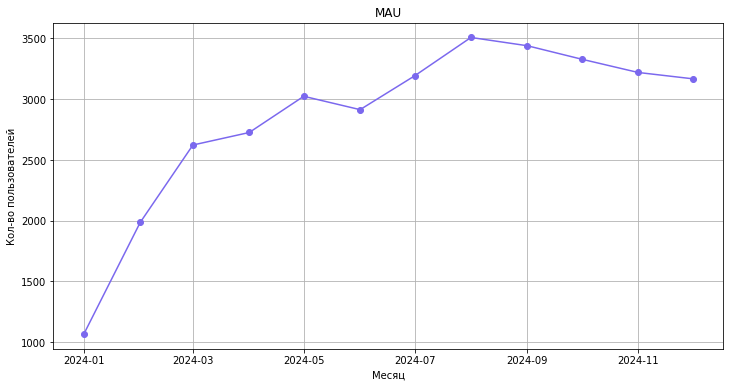

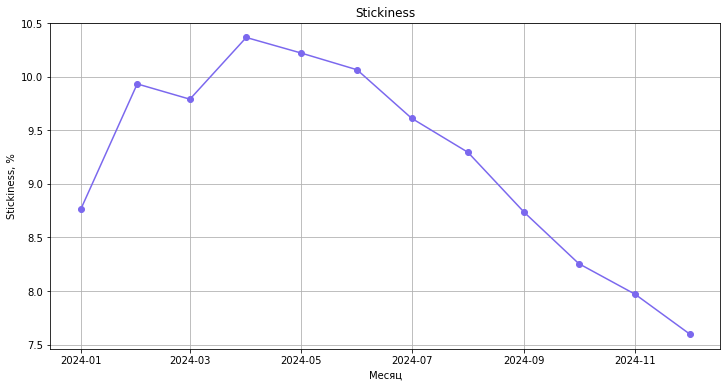

In [29]:
#Строим график MAU
plt.figure(figsize = (12,6))
plt.plot(stickiness['session_month'], stickiness['mau'], color = 'mediumslateblue', marker = 'o')
plt.title('MAU')
plt.xlabel('Месяц')
plt.ylabel('Кол-во пользователей')
plt.grid()
plt.show()

#Строим график stickiness
plt.figure(figsize = (12,6))
plt.plot(stickiness['session_month'], stickiness['stickiness'], color = 'mediumslateblue', marker = 'o')
plt.title('Stickiness')
plt.xlabel('Месяц')
plt.ylabel('Stickiness, %')
plt.grid()
plt.show()

Проверим статистическую значимость снижения stickiness

Гипотеза H0: Stickiness демонстрирует статистически значимый тренд на снижение.

Гипотеза H1: Изменения stickiness случайны и их нельзя назвать трендом.

In [30]:
result = scipy.stats.linregress(range(len(stickiness)), stickiness['stickiness'])
print(f"Наклон (slope): {result.slope:.3f}, p-значение: {result.pvalue:.4f}")
if result.pvalue < 0.05:
    print("Тренд значим (p < 0.05)")
else:
    print("Тренд НЕ значим (p >= 0.05)")

Наклон (slope): -0.184, p-значение: 0.0096
Тренд значим (p < 0.05)


Мы видим, что pvalue=0.0096 < 0.05, а значит изменения показателей stickiness - это реальный тренд, а не случайность. 

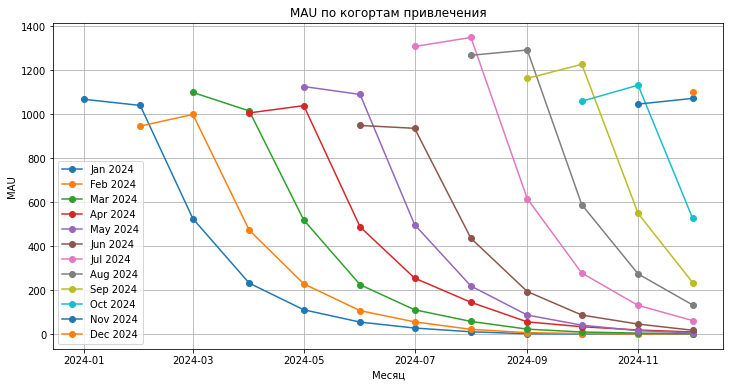

In [31]:
#Добавим анализ MAU по когортам по месяцу регистрации 
mau_cohorts = pd.merge(sessions, users[['user_id', 'cohort_month']], how = 'left', on = 'user_id')
mau_cohorts = mau_cohorts.groupby(['cohort_month', 'session_month'])['user_id'].nunique().reset_index()

#строим график mau по когортам
plt.figure(figsize = (12,6))
for cohort in mau_cohorts['cohort_month'].unique():
    df_plot = mau_cohorts[mau_cohorts['cohort_month'] == cohort]
    formatted_date = cohort.strftime('%b %Y') if hasattr(cohort, 'strftime') else pd.to_datetime(cohort).strftime('%b %Y')
    plt.plot(df_plot['session_month'], df_plot['user_id'], marker = 'o', label = formatted_date)
plt.title('MAU по когортам привлечения')
plt.xlabel('Месяц')
plt.ylabel('MAU')
plt.grid()
plt.legend()
plt.show()

Аудитория демонстрирует устойчивый рост с января (1068 пользователей) до августа (3508 пользователей), достигнув пика к концу лета, после чего наблюдается умеренное снижение до 3168 пользователей в декабре, что может быть связано с сезонным фактором или изменением маркетинговой активности. Наиболее значительный прирост произошел в первые три месяца года (с 1068 до 2623 пользователей), затем темпы роста замедлились, но общая база оставалась стабильно высокой, превышая 3000 пользователей с мая по декабрь.

Показатель Stickiness, отражающий долю ежедневно активных пользователей от общего числа, демонстрирует противоположную тенденцию. Есть статистически значимый тренд на снижение. Наибольшая липкость наблюдалась в апреле (10.37%), после чего началось постепенное снижение до 7.6% к декабрю, несмотря на рост абсолютных значений MAU и DAU. Это указывает на то, что хотя платформа успешно привлекала новых пользователей, их вовлеченность и частота возвращения со временем уменьшались. Особенно заметное падение Stickiness произошло в последние четыре месяца года, что может сигнализировать о необходимости пересмотра стратегии удержания пользователей или улучшения пользовательского опыта для повышения регулярной активности. Пиковые значения Stickiness в апреле-июне (около 10%) с последующим снижением могут быть связаны с сезонными факторами, изменением поведения пользователей во второй половине года или появлением некачественного трафика привлечения.

MAU по когортам привлечения показывает стабильный приток новых пользователей (1000–1300 в месяц), но высокий отток: уже через месяц теряется 10–20%, через полгода остается менее 5%. Интересный паттерн — во втором месяце некоторые когорты (февраль, июль, август) временно растут, возможно, из-за повторной активности или маркетинговых акций. Однако к 3–4 месяцу retention резко падает, а к концу года от большинства когорт остаются единицы. Основная проблема — низкая долгосрочная вовлеченность, несмотря на хорошие стартовые показатели.

In [32]:
#Добавим столбец revenue в датафрейм orders
orders['revenue'] = orders['total_price'] * 0.05

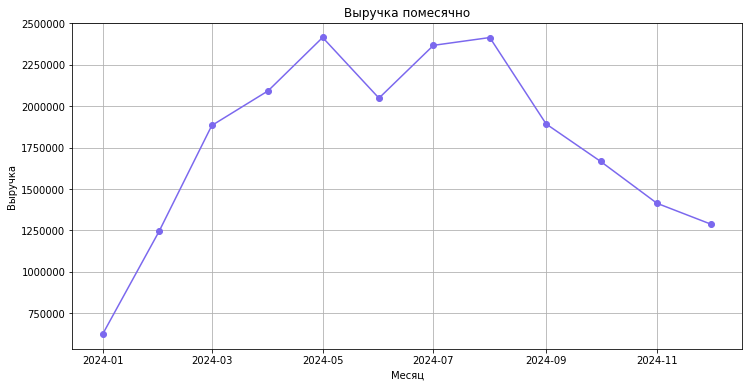

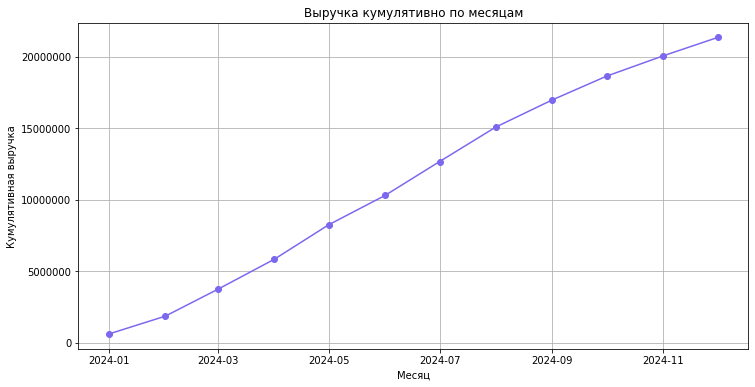

In [33]:
#Анализ REVENUE
#Посмотрим на динамику метрики помесячно и куммулятивно
revenue = orders.groupby('order_month', as_index = False)['revenue'].sum()
revenue = revenue.sort_values(by = 'order_month')
revenue['cumulative_revenue'] = revenue['revenue'].cumsum()
#Строим графики
plt.figure(figsize = (12,6))
plt.ticklabel_format(style='plain', axis='both')
plt.plot(revenue['order_month'], revenue['revenue'], color = 'mediumslateblue', marker = 'o')
plt.title('Выручка помесячно')
plt.xlabel('Месяц')
plt.ylabel('Выручка')
plt.grid()
plt.show()

#Строим графики
plt.figure(figsize = (12,6))
plt.ticklabel_format(style='plain', axis='both')
plt.plot(revenue['order_month'], revenue['cumulative_revenue'], color = 'mediumslateblue', marker = 'o')
plt.title('Выручка кумулятивно по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Кумулятивная выручка')
plt.grid()
plt.show()

Анализ динамики выручки за 2024 год показывает устойчивый рост с января по август: ежемесячная выручка увеличилась с 648890 рублей в январе до пикового значения 2465802 рублей в августе, при этом совокупная выручка за первые восемь месяцев достигла 15,5 млн рублей. Однако с сентября наблюдается снижение - выручка постепенно уменьшалась с 1935367 рублей в сентябре до 1342492 рублей в декабре, что в совокупности дало общий годовой показатель в 21,9 млн рублей. Наиболее значительный прирост выручки пришелся на период с марта по май (ежемесячный рост на 200-300 тыс. рублей). Снижение выручки осенью может быть связано с сезонностью, однако стоит выяснить причины. 

In [34]:
#Посчитаем количество заказов, покупателей и глубину чека по месяцам
orders_per_month = orders.groupby('order_month').agg(
total_orders = ('order_id','nunique'),
total_buyers = ('user_id','nunique'),
mean_bill = ('total_price','mean')).reset_index()
orders_per_month

,order_month,total_orders,total_buyers,mean_bill
0,2024-01-01,930,439,13408.29
1,2024-02-01,1841,804,13512.32
2,2024-03-01,2699,1128,13956.95
3,2024-04-01,3046,1287,13742.85
4,2024-05-01,3414,1362,14150.28
5,2024-06-01,2992,1201,13695.28
6,2024-07-01,3318,1349,14273.00
7,2024-08-01,3300,1348,14636.35
8,2024-09-01,2700,1138,14019.82
9,2024-10-01,2408,972,13838.80


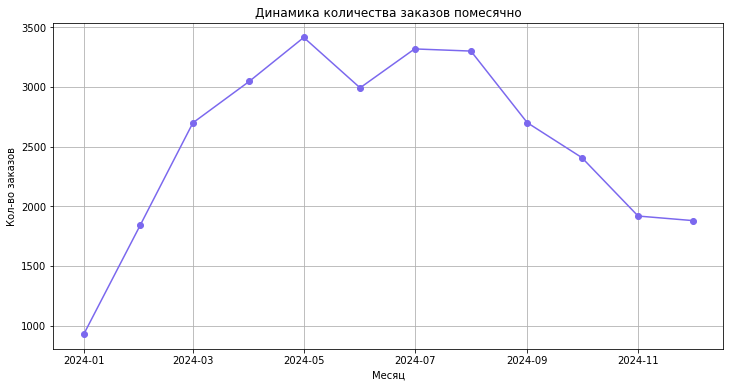

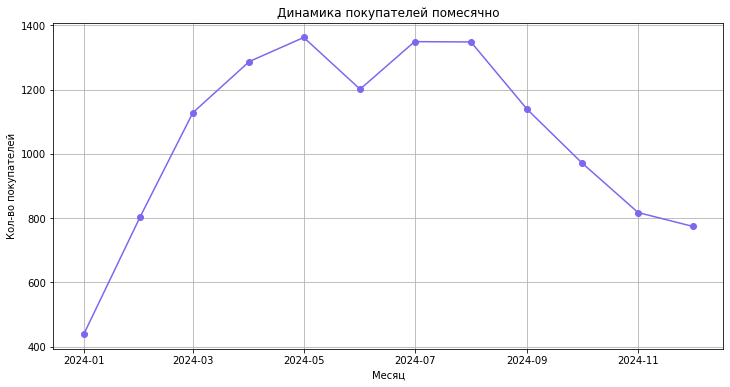

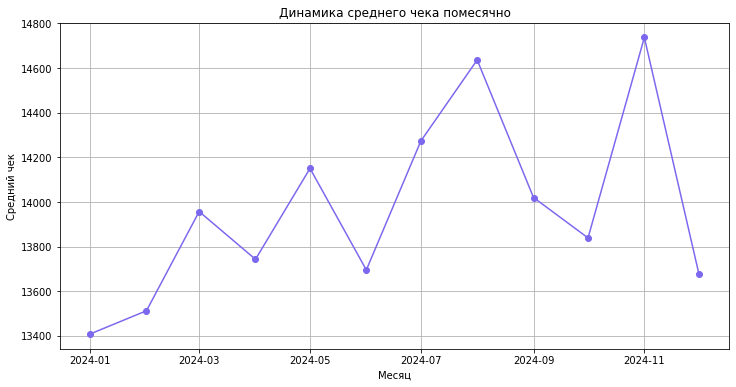

In [35]:
#Строим график для total_orders
plt.figure(figsize = (12,6))
plt.plot(orders_per_month['order_month'], orders_per_month['total_orders'], marker = 'o', color = 'mediumslateblue')
plt.title('Динамика количества заказов помесячно')
plt.xlabel('Месяц')
plt.ylabel('Кол-во заказов')
plt.grid()
plt.show()
#Строим график для total_buyers
plt.figure(figsize = (12,6))
plt.plot(orders_per_month['order_month'], orders_per_month['total_buyers'], marker = 'o', color = 'mediumslateblue')
plt.title('Динамика покупателей помесячно')
plt.xlabel('Месяц')
plt.ylabel('Кол-во покупателей')
plt.grid()
plt.show()
#Строим график для mean_bill
plt.figure(figsize = (12,6))
plt.plot(orders_per_month['order_month'], orders_per_month['mean_bill'], marker = 'o', color = 'mediumslateblue')
plt.title('Динамика среднего чека помесячно')
plt.xlabel('Месяц')
plt.ylabel('Средний чек')
plt.grid()
plt.show()

Анализ данных показывает рост показателей бизнеса в течение года с колебаниями в последние месяцы. В январе 2024 года было 930 заказов от 439 покупателей со средним чеком 13408 рублей, но уже к маю эти цифры выросли до 3 414 заказов и 1 362 покупателей при сохранении стабильного среднего чека в районе 13-14 тысяч рублей. Пик активности пришёлся на весенне-летний период: май-август демонстрируют максимальные значения по количеству заказов (3300-3414) и покупателей (1348-1362), при этом средний чек постепенно увеличивался, достигнув максимума в ноябре (14 737 рублей) и августе (14 636 рублей). 

Осенне-зимний период показывает некоторое снижение деловой активности: с сентября наблюдается уменьшение количества заказов (до 1880 в декабре) и покупателей (до 774 в декабре), хотя средний чек остаётся на стабильно высоком уровне, колеблясь между 13678 и 14737 рублями. Это значит, что активной аудитории стало меньше, однако платящие клиенты стали более ценными. 

In [36]:
#Посмотрим на динамику ARPU и ARPPU помесячно
revenue_per_month = orders.groupby('order_month', as_index = False)['revenue'].sum().rename(columns = {'order_month':'month'})
#так как считаем ARPU, учитываем даже не платящих пользователей по датафрейму sessions
all_users = sessions.groupby('session_month', as_index = False)['user_id'].nunique().rename(columns = {'session_month':'month',
                                                                                                      'user_id':'all_users'})
paying_users = orders.groupby('order_month', as_index = False)['user_id'].nunique().rename(columns = {'order_month':'month',
                                                                                                     'user_id':'paying_users'})
#объединяем данные
merged = pd.merge(revenue_per_month, all_users, how = 'left', on = 'month')
merged = pd.merge(merged, paying_users, how = 'left', on = 'month')
merged['arpu'] = merged['revenue'] / merged['all_users']
merged['arppu'] = merged['revenue'] / merged['paying_users']

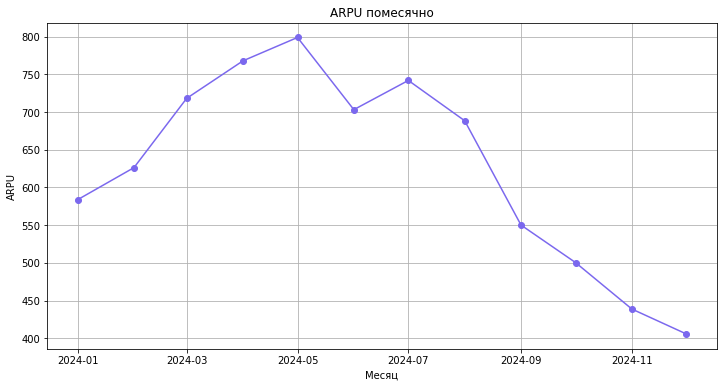

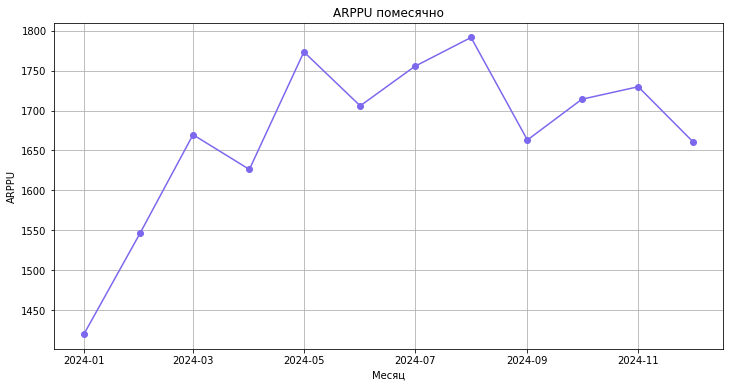

In [37]:
#Строим графики APRU и ARPPU
plt.figure(figsize = (12,6))
plt.ticklabel_format(style='plain', axis='both')
plt.plot(merged['month'], merged['arpu'], color = 'mediumslateblue', marker = 'o')
plt.title('ARPU помесячно')
plt.xlabel('Месяц')
plt.ylabel('ARPU')
plt.grid()
plt.show()

plt.figure(figsize = (12,6))
plt.ticklabel_format(style='plain', axis='both')
plt.plot(merged['month'], merged['arppu'], color = 'mediumslateblue', marker = 'o')
plt.title('ARPPU помесячно')
plt.xlabel('Месяц')
plt.ylabel('ARPPU')
plt.grid()
plt.show()

Анализ динамики ARPU и ARPPU за 2024 год показывает устойчивый рост монетизации в первой половине года с последующей стабилизацией и умеренным снижением к концу периода. В январе средний доход на пользователя (ARPU) составлял 607.57 рублей, достигнув пика в мае (819.70 рублей), что свидетельствует об эффективном вовлечении аудитории и росте среднего чека, однако с июня началось постепенное снижение показателя, а в сентбяре резкий спад, что может объясняться сезонным падением активности или изменением стратегии монетизации. 

При этом ARPPU (доход с платящих пользователей) демонстрирует более стабильную динамику в диапазоне 1600-1800 рублей, достигая максимума в августе (1780.36 рублей), что указывает на сохранение высокой ценности платежеспособной аудитории даже в периоды общего снижения ARPU. Разрыв между ARPU и ARPPU (в 2.5-4 раза) подчеркивает значительную долю не платящих пользователей, особенно заметную во второй половине года, что объясняет резкое падение ARPU при относительно стабильном ARPPU. Наибольшая эффективность наблюдалась в мае-августе, когда сочетались высокие значения обоих метрик, тогда как с сентября тренд сменился на отрицательный, вероятно, из-за исчерпания маркетинговых активностей или сезонного фактора.

,order_month,total_price,order_id,aov
0,2024-01-01,12469711.78,930,13408.29
1,2024-02-01,24876185.65,1841,13512.32
2,2024-03-01,37669808.16,2699,13956.95
3,2024-04-01,41860706.14,3046,13742.85
4,2024-05-01,48309063.54,3414,14150.28
5,2024-06-01,40976268.29,2992,13695.28
6,2024-07-01,47357810.40,3318,14273.00
7,2024-08-01,48299949.31,3300,14636.35
8,2024-09-01,37853526.80,2700,14019.82
9,2024-10-01,33323833.16,2408,13838.80


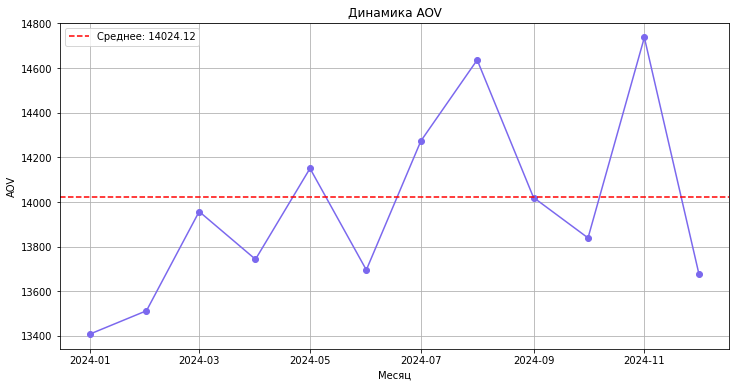

In [38]:
#Рассчитаем средний чек AOV
total_revenue = orders.groupby('order_month', as_index = False)['total_price'].sum()
total_orders = orders.groupby('order_month', as_index = False)['order_id'].nunique()
aov = pd.merge(total_revenue, total_orders, how = 'left', on = 'order_month')
aov['aov'] = aov['total_price'] / aov['order_id']
mean = aov['total_price'].sum() / aov['order_id'].sum()
display(aov)
# Строим график
plt.figure(figsize = (12,6))
plt.plot(aov['order_month'], aov['aov'], color = 'mediumslateblue', marker = 'o')
plt.title('Динамика AOV')
plt.xlabel('Месяц')
plt.ylabel('AOV')
plt.axhline(y = mean, color = 'red', linestyle = '--', label = f'Среднее: {mean:.2f}')
plt.legend()
plt.grid()
plt.show()

AOV ведёт себя непредсказуемо, без чёткого тренда. Резкие взлёты (например, +708 с февраля по март или +994 с октября по ноябрь) чередуются с такими же внезапными падениями (например, −188 в апреле или −491 в сентябре). Это может указывать на:

- Сезонные акции (пики в марте, июле, августе и ноябре совпадают с праздниками и распродажами);
- Изменения в ассортименте (появление/исчезновение премиальных товаров);
- Нестабильность ценовой политики (скидки, динамическое ценообразование).

Рекомендуется глубже изучить причины скачков, особенно ноябрьского максимума и сентябрьского провала, чтобы выявить факторы влияния.

,cohort_month,reg_users,order_users,cr
0,2024-01-01,2985,837,28.04
1,2024-02-01,2711,804,29.66
2,2024-03-01,2965,877,29.58
3,2024-04-01,2905,911,31.36
4,2024-05-01,3066,854,27.85
5,2024-06-01,2810,716,25.48
6,2024-07-01,4388,998,22.74
7,2024-08-01,4431,810,18.28
8,2024-09-01,4466,668,14.96
9,2024-10-01,4440,495,11.15


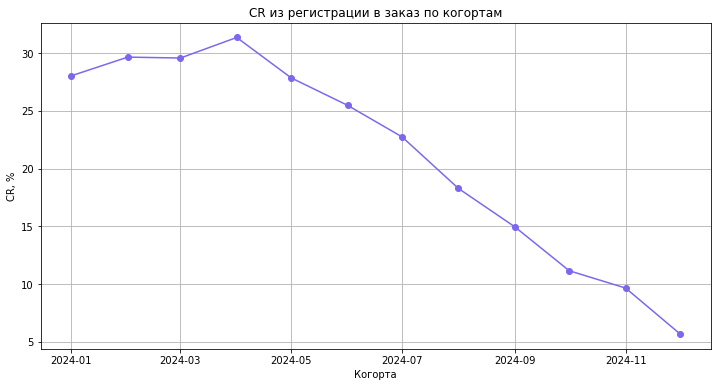

In [39]:
#Посчитаем конверсию из регистрации в заказ по когортам
orders_cohort = pd.merge(orders, users[['user_id', 'cohort_month']], how = 'left', on = ['user_id'])
users_reg = users.groupby('cohort_month')['user_id'].nunique().reset_index().rename(columns ={'user_id':'reg_users'})
orders_grouped = orders_cohort.groupby('cohort_month')['user_id'].nunique().reset_index().rename(columns ={'user_id':'order_users'})
cr_to_order = pd.merge(users_reg, orders_grouped, how = 'left', on = 'cohort_month')
cr_to_order['cr'] = cr_to_order['order_users'] / cr_to_order['reg_users'] * 100
display(cr_to_order)
#Построим график конверсии по меясцам когорт
plt.figure(figsize = (12,6))
plt.plot(cr_to_order['cohort_month'], cr_to_order['cr'], color = 'mediumslateblue', marker = 'o')
plt.title('CR из регистрации в заказ по когортам')
plt.xlabel('Когорта')
plt.ylabel('CR, %')
plt.grid()
plt.show()

Анализ данных показывает тревожную динамику конверсии пользователей из зарегистрированных в совершивших заказ. В начале 2024 года конверсия (CR) держалась на стабильном уровне 28-31%, однако с июля наблюдается резкое ухудшение метрик. После летнего периода (июль-август) CR стремительно падает с 22,74% до 5,67% в декабре, несмотря на рост количества регистраций (максимум 4 601 в декабре). Особенно показателен контраст между апрелем (CR 31,36%) и декабрём (CR 5,67%) при сопоставимом количестве регистраций. Это свидетельствует о серьёзных проблемах в вовлечении новых пользователей — вероятно, изменился канал привлечения (появилось много "холодных" лидов) или ухудшился пользовательский опыт. Важно исследовать, почему при растущем количестве регистраций (пик в 4 601 в декабре) доля совершающих заказы сократилась до минимальных значений.

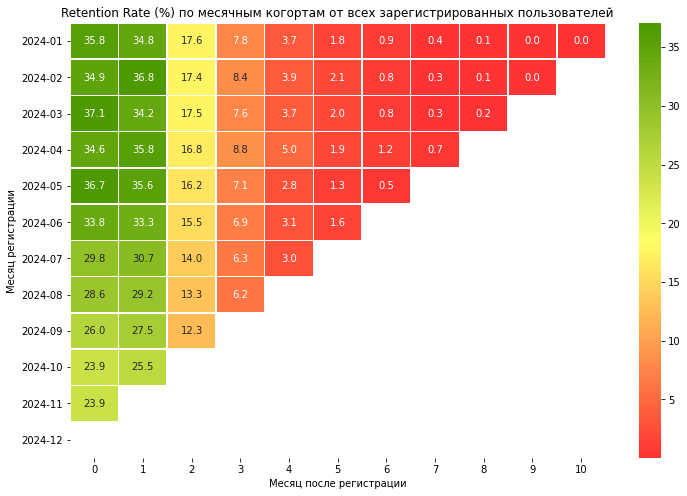

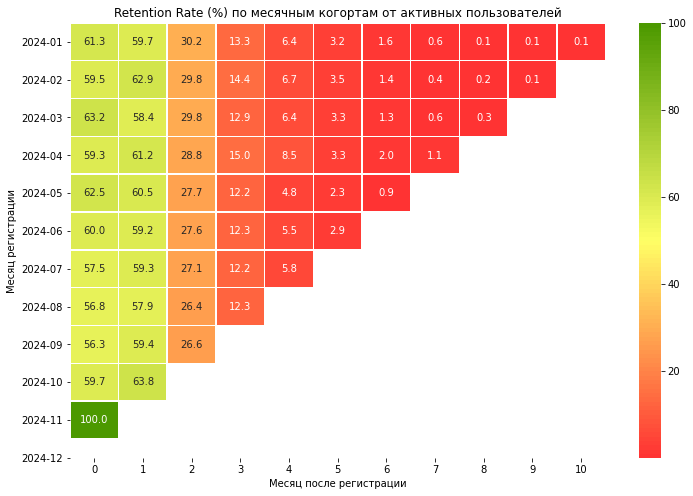

In [40]:
#Рассчитаем Retention Rate для пользователей, разбив на когорты по дате
#Считаем двумя способами retention:
# - от всех зарегистрированных пользователей (покажет проблемы активации)
# - от активных пользователей (покажет проблемы удержания среди вовлеченных)
#Подготовим новый датафрейм 
df_month_activity = pd.merge(
    sessions[['user_id', 'session_month']],
    users[['user_id', 'cohort_month']],
    on='user_id',
    how='right'
)

# Удаляем записи, где активность была ДО регистрации
df_month_activity = df_month_activity[df_month_activity['session_month'] >= df_month_activity['cohort_month']]

# Рассчитываем период (n месяцев после регистрации)
df_month_activity['n_period'] = (
(df_month_activity['session_month'].dt.to_period('M') - 
     df_month_activity['cohort_month'].dt.to_period('M')).apply(lambda x: x.n))

# Удаляем последний месяц (неполные данные)
last_month = df_month_activity['session_month'].max()
df_month_activity = df_month_activity[df_month_activity['session_month'] < last_month]

# Размеры когорт (все зарегистрированные пользователи)
cohort_sizes_all = users.groupby('cohort_month')['user_id'].nunique()
cohort_sizes_active = df_month_activity.groupby('cohort_month')['user_id'].nunique()


# Создаем сводную таблицу
pivot_month_activity = df_month_activity.pivot_table(
    index='cohort_month',
    columns='n_period',
    values='user_id',
    aggfunc='nunique'
)

# Расчет Retention Rate
retention_rate_all = pivot_month_activity.div(cohort_sizes_all, axis=0) * 100
retention_rate_active = pivot_month_activity.div(cohort_sizes_active, axis=0) * 100

cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900'], N=100)
# Визуализация retention от всех зарегистрированных пользователей

# Форматируем даты когорт для подписей
formatted_labels = [dt.strftime('%Y-%m') for dt in retention_rate_all.index]

plt.figure(figsize=(12, 8))
sns.heatmap(
    retention_rate_all,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels)
plt.title('Retention Rate (%) по месячным когортам от всех зарегистрированных пользователей')
plt.xlabel('Месяц после регистрации')
plt.ylabel('Месяц регистрации')
plt.show()

# Визуализация retention от активных пользователей
plt.figure(figsize=(12, 8))
sns.heatmap(
    retention_rate_active,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels
)
plt.title('Retention Rate (%) по месячным когортам от активных пользователей')
plt.xlabel('Месяц после регистрации')
plt.ylabel('Месяц регистрации')
plt.show()

Анализ Retention Rate по всем зарегистрированным пользователям показывает, что продукт сталкивается с проблемами удержания пользователей. В первый месяц после регистрации к продукту возвращается менее 40% пользователей во всех когортах. При этом данные можно разделить на два периода: январь-июнь и июль-декабрь. Первая группа показывает более высокие показаетли удержания в первые четыре месяца. Когорты второй демонстрируют ухудшение показателей. Это говорит о некачаственном трафике в них - привлекаются пользователи, которые проходят регистрацию, однако не совершают никаких действий. 


Анализ Retention Rate по активным пользователям показывает, что в первый месяц после регистрации возвращается лишь 56-63% пользователей, что указывает на сложности с первоначальным вовлечением. Характерно, что через месяц (n_period=1) Retention временно повышается во всех когортах до 57-64%, возможно благодаря триггерным мерам (email-рассылки, push-уведомления), но затем резко падает: к 3-му месяцу сохраняется только 12-15% пользователей, а к 6-му - менее 3%. 

Основные выводы: 

1) с июля 2024 года растет некачественный трафик новых пользователей, которые после регистрации не стаановятся активными

2) продукт теряет около 70% активных пользователей во всех когортах после 3 месяцев от даты регистрации

2) долгосрочное удержание остается слабым

3) необходимы срочные меры по анализу трафика и улучшению раннего опыта взаимодействия с продуктом.

### Промежуточные выводы

В 2024 году платформа продемонстрировала значительный рост аудитории - количество пользователей увеличилось с 1068 в январе до 3168 в декабре, достигнув пика в августе (3508 пользователей). Однако параллельно наблюдалось снижение ключевых метрик вовлеченности: показатель Stickiness уменьшился с 10.4% в апреле до 7.6% к концу года, а уровень Retention через 6 месяцев после регистрации упал ниже 3%, что свидетельствует о серьезных проблемах с удержанием пользователей. 

Динамика выручки показала аналогичную картину - рост до 2.47 млн рублей в августе сменился снижением на 45% к декабрю (1.34 млн рублей). Особую тревогу вызывает резкое падение ARPU на 22% во второй половине года при сохранении стабильного ARPPU на уровне 1700 рублей, что указывает на увеличение доли не платящих пользователей. Колебания среднего чека (AOV) в диапазоне до 1000 рублей без четкого тренда требуют дополнительного анализа ценовой политики и ассортиментной стратегии. 

Несмотря на успешное масштабирование пользовательской базы, текущие показатели Retention, монетизации и конверсии в заказ свидетельствуют о необходимости пересмотра канаалов привлечения, улучшения онбординга и раннего пользовательского опыта для повышения Retention. Продукт успешно масштабируется, но требует срочных мер по удержанию аудитории и стабилизации выручки.

### 3. Оценка метрик монетизации и юнит-экономики

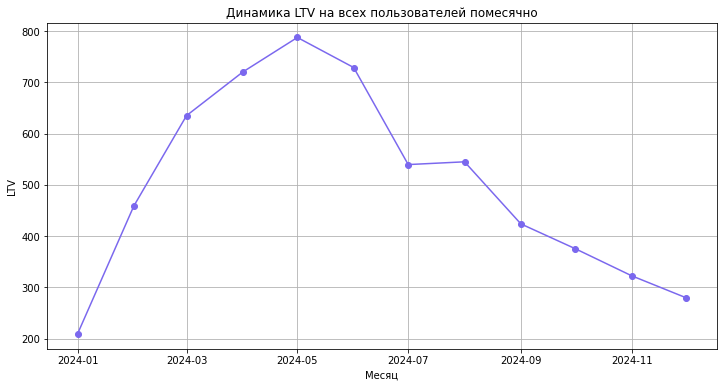

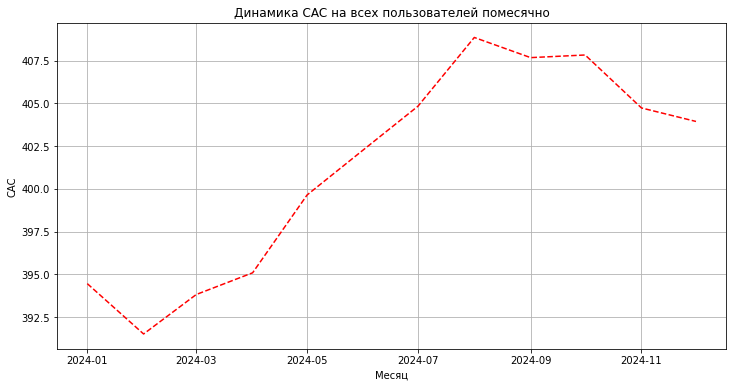

In [41]:
#Рассчитаем общее LTV на всех пользователя
df_monthly_ltv = orders.groupby('order_month')['revenue'].sum().reset_index()
all_users = users.groupby('cohort_month')['user_id'].nunique().reset_index().rename(columns = {
    'user_id':'total_users'})
df_monthly_ltv = pd.merge(df_monthly_ltv, all_users[['cohort_month', 'total_users']], left_on = 'order_month', right_on = 'cohort_month', how = 'left')
df_monthly_ltv['LTV'] = df_monthly_ltv['revenue'] / df_monthly_ltv['total_users']

costs = campaign_costs.groupby('spend_month')['budget'].sum().reset_index()
df_monthly_ltv = pd.merge(df_monthly_ltv, costs, how = 'left', left_on = 'order_month', right_on = 'spend_month')
df_monthly_ltv['CAC'] = df_monthly_ltv['budget'] / df_monthly_ltv['total_users']
#Построим график LTV
plt.figure(figsize = (12,6))
plt.plot(df_monthly_ltv['order_month'], df_monthly_ltv['LTV'], marker = 'o', color = 'mediumslateblue')
plt.title('Динамика LTV на всех пользователей помесячно')
plt.xlabel('Месяц')
plt.ylabel('LTV')
plt.grid()
plt.show()

#Построим график CAC
plt.figure(figsize = (12,6))
plt.plot(df_monthly_ltv['order_month'], df_monthly_ltv['CAC'], linestyle = '--', color = 'red')
plt.title('Динамика CAC на всех пользователей помесячно')
plt.xlabel('Месяц')
plt.ylabel('CAC')
plt.grid()
plt.show()

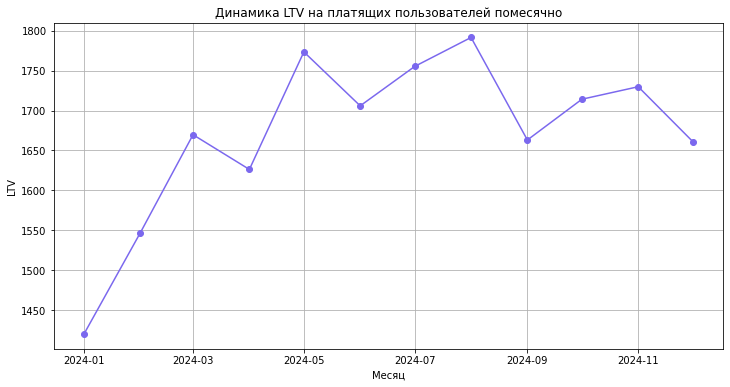

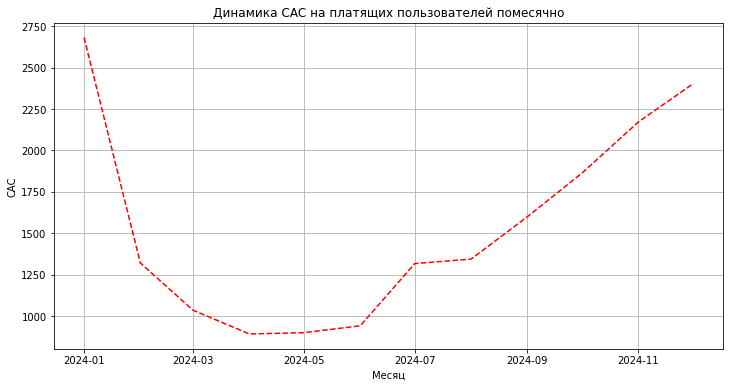

In [42]:
#Рассчитаем общее LTV на платящего пользователя
df_monthly_ltv = orders.groupby('order_month')['revenue'].sum().reset_index()
buyers = orders.groupby('order_month')['user_id'].nunique().reset_index()
df_monthly_ltv = pd.merge(df_monthly_ltv, buyers, on = 'order_month', how = 'left')
df_monthly_ltv['LTV'] = df_monthly_ltv['revenue'] / df_monthly_ltv['user_id']
df_monthly_ltv = pd.merge(df_monthly_ltv, costs, how = 'left', left_on = 'order_month', right_on = 'spend_month')
df_monthly_ltv['CAC'] = df_monthly_ltv['budget'] / df_monthly_ltv['user_id']

#Построим график 
plt.figure(figsize = (12,6))
plt.plot(df_monthly_ltv['order_month'], df_monthly_ltv['LTV'], marker = 'o', color = 'mediumslateblue')
plt.title('Динамика LTV на платящих пользователей помесячно')
plt.xlabel('Месяц')
plt.ylabel('LTV')
plt.grid()
plt.show()

#Построим график CAC
plt.figure(figsize = (12,6))
plt.plot(df_monthly_ltv['order_month'], df_monthly_ltv['CAC'], linestyle = '--', color = 'red')
plt.title('Динамика CAC на платящих пользователей помесячно')
plt.xlabel('Месяц')
plt.ylabel('CAC')
plt.grid()
plt.show()

LTV на всех пользователей стабильно растет до мая, а потом начинает значительно снижаться и к концу года достигает отметки менее 300 рублей при пиковых 790 в мае. При этом LTV на платящего пользователя с колебаниями растет и даже к концу года остается на высоких значениях. При этом привлечение платящих пользователей становится все более дорогим с июля и вскоре CAC начинает превышать LTV. Это говорит о том, что в продукт идет большой поток новых пользователей, которые не совершают заказы и не монетизируются, а старые пользователи становятся более ценными.

In [43]:
#Создадим датафрейм для дальнейшей работы
df_monthly_orders = orders.groupby(['user_id', 'order_month']).agg(total_orders = ('order_id', 'nunique'),
                                                                  total_revenue = ('revenue', 'sum')).reset_index()
df_monthly = pd.merge(users[['user_id', 'cohort_month', 'acq_channel']], df_monthly_orders, how = 'left', on = 'user_id')
df_monthly['n_period'] = df_monthly['order_month'].dt.month - df_monthly['cohort_month'].dt.month
df_monthly['cohort_month'] = pd.to_datetime(df_monthly['cohort_month'])
df_monthly = pd.merge(df_monthly, campaign_costs, left_on = ['acq_channel', 'cohort_month'], right_on = ['acq_channel', 'spend_month'], how = 'left')

df_monthly = df_monthly.sort_values(by = ['cohort_month', 'user_id', 'n_period'])
#Рассчитывааем LTV 
df_monthly['total_revenue'] = df_monthly['total_revenue'].fillna(0)
#Считаем размер когорты
cohort_sizes = users.groupby('cohort_month')['user_id'].nunique().reset_index().rename(columns = {'user_id':'cohort_size'})
df_cohorts_ltv = df_monthly.groupby(['cohort_month', 'n_period'])['total_revenue'].sum().reset_index()
df_cohorts_ltv = pd.merge(df_cohorts_ltv, cohort_sizes, on = 'cohort_month', how = 'left')
df_cohorts_ltv['LTV'] = df_cohorts_ltv.groupby('cohort_month')['total_revenue'].cumsum() / df_cohorts_ltv['cohort_size']

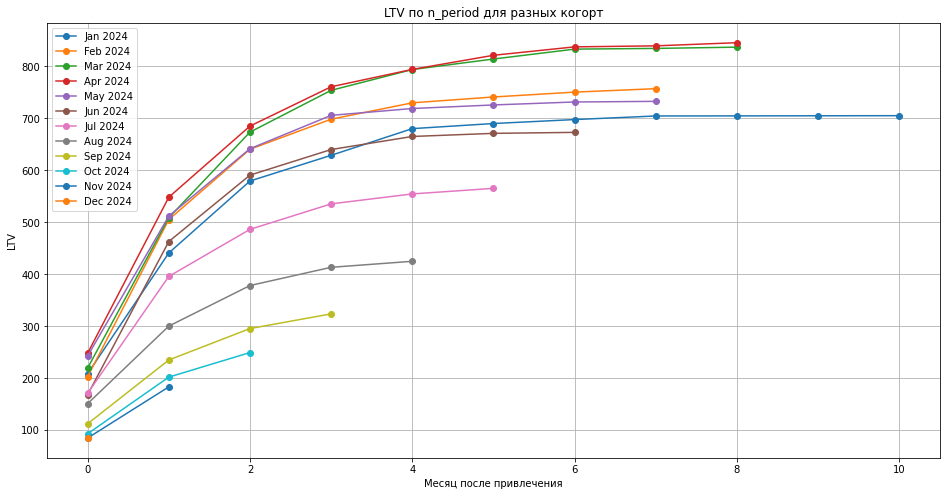

In [44]:
#Строим график LTV по когортам 
plt.figure(figsize = (16,8))
for cohort in df_cohorts_ltv['cohort_month'].unique():
    df_plot = df_cohorts_ltv[df_cohorts_ltv['cohort_month'] == cohort]
    formatted_date = cohort.strftime('%b %Y') if hasattr(cohort, 'strftime') else pd.to_datetime(cohort).strftime('%b %Y')
    plt.plot(df_plot['n_period'], df_plot['LTV'], marker = 'o', label = formatted_date)
plt.title('LTV по n_period для разных когорт')
plt.xlabel('Месяц после привлечения')
plt.ylabel('LTV')
plt.grid()
plt.legend()
plt.show()

Если когорты первого полугодия (январь -июнь) показыват примерно одинаковые результаты LTV, то когорты второго полугодия (июль-декабрь) демонстрируют снижение этого показателя. 

<Figure size 864x432 with 0 Axes>

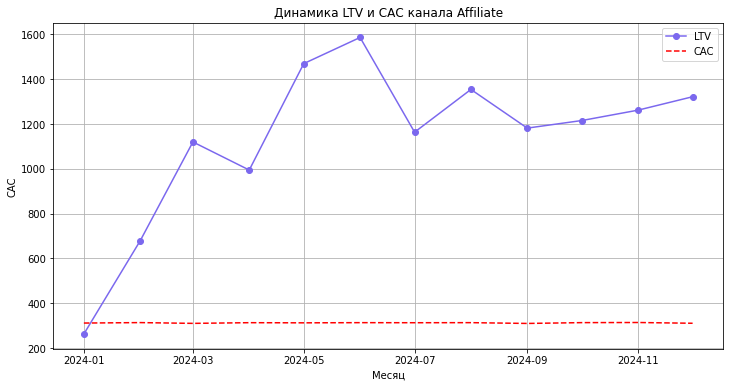

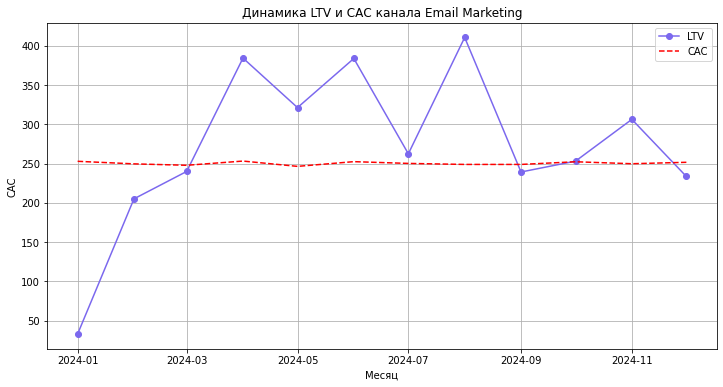

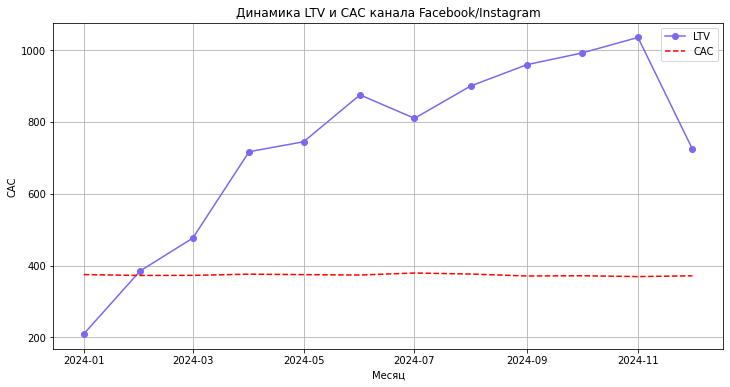

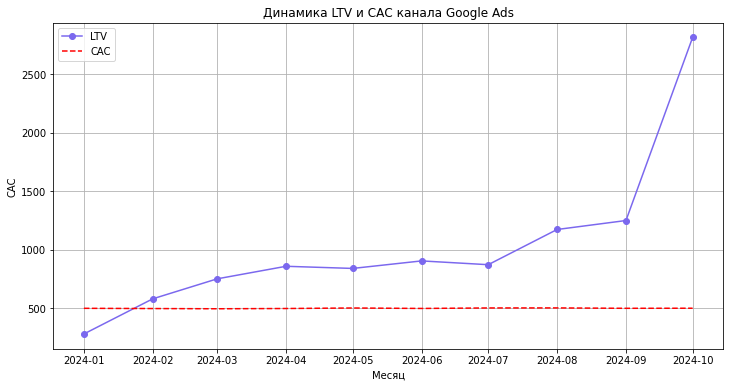

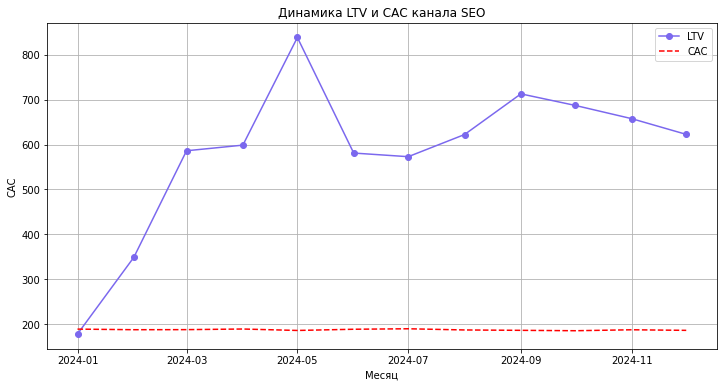

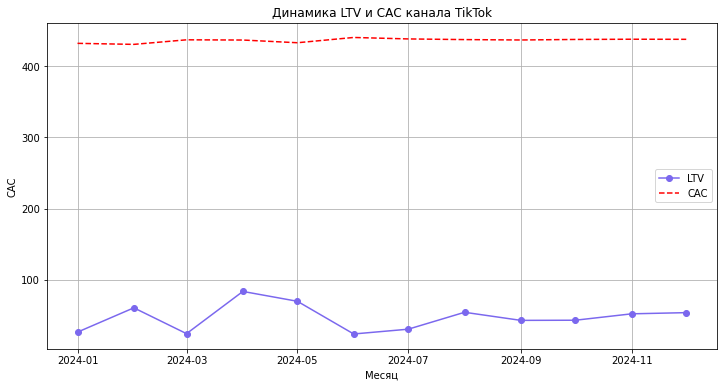

In [45]:
#Посмотрим на динамику CAC по месяцам и каналам привлечения
users_cohorts_channel = users.groupby(['cohort_month', 'acq_channel'])['user_id'].nunique().reset_index()
users_cohorts_channel = pd.merge(users_cohorts_channel, campaign_costs, left_on = ['cohort_month', 'acq_channel'], 
                                 right_on = ['spend_month', 'acq_channel'])
users_cohorts_channel['CAC'] = users_cohorts_channel['budget'] / users_cohorts_channel['user_id']

#Рассчитаем общее LTV на всех пользователей по каналам привлечения 
orders_channel = pd.merge(orders, users[['user_id', 'acq_channel']], on = 'user_id', how = 'left')
orders_channel = orders_channel.groupby(['order_month', 'acq_channel'])['revenue'].sum().reset_index()
all_users = users.groupby(['cohort_month', 'acq_channel'])['user_id'].nunique().reset_index().rename(columns = {
    'user_id':'total_users'})
users_cohorts_channel_ltv = pd.merge(orders_channel, all_users[['cohort_month', 'acq_channel', 'total_users']], left_on = ['order_month', 'acq_channel'], right_on = ['cohort_month', 'acq_channel'], how = 'right')
users_cohorts_channel_ltv['LTV'] = (users_cohorts_channel_ltv['revenue'] / users_cohorts_channel_ltv['total_users']).fillna(0)

# Объединим два датафрейма
users_cohorts_channel = pd.merge(users_cohorts_channel, users_cohorts_channel_ltv[['cohort_month', 'acq_channel', 'LTV']], how = 'left', on = ['cohort_month', 'acq_channel'])

#Строим график
plt.figure(figsize = (12,6))
for channel in users_cohorts_channel['acq_channel'].unique():
    plt.figure(figsize = (12,6))
    df_plot = users_cohorts_channel[users_cohorts_channel['acq_channel'] == channel]
    plt.plot(df_plot['cohort_month'], df_plot['LTV'], color = 'mediumslateblue', label = 'LTV', marker = 'o')
    plt.plot(df_plot['cohort_month'], df_plot['CAC'], color = 'red', linestyle = '--', label = 'CAC')
    plt.title(f'Динамика LTV и САС канала {channel}')
    plt.xlabel('Месяц')
    plt.ylabel('CAC')
    plt.grid()
    plt.legend()
    plt.show()

In [46]:
users_cohorts_channel[(users_cohorts_channel['cohort_month'] == '2024-01-01') | (users_cohorts_channel['cohort_month'] == '2024-12-01')]

,cohort_month,acq_channel,user_id,spend_month,budget,CAC,LTV
0,2024-01-01,Affiliate,575,2024-01-01,179343.39,311.90,263.16
1,2024-01-01,Email Marketing,175,2024-01-01,44263.61,252.93,32.95
2,2024-01-01,Facebook/Instagram,406,2024-01-01,152268.49,375.05,209.68
3,2024-01-01,Google Ads,1119,2024-01-01,559875.81,500.34,281.04
4,2024-01-01,SEO,316,2024-01-01,59683.72,188.87,178.05
5,2024-01-01,TikTok,394,2024-01-01,170131.14,431.80,26.71
65,2024-12-01,Affiliate,423,2024-12-01,131535.35,310.96,1321.86
66,2024-12-01,Email Marketing,142,2024-12-01,35736.71,251.67,233.60
67,2024-12-01,Facebook/Instagram,278,2024-12-01,103310.43,371.62,723.94
68,2024-12-01,SEO,252,2024-12-01,46902.36,186.12,622.72


Анализ данных показывает резкую диспропорцию между CAC и LTV по каналам привлечения. При стабильном CAC (~300-500 руб.) для большинства каналов, TikTok демонстрирует критически низкий LTV (24-83 руб.) — в 5-10 раз ниже других каналов, несмотря на масштабирование (рост пользователей с 394 в январе до 3506 в декабре).

Хороший LTV показывают каналы Affiliate, Facebook/Instagram, SEO, однако их доля в бюджете сокращается.

Надо оптимизировать TikTok и перепаспределить рекламные бюджеты в более эффективные каналы. 

In [47]:
#Считаем CAC по когортам
users_grouped = users.groupby('cohort_month')['user_id'].nunique().reset_index().rename(columns = {'user_id':'total_users'})
costs_grouped = campaign_costs.groupby('spend_month')['budget'].sum().reset_index()
users_costs = pd.merge(users_grouped, costs_grouped, left_on = 'cohort_month', right_on = 'spend_month', how = 'left')
users_costs['CAC'] = users_costs['budget'] / users_costs['total_users']
orders_users = pd.merge(orders, users[['cohort_month', 'user_id']], how = 'left', on = 'user_id')
#Выделяем период 
orders_users['n_period'] = (
(orders_users['order_month'].dt.to_period('M') - 
     orders_users['cohort_month'].dt.to_period('M')).apply(lambda x: x.n))
#Считаем агрегированную по месяцу когорты и периоду выручку
orders_users = orders_users.groupby(['cohort_month', 'n_period']).agg(
total_revenue = ('revenue', 'sum')).reset_index()
#Кумулятивная выручка
orders_users['cumulative_revenue'] = orders_users.groupby('cohort_month')['total_revenue'].cumsum()
orders_users_costs = pd.merge(users_costs, orders_users, on = 'cohort_month', how = 'left')
orders_users_costs['LTV'] = orders_users_costs['cumulative_revenue'] / orders_users_costs['total_users']
orders_users_costs['ROI'] = (orders_users_costs['LTV'] - orders_users_costs['CAC']) / orders_users_costs['CAC'] * 100

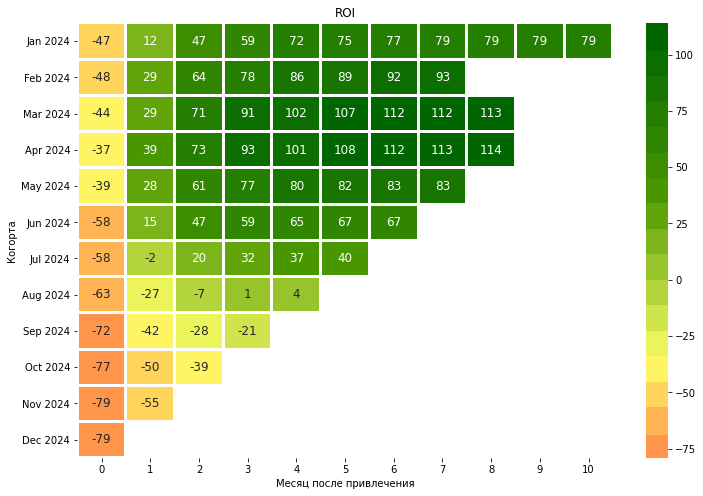

In [48]:
#пивотируем данные 
pivot_roi = orders_users_costs.pivot(index = 'cohort_month',
                                    columns = 'n_period', 
                                    values = 'ROI')
cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900', '#006600'], N=20)

# Строим heatmap
plt.figure(figsize=(12, 8))
formatted_index = [date.strftime('%b %Y') if hasattr(date, 'strftime') 
                  else pd.to_datetime(date).strftime('%b %Y') 
                  for date in pivot_roi.index]
ax = sns.heatmap(pivot_roi,
          cmap=cmap,
          annot=True,
          fmt='.0f',
        center = 0,
          linewidths=2,
          annot_kws={"size": 12})

ax.set_yticklabels(formatted_index, rotation=0)

plt.title('ROI')
plt.xlabel('Месяц после привлечения')
plt.ylabel('Когорта')
plt.show()

Зимне-весенние когорты показывают быструю и хорошую окупаемость уже со второго месяца (минимум 12%), тогда как с июля все когорты начинают второй период с отрицательным ROI (до -55% в ноябре). Критически важно, что даже к третьему месяцу осенние когорты не выходят в положительную зону. Это говорит о неокупаемости инвестиций и необходимости пересмотра вложений. 

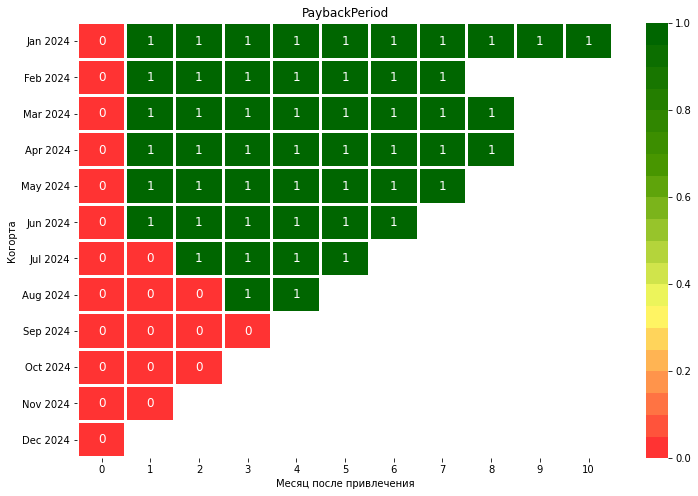

In [49]:
#Рассчитаем Payback_Period
orders_users_costs['Payback_Period'] = orders_users_costs.apply(
  lambda row: 1 if row['LTV'] >= row['CAC'] else 0, axis=1)

# Пивотируем данные, чтобы first_month были индексами, а N_month — столбцами
df_pivot = orders_users_costs.pivot(index='cohort_month', columns='n_period', values='Payback_Period')
cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900', '#006600'], N=20)

# Построим heatmap
plt.figure(figsize=(12, 8))
formatted_index = [date.strftime('%b %Y') if hasattr(date, 'strftime') 
                  else pd.to_datetime(date).strftime('%b %Y') 
                  for date in df_pivot.index]
ax = sns.heatmap(df_pivot,
          cmap=cmap,
          annot=True,
          fmt='.0f',
          linewidths=2,
          annot_kws={"size": 12})

ax.set_yticklabels(formatted_index, rotation=0)
plt.title('PaybackPeriod')
plt.xlabel('Месяц после привлечения')
plt.ylabel('Когорта')
plt.show()

Произошло радикальное ухудшение - если все доиюльские когорты окупались за 1 месяц, то начиная с июля payback period становится все больше и сентябрьская когорта не окупается даже за 3 месяца. 


Построим тепловую карту ROI для каждого канала привлечения. 

In [50]:
#Считаем CAC по когортам
users_grouped_channel = users.groupby(['cohort_month', 'acq_channel'])['user_id'].nunique().reset_index().rename(columns = {'user_id':'total_users'})
costs_grouped_channel = campaign_costs.groupby(['spend_month', 'acq_channel'])['budget'].sum().reset_index()
users_costs_channel = pd.merge(users_grouped_channel, costs_grouped_channel, left_on = ['cohort_month', 'acq_channel'], right_on = ['spend_month', 'acq_channel'], how = 'left')
users_costs_channel['CAC'] = users_costs_channel['budget'] / users_costs_channel['total_users']
orders_users_channel = pd.merge(orders, users[['cohort_month', 'acq_channel', 'user_id']], how = 'left', on = 'user_id')
#Выделяем период 
orders_users_channel['n_period'] = (
(orders_users_channel['order_month'].dt.to_period('M') - 
     orders_users_channel['cohort_month'].dt.to_period('M')).apply(lambda x: x.n))
#Считаем агрегированную по месяцу когорты и периоду выручку
orders_users_channel = orders_users_channel.groupby(['cohort_month', 'n_period','acq_channel']).agg(
total_revenue = ('revenue', 'sum')).reset_index()
#Кумулятивная выручка
orders_users_channel['cumulative_revenue'] = orders_users_channel.groupby(['cohort_month', 'acq_channel'])['total_revenue'].cumsum()
orders_users_costs_channel = pd.merge(users_costs_channel, orders_users_channel, on = ['cohort_month', 'acq_channel'], how = 'left')
orders_users_costs_channel['LTV'] = orders_users_costs_channel['cumulative_revenue'] / orders_users_costs_channel['total_users']
orders_users_costs_channel['ROI'] = (orders_users_costs_channel['LTV'] - orders_users_costs_channel['CAC']) / orders_users_costs_channel['CAC'] * 100

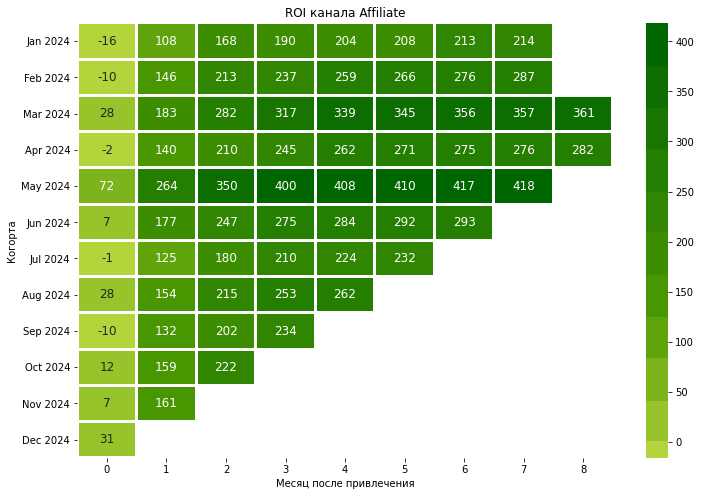

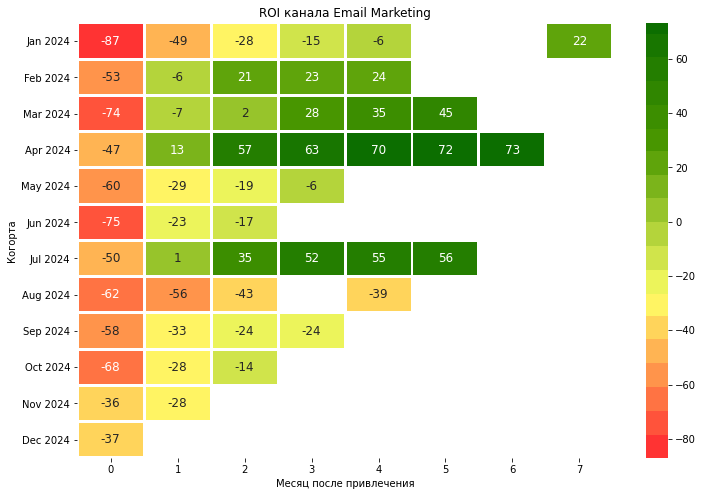

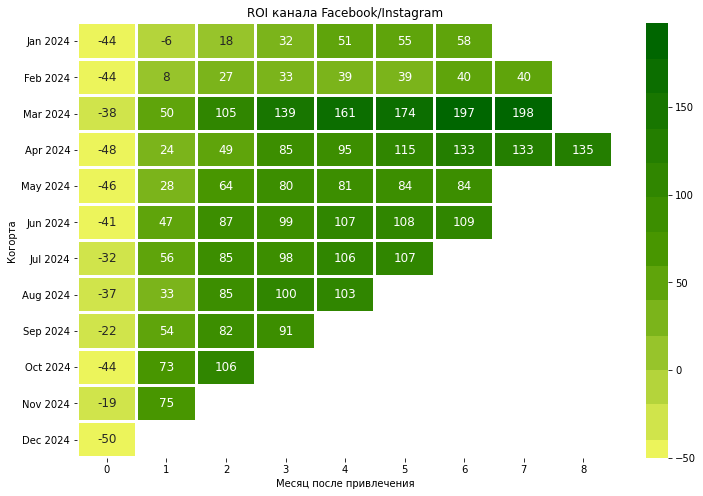

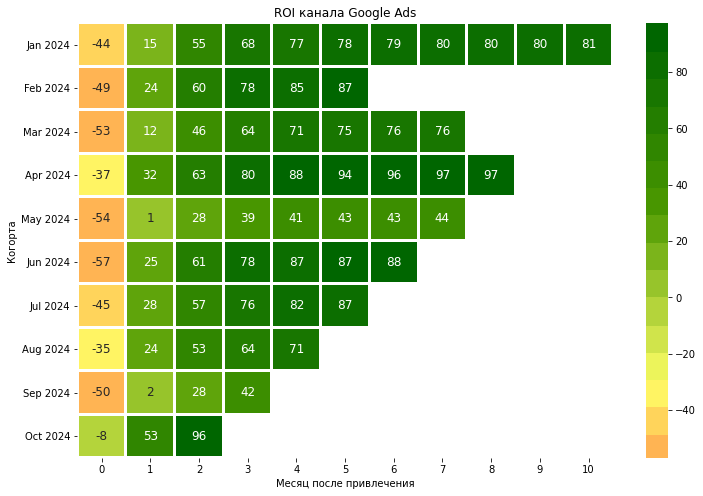

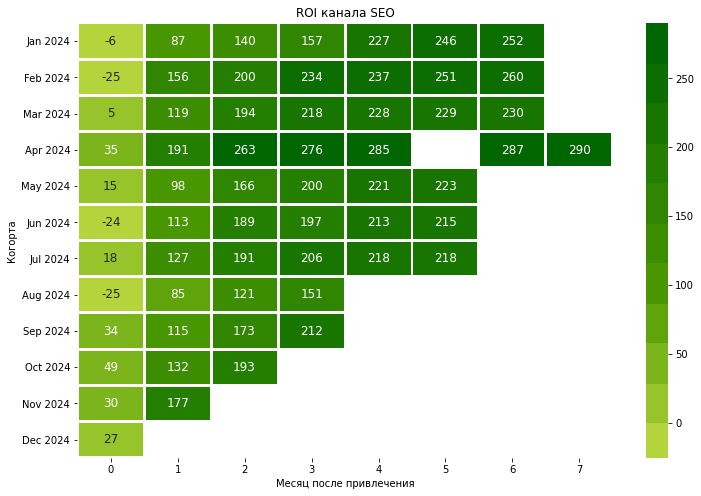

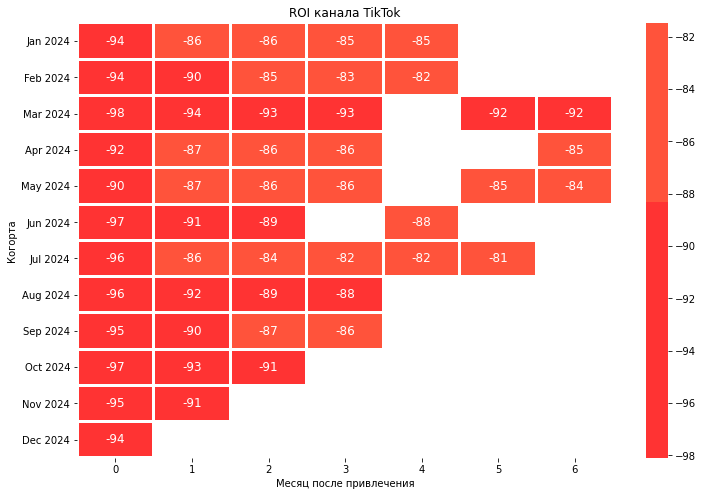

In [51]:
for channel in orders_users_costs_channel['acq_channel'].unique():
    df_plot =  orders_users_costs_channel[orders_users_costs_channel['acq_channel'] == channel]
    pivot_roi = df_plot.pivot(index = 'cohort_month',
                                    columns = 'n_period', 
                                    values = 'ROI')
    cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900', '#006600'], N=20)

    # Строим heatmap
    plt.figure(figsize=(12, 8))
    formatted_index = [date.strftime('%b %Y') if hasattr(date, 'strftime') 
                  else pd.to_datetime(date).strftime('%b %Y') 
                  for date in pivot_roi.index]
    ax = sns.heatmap(pivot_roi,
          cmap=cmap,
          annot=True,
          fmt='.0f',
        center = 0,
          linewidths=2,
          annot_kws={"size": 12})

    ax.set_yticklabels(formatted_index, rotation=0)

    plt.title(f'ROI канала {channel}')
    plt.xlabel('Месяц после привлечения')
    plt.ylabel('Когорта')
    plt.show()

Огромная проблема - это вложение маркетинговых затрат в неокупаемый источник траффика TikTok. Как выяснили ранее, в его пользу перераспределили бюджет. Это необходимо исправить - канал нуждается в оптимизации. Стоит обратить внимание на окупаемые источники трафика. 

### Промежуточный вывод

С января по май 2024 года LTV на всех пользователей демонстрировал стабильный рост, достигнув пика в 790 рублей, однако с июля началось резкое снижение, и к концу года показатель упал ниже 300 рублей. При этом LTV платящих пользователей оставался высоким, что указывает на растущую ценность существующих клиентов, но одновременно — на низкую конверсию новых. С июля CAC начал превышать LTV, особенно в TikTok, где привлечение пользователей обходится дорого (CAC ~437 рублей), а их ценность крайне мала (LTV 24-83 рубля) — в 5-10 раз ниже, чем в других каналах.

Когорты первой половины года показывали стабильную окупаемость, тогда как когорты с июля демонстрируют отрицательный ROI уже со второго месяца, а сентябрьская когорта не окупилась даже за три месяца. Особенно тревожная ситуация с TikTok: несмотря на рост числа привлеченных пользователей (с 394 в январе до 3506 в декабре), их LTV остается критически низким, что делает этот канал убыточным. В то же время эффективные каналы (Affiliate, Facebook/Instagram, SEO) с высоким LTV (200-2800 рублей) теряют долю бюджета.

Необходимо срочно перераспределить рекламные бюджеты в пользу окупаемых каналов, оптимизировать TikTok (или временно сократить вложения) и сосредоточиться на повышении конверсии новых пользователей, чтобы остановить падение LTV и восстановить окупаемость маркетинговых инвестиций.

## Выводы по этапам 2 и 3


Представьте ключевые выводы в текстовом виде здесь или приложите ссылку на документ с презентацией.

Не забудьте предоставить доступ на просмотр и комментирование документа.

В 2024 году платформа столкнулась с парадоксальной ситуацией: при трехкратном росте аудитории (с 1068 до 3168 пользователей) ключевые метрики бизнеса резко ухудшились. Несмотря на успешное масштабирование, продукт демонстрирует тревожные сигналы: Stickiness упал с 10.4% до 7.6%, Retention через 6 месяцев опустился ниже 3%, а выручка сократилась на 45% после августовского пика. Особую озабоченность вызывает катастрофическая неэффективность TikTok - при росте привлеченных пользователей с 394 до 3506 их LTV (24-83 рубля) в 5-10 раз ниже CAC (437 рублей), тогда как перспективные каналы (Affiliate, Facebook, SEO) с LTV 200-2800 рублей недополучают бюджета. 

Ситуация с когортами второго полугодия, которые не окупаются даже за 3 месяца, требует немедленного перераспределения маркетинговых инвестиций в работающие каналы, оптимизации TikTok и кардинального улучшения онбординга для повышения Retention и монетизации новых пользователей.

## 4. Поиск инсайтов, точек роста и сегментация


# Проект часть 2

Цель — сформировать обоснованные гипотезы:

* какие сегменты работают лучше остальных
* какие сегменты работают хуже остальных
* на каких этапах воронки теряются пользователи
* какие группы можно или нужно масштабировать
* куда стоит инвестировать больше внимания или ресурсов

_______________________________

На предыдущем этапе мы выяснили, что большое влияние на падение метрик бизнеса оказало перераспределнение бюджета маркетинговых инвестиций. Большая часть финансовых ресурсов была переориентирована в неэффективный и неокупаемый источник трафика - TikTok, ROI которого не было положительным ни у одной когорты за исследуемый период. При этом произошло сокращение финансирования других каналов, которые показывали намного более полезные для бизнеса цифры. 


Посмотрим на динамику привлечения пользователей и конверсию из регистрации в заказ по когортам и каналам привлечения, чтобы выяснить проблема в самой конверсии или же в платежеспособности аудитории (низких чеках).


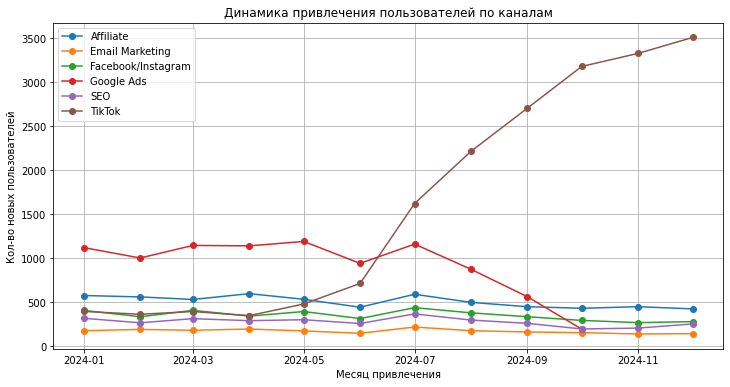

In [52]:
#смотрим динамику новых пользователей 
users_channel = users.groupby(['cohort_month', 'acq_channel'])['user_id'].nunique().reset_index().rename(columns = {'user_id':'total_users'})
plt.figure(figsize = (12,6))
for channel in users_channel['acq_channel'].unique():
    df_plot = users_channel[users_channel['acq_channel'] == channel]
    plt.plot(df_plot['cohort_month'], df_plot['total_users'], marker = 'o', label = f'{channel}')
plt.title('Динамика привлечения пользователей по каналам')
plt.xlabel('Месяц привлечения')
plt.ylabel('Кол-во новых пользователей')
plt.grid()
plt.legend()
plt.show()

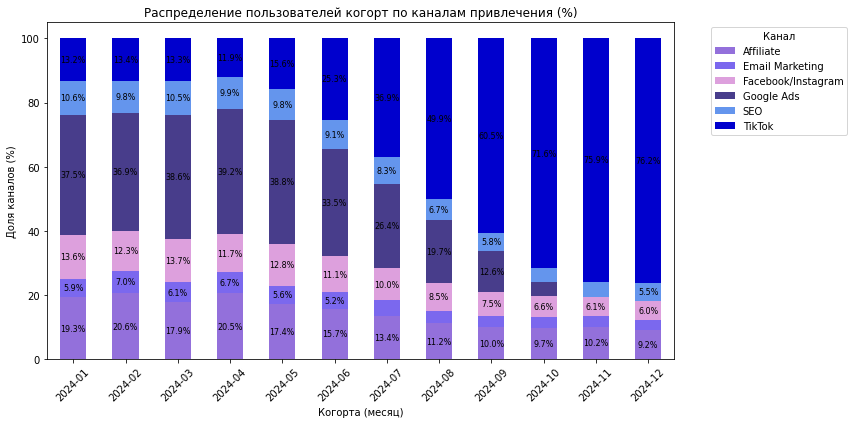

In [53]:
users_per_month = users_channel.groupby('cohort_month')['total_users'].sum().reset_index().rename(columns = {'total_users':'total_month_users'})
users_channel = pd.merge(users_channel, users_per_month, on = 'cohort_month', how = 'left')
users_channel['part'] = users_channel['total_users'] / users_channel['total_month_users'] * 100

# Создаем сводную таблицу для каналов по когортам
pivot_df = users_channel.pivot(index='cohort_month', columns='acq_channel', values='part').fillna(0)
pivot_df.index = pivot_df.index.strftime('%Y-%m')
# Строим гистограмму с накоплением
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6), color = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
plt.title('Распределение пользователей когорт по каналам привлечения (%)')
plt.xlabel('Когорта (месяц)')
plt.ylabel('Доля каналов (%)')
plt.legend(title='Канал', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
# Добавляем подписи процентов
for bars in ax.containers:
    heights = [bar.get_height() for bar in bars]
    y_positions = [bar.get_y() + bar.get_height()/2 for bar in bars]
    for bar, height, y_pos in zip(bars, heights, y_positions):
        if height > 5:
            ax.text(bar.get_x() + bar.get_width()/2, 
                    y_pos, 
                    f'{height:.1f}%', 
                    ha='center', 
                    va='center',
                    fontsize=8,
                    color='black')
plt.show()

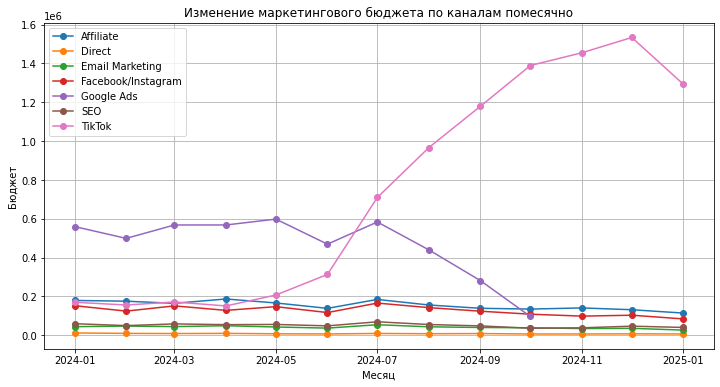

In [54]:
#посмотрим на распределение маркетингового бюджета
plt.figure(figsize = (12,6))
for channel in campaign_costs['acq_channel'].unique():
    df_plot = campaign_costs[campaign_costs['acq_channel'] == channel]
    plt.plot(df_plot['spend_month'], df_plot['budget'], label = f'{channel}', marker = 'o')
plt.title('Изменение маркетингового бюджета по каналам помесячно')
plt.xlabel('Месяц')
plt.ylabel('Бюджет')
plt.legend()
plt.grid()
plt.show()

Анализ изменения долей каналов привлечения с января по декабрь 2024 года показывает резкий сдвиг в структуре трафика. В начале года доминировал Google Ads (37.5% в январе), но его влияние неуклонно снижалось, полностью исчезнув к ноябрю. Affiliate, Email Marketing, Facebook/Instagram и SEO также постепенно теряли свои позиции, сократившись в 2-3 раза к концу года.

Главный тренд — стремительный рост TikTok: с скромных 13.2% в январе он вырос до 76.2% в декабре, став абсолютным лидером. Данные по бюджетам показывают, что увеличение доли TikTok напрямую связано с ростом инвестиций в этот канал. Это свидетельствует о сознательном перераспределении маркетинговых инвестиций - компании стали направлять существенно больше средств в TikTok, что и привело к кардинальному изменению структуры трафика. 

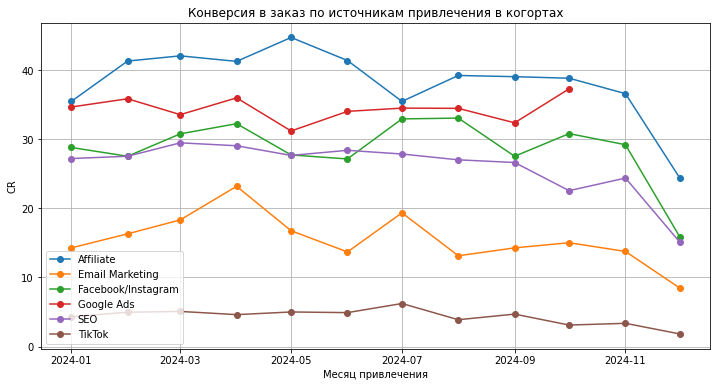

In [55]:
orders_channel = pd.merge(orders, users[['user_id', 'acq_channel', 'cohort_month']], how = 'left', on = 'user_id')
orders_channel_grouped = orders_channel.groupby(['cohort_month', 'acq_channel'])['user_id'].nunique().reset_index()
cr_to_orders_channel = pd.merge(users_channel, orders_channel_grouped, on = ['cohort_month', 'acq_channel'], how = 'left')
cr_to_orders_channel['cr'] = cr_to_orders_channel['user_id'] / cr_to_orders_channel['total_users'] * 100

#Строим график конверсии в заказ
plt.figure(figsize = (12,6))
for channel in cr_to_orders_channel['acq_channel'].unique():
    df_plot = cr_to_orders_channel[cr_to_orders_channel['acq_channel'] == channel]
    plt.plot(df_plot['cohort_month'], df_plot['cr'], marker = 'o', label = f'{channel}')
    
plt.title('Конверсия в заказ по источникам привлечения в когортах')
plt.xlabel('Месяц привлечения')
plt.ylabel('CR')
plt.grid()
plt.legend()
plt.show()

Видим, что наименьшая конверсия в заказ наблюдается у TikTok (менее 10% на протяжении всего исследуемого периода). Учитывая ранее полученные сведения о том, что бюджет был перераспределен в его пользу, его LTV не покрывает CAC, а конверсия из регистрации в заказ маленькая, то можно сказать, что причина падения выручки - это трафик из этого канала. 

In [56]:
#Посмотрим на динамику ARPU и ARPPU помесячно
orders_c = pd.merge(orders, users[['user_id', 'acq_channel']], on = 'user_id', how = 'left') 
revenue_per_month = orders_c.groupby(['order_month', 'acq_channel'], as_index = False)['revenue'].sum().rename(columns = {'order_month':'month'})
#так как считаем ARPU, учитываем даже не платящих пользователей по датафрейму sessions
sessions_c = pd.merge(sessions, users[['user_id', 'acq_channel']], on = 'user_id', how = 'left')
all_users = sessions_c.groupby(['session_month', 'acq_channel'], as_index = False)['user_id'].nunique().rename(columns = {'session_month':'month',
                                                                                            'user_id':'all_users'})
paying_users = orders_c.groupby(['order_month', 'acq_channel'], as_index = False)['user_id'].nunique().rename(columns = {'order_month':'month',
                                                                                                     'user_id':'paying_users'})
#объединяем данные
merged = pd.merge(revenue_per_month, all_users, how = 'left', on = ['month', 'acq_channel'])
merged = pd.merge(merged, paying_users, how = 'left', on = ['month', 'acq_channel'])
merged['arpu'] = merged['revenue'] / merged['all_users']
merged['arppu'] = merged['revenue'] / merged['paying_users']

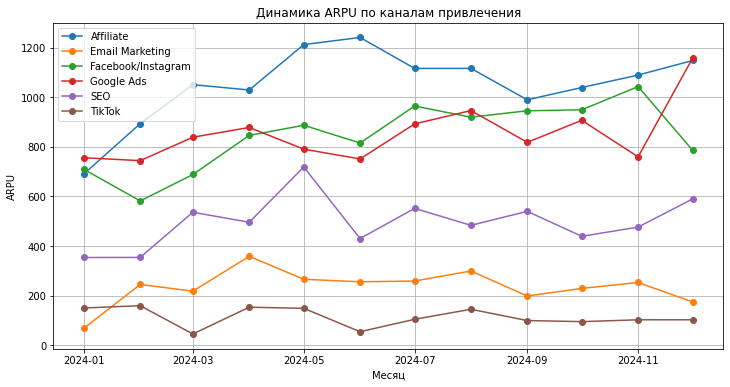

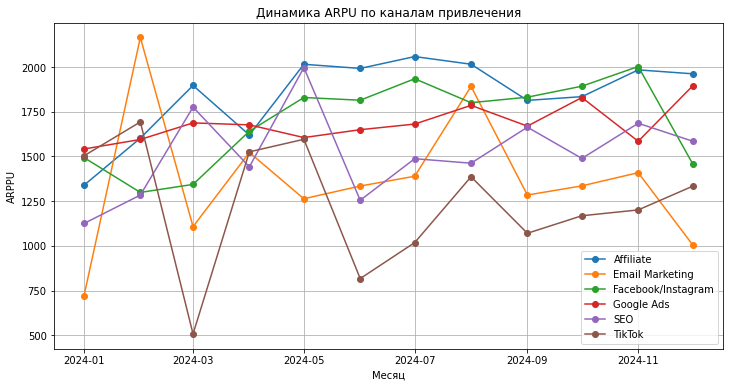

In [57]:
#Построим график динамики ARPU
plt.figure(figsize = (12,6))
for channel in merged['acq_channel'].unique():
    df_plot = merged[merged['acq_channel'] == channel]
    plt.plot(df_plot['month'], df_plot['arpu'], label = f'{channel}', marker = 'o')
plt.title('Динамика ARPU по каналам привлечения')
plt.xlabel('Месяц')
plt.ylabel('ARPU')
plt.grid()
plt.legend()
plt.show()

#Построим график динамики ARPPU
plt.figure(figsize = (12,6))
for channel in merged['acq_channel'].unique():
    df_plot = merged[merged['acq_channel'] == channel]
    plt.plot(df_plot['month'], df_plot['arppu'], label = f'{channel}', marker = 'o')
plt.title('Динамика ARPU по каналам привлечения')
plt.xlabel('Месяц')
plt.ylabel('ARPPU')
plt.grid()
plt.legend()
plt.show()

Анализ данных выявил значительный дисбаланс в эффективности каналов привлечения: Google Ads и Affiliate стабильно демонстрируют высокие показатели ARPPU (1500-2000 руб.) и приносят основную выручку, тогда как TikTok, несмотря на массовый приток пользователей, показывает крайне низкую монетизацию (ARPU 45-150 руб.) при относительно высоком ARPPU (1000-1500 руб.), что свидетельствует о преобладании неконвертируемой аудитории. При этом Facebook/Instagram и SEO занимают промежуточное положение, обеспечивая стабильный доход с хорошей конверсией. Особенно тревожной выглядит динамика TikTok - с ростом количества привлеченных пользователей их качество продолжает падать (ARPU снизился с 150 руб. в январе до 102 руб. в декабре), тогда как в Google Ads и Affiliate ARPU остается стабильно высоким (750-1150 руб.), подтверждая их надежность как основных драйверов роста. Это указывает на необходимость пересмотра маркетинговой стратегии: сокращение инвестиций в TikTok в пользу более эффективных каналов, а также разработку специальных механизмов вовлечения для "холодной" аудитории, чтобы повысить ее конверсию в платежеспособных пользователей.

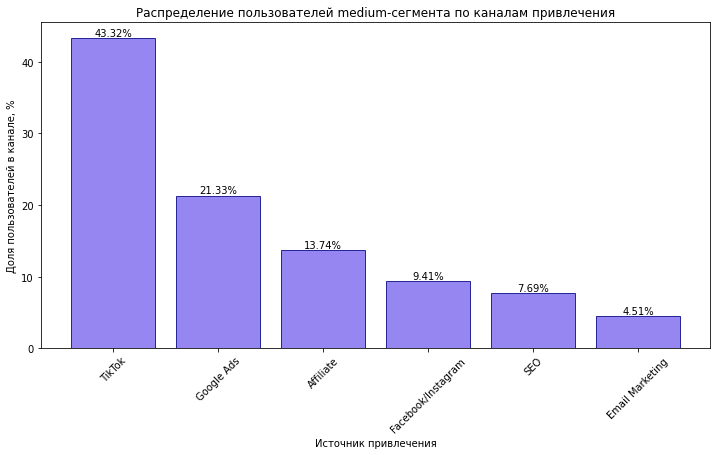

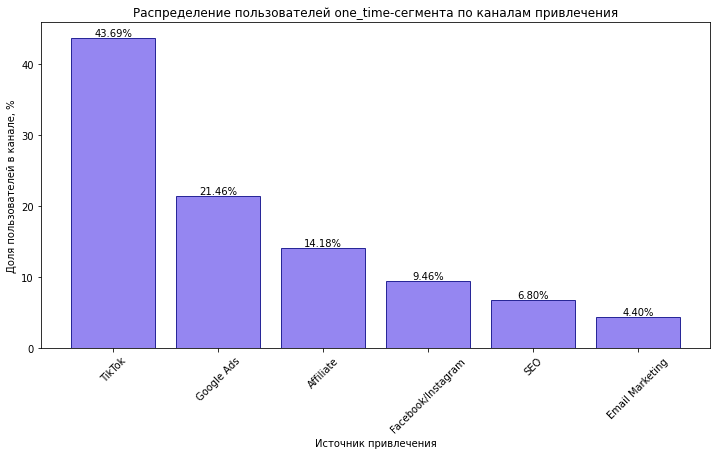

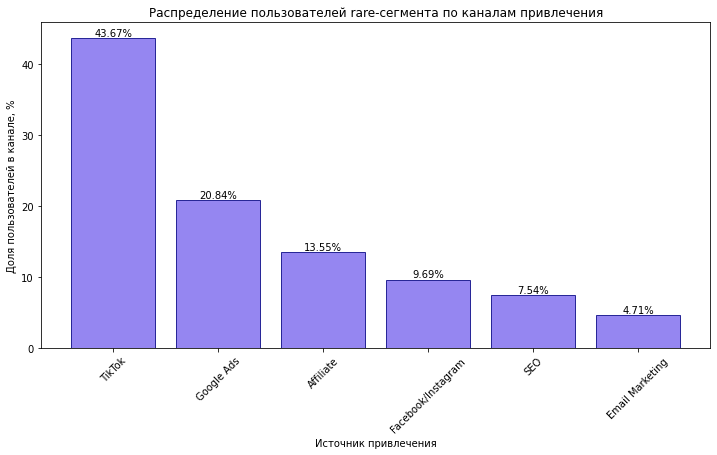

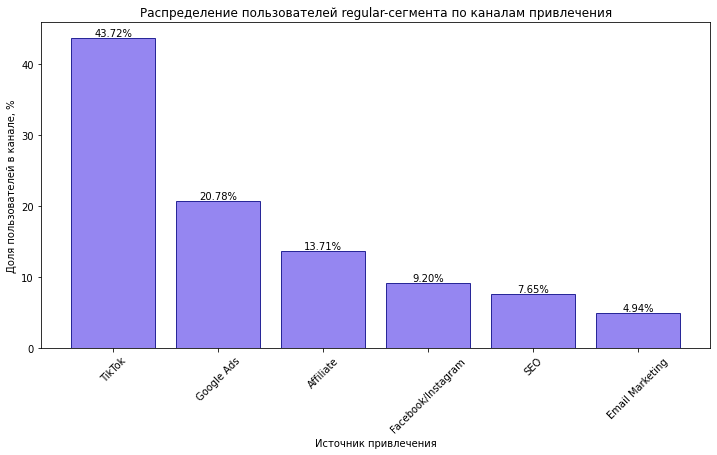

In [58]:
#Посмотрим на распределение пользователей по сегментам в разрезе источника привлечения
buyers_channel = users.groupby(['buyer_segment', 'acq_channel'])['user_id'].nunique().reset_index()
users_buyers = users.groupby('buyer_segment')['user_id'].nunique().reset_index().rename(columns = {'user_id':'users'})
buyers_channel = pd.merge(users_buyers, buyers_channel, how = 'left', on = 'buyer_segment')
buyers_channel['part'] = buyers_channel['user_id'] / buyers_channel['users'] * 100

for segment in buyers_channel['buyer_segment'].unique():
    df_plot = buyers_channel[buyers_channel['buyer_segment'] == segment].sort_values(by = 'part', ascending = False)
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['acq_channel'], df_plot['part'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Распределение пользователей {segment}-сегмента по каналам привлечения')
    plt.xlabel('Источник привлечения')
    plt.ylabel('Доля пользователей в канале, %')
    plt.xticks(rotation = 45)
    plt.show()

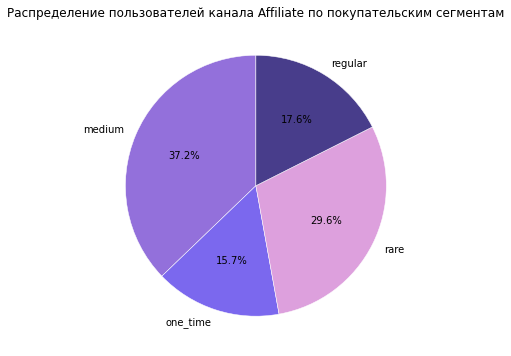

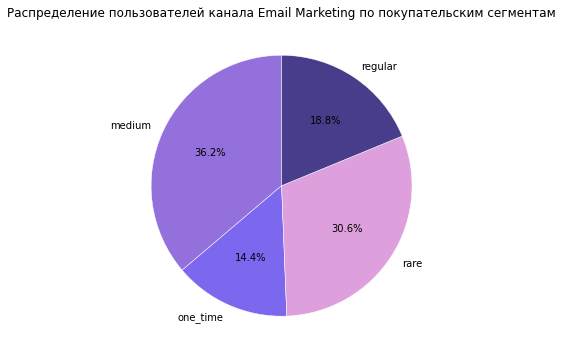

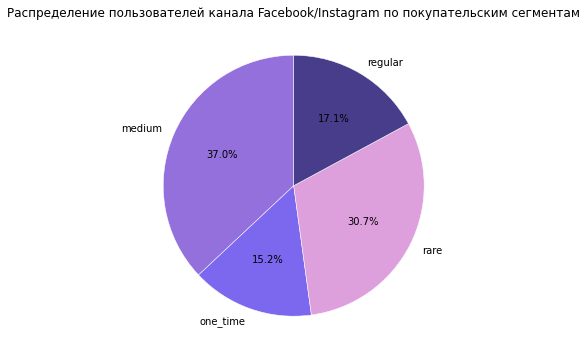

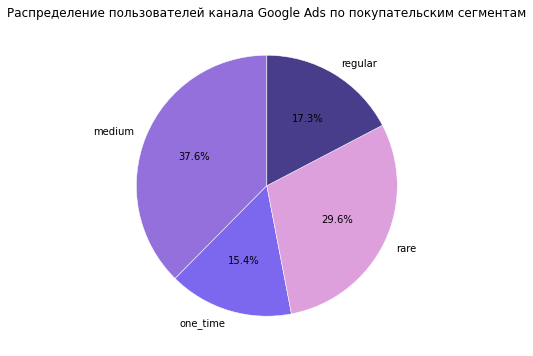

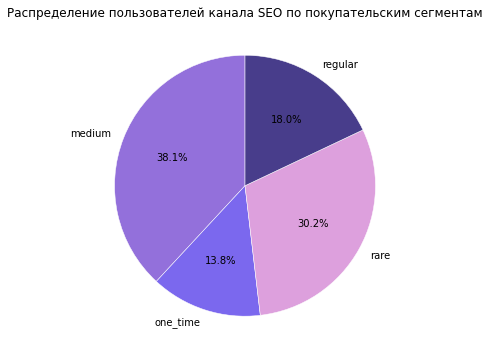

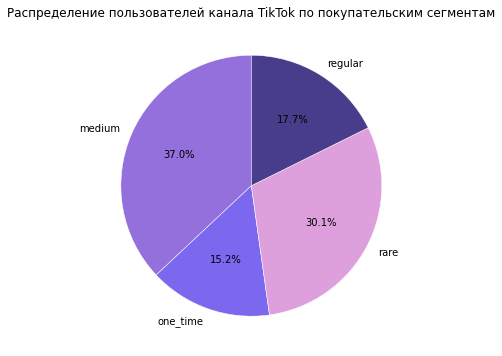

In [59]:
#Посмотрим на распределение пользователей по сегментам в разрезе источника привлечения
buyers_channel = users.groupby(['buyer_segment', 'acq_channel'])['user_id'].nunique().reset_index()
users_buyers = users.groupby('buyer_segment')['user_id'].nunique().reset_index().rename(columns = {'user_id':'users'})
buyers_channel = pd.merge(users_buyers, buyers_channel, how = 'left', on = 'buyer_segment')
buyers_channel['part'] = buyers_channel['user_id'] / buyers_channel['users'] * 100
for channel in buyers_channel['acq_channel'].unique():
    df_plot = buyers_channel[buyers_channel['acq_channel'] == channel]
    labels = df_plot['buyer_segment'].unique()
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], labels = labels, autopct='%1.1f%%', 
    startangle=90, 
    colors=['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue'],
    wedgeprops={'edgecolor': 'white', 'linewidth': 0.5})  # Границы секторов)
    
    plt.title(f'Распределение пользователей канала {channel} по покупательским сегментам')
    plt.xticks(rotation = 45)
    plt.show()

Анализ выявил тревожную зависимость платформы от TikTok как основного канала привлечения (43-44% пользователей во всех сегментах), что объясняет падение ключевых метрик: несмотря на массовый приток аудитории, этот канал генерирует неплатежеспособных и нелояльных пользователей.

__________
**Важный вывод и рекомендация для бизнеса**

Необходимо срочно перераспределить маркетинговый бюджет с TikTok на окупаемые каналы (Google Ads, Affiliate, Facebook/Instagram), где LTV в 5-10 раз выше при сопоставимом CAC. TikTok, несмотря на масштабирование (рост с 394 до 3506 пользователей), демонстрирует критически низкую конверсию (<10%) и непокрытие CAC, что напрямую влияет на падение выручки.

Действия:

- Сократить инвестиции в TikTok до оптимизации таргетинга и вовлечения.

- Увеличить бюджет Google Ads/Affiliate — их ARPPU (1500-2000 руб.) и стабильный LTV подтверждают эффективность.

- Внедрить механизмы вовлечения для "холодного" трафика (push-уведомления, персональные предложения).

- Мониторить ARPU/ARPPU по каналам, чтобы избежать перекоса в пользу неокупаемых источников.

Итог: Смещение фокуса на качественные каналы стабилизирует выручку и улучшит ROI маркетинга. Сейчас перераспредедение маркетинговых вложений - приоритетная задача для бизнеса.


Гипотезы и идеи для бизнеса:

- Гипотеза: Если сегментировать TikTok-аудиторию (например, по возрасту или интересам), конверсия вырастет.
Основание: Сейчас канал работает «вслепую», привлекая всех подряд.

- Гипотеза: Если увеличить бюджет на каналы Google Ads/Affiliate на 20%, общий LTV вырастет. Основание: Их пользователи уже показывают высокую платежеспособность.

______________

Перейдем к детальной сегментации пользователей и постараемся найти инсайты для развития продукта.

Начнем с сегментации по региону. Для начала посмотрим количество уникальных пользователей в каждом регионе России.

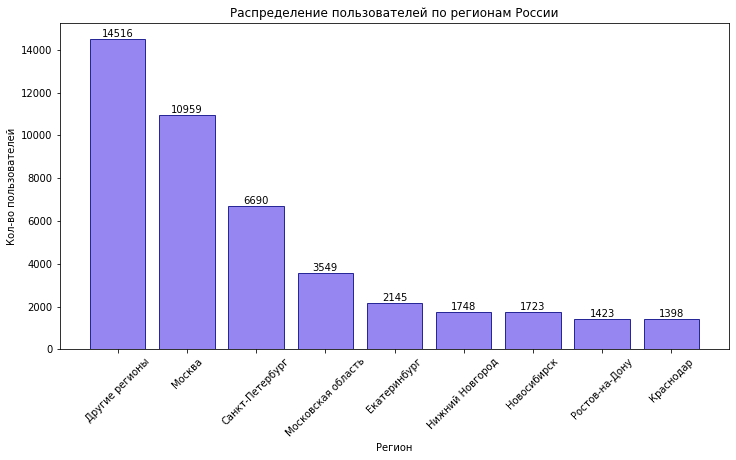

In [60]:
#Смотрим число пользователей
users_region = users.groupby('region')['user_id'].nunique().reset_index().sort_values(by = ['user_id'], ascending = False)

plt.figure(figsize = (12,6))
bars = plt.bar(users_region['region'], users_region['user_id'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.0f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Распределение пользователей по регионам России')
plt.xlabel('Регион')
plt.ylabel('Кол-во пользователей')
plt.xticks(rotation = 45)
plt.show()

Распределение пользователей по регионам показывает ожидаемую концентрацию аудитории: Москва и Санкт-Петербург лидируют по количеству пользователей (10 959 и 6 690 соответственно), за ними следуют Московская область (3 549) и крупные региональные центры (Екатеринбург, Нижний Новгород, Новосибирск — 1 700-2 100 пользователей). Меньше всего пользователей в Ростове-на-Дону и Краснодаре (около 1 400). Такое распределение отражает общую демографическую и экономическую картину России, где столичные регионы и города-миллионники традиционно формируют основную пользовательскую базу. Для маркетинговой стратегии это означает необходимость дифференцированного подхода к привлечению и удержанию аудитории в зависимости от плотности пользователей в каждом регионе.

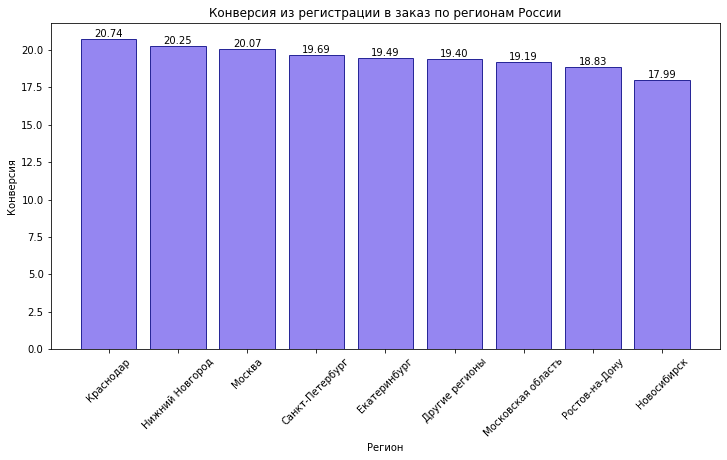

In [61]:
#Посмотрим конверсию из регистрации в заказ по регионам России
orders_region = pd.merge(orders, users[['user_id', 'region', 'cohort_month']], how = 'left', on = 'user_id')
orders_region_grouped = orders_region.groupby('region')['user_id'].nunique().reset_index().rename(columns = {'user_id':'buyers'})
orders_region_grouped = pd.merge(orders_region_grouped, users_region, how = 'right', on = 'region')
orders_region_grouped['cr_to_order'] = orders_region_grouped['buyers'] / orders_region_grouped['user_id'] * 100
orders_region_grouped = orders_region_grouped.sort_values(by = ['cr_to_order'], ascending = False)

plt.figure(figsize = (12,6))
bars = plt.bar(orders_region_grouped['region'], orders_region_grouped ['cr_to_order'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Конверсия из регистрации в заказ по регионам России')
plt.xlabel('Регион')
plt.ylabel('Конверсия')
plt.xticks(rotation = 45)
plt.show()

Анализ конверсии в заказ по регионам демонстрирует удивительно стабильные показатели в диапазоне 17,99-20,74%, что свидетельствует о высокой степени унификации пользовательского поведения на платформе независимо от географического расположения. Наибольшая конверсия зафиксирована в Краснодаре (20,74%), тогда как Новосибирск показывает минимальный результат (17,99%), для проверки значимости нужно провести тест. Столичные регионы - Москва (20,07%) и Санкт-Петербург (19,69%) - демонстрируют средние значения, несмотря на максимальную численность пользовательской базы, что подтверждает отсутствие прямой зависимости между количеством пользователей и уровнем конверсии. Такая однородность метрик указывает на стандартизированный пользовательский опыт по всей стране и позволяет сделать вывод, что основные факторы, влияющие на конверсию, носят общеплатформенный характер, а не региональный. Незначительное отставание Новосибирска может быть связано с локальными особенностями, но не оказывает существенного влияния на общую картину, что делает приоритетными общесистемные улучшения онбординга и пользовательского опыта, а не региональную оптимизацию.

In [62]:
reg_kr = users[users['region'] == 'Краснодар']['user_id'].nunique()
reg_nvs = users[users['region'] == 'Новосибирск']['user_id'].nunique()

order_kr = orders_region[orders_region['region'] == 'Краснодар']['user_id'].nunique()
order_nvs = orders_region[orders_region['region'] == 'Новосибирск']['user_id'].nunique()

total = [reg_kr, reg_nvs]
successes = [order_kr, order_nvs]
#Проверяем значимость
z_score, p_value = proportions_ztest(successes, total, alternative='larger')

display(f'p-value: {p_value:.4f}')
if p_value < 0.05:
    display('Конверсия в Краснодаре значимо выше (p < 0.05)')
else:
    display('Нет статистически значимых различий (p ≥ 0.05)')

'p-value: 0.0262'

'Конверсия в Краснодаре значимо выше (p < 0.05)'

По итогам теста, конверсия в Краснодаре значимо выше, а в Новосибирске ниже. Стоит обратить на это внимание и провести дополнительный анализ региональных различий.

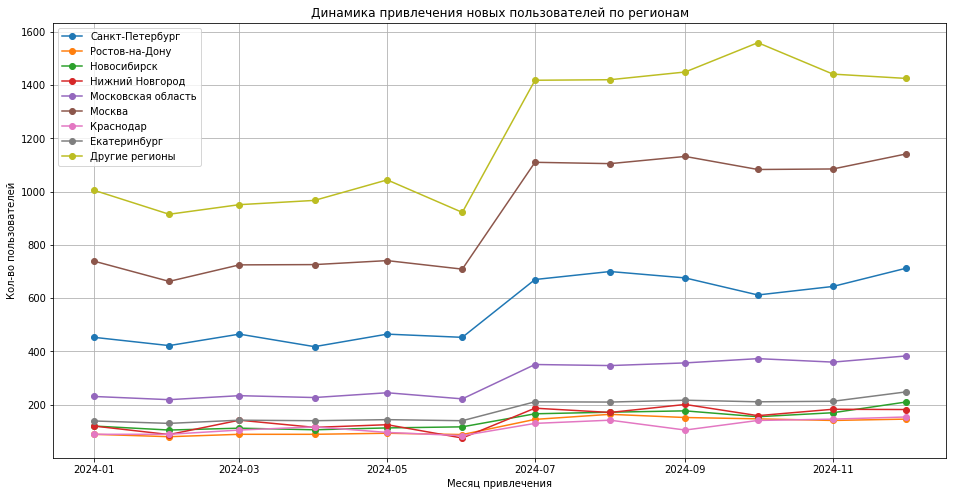

In [63]:
#Посмотрим динамику привлечения когорт по городам
#Смотрим число пользователей
users_region_cohorts = users.groupby(['cohort_month','region'])['user_id'].nunique().reset_index().sort_values(by = ['cohort_month'], ascending = False)
plt.figure(figsize = (16,8))
for region in users_region_cohorts['region'].unique():
    df_plot = users_region_cohorts[users_region_cohorts['region'] == region]
    plt.plot(df_plot['cohort_month'], df_plot['user_id'], label = f'{region}', marker = 'o')
    
plt.title('Динамика привлечения новых пользователей по регионам')
plt.xlabel('Месяц привлечения')
plt.ylabel('Кол-во пользователей')
plt.legend()
plt.grid()
plt.show()

По графику видно, что скачок в количестве новых пользователей в июле произошел во всех регионах России. Посмотрим на конверсию в заказ по когортам привлечения и городам, чтобы выяснить, отличается ли какой-то регион низкими показателями, тянущими статистику вниз, или некачественный трафик приходит со всех регионов. 

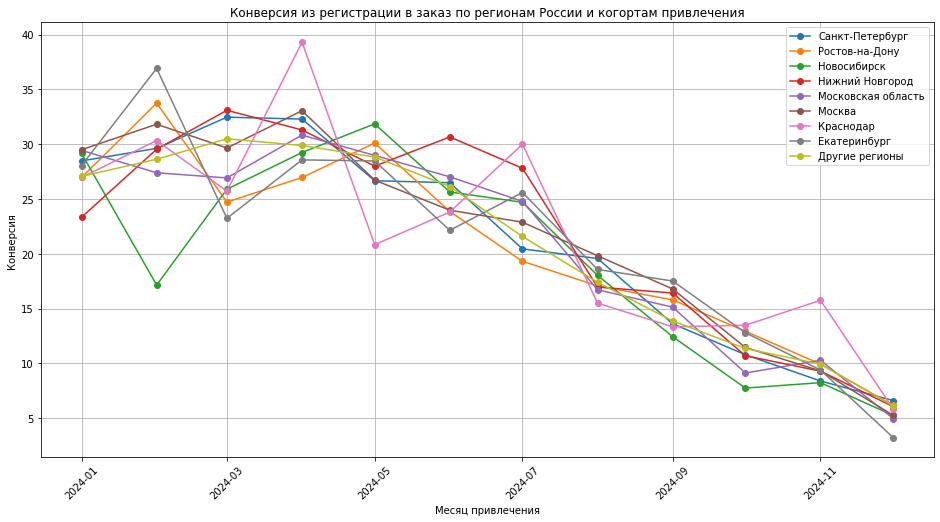

In [64]:
orders_region_grouped = orders_region.groupby(['cohort_month', 'region'])['user_id'].nunique().reset_index().rename(
    columns = {'user_id':'buyers'})
orders_region_grouped = pd.merge(orders_region_grouped, users_region_cohorts, how = 'right', on = ['cohort_month', 'region'])
orders_region_grouped['cr_to_order'] = orders_region_grouped['buyers'] / orders_region_grouped['user_id'] * 100

plt.figure(figsize = (16,8))
for region in orders_region_grouped['region'].unique():
    df_plot = orders_region_grouped[orders_region_grouped['region'] == region]
    plt.plot(df_plot['cohort_month'], df_plot['cr_to_order'], label = f'{region}', marker = 'o')
plt.title('Конверсия из регистрации в заказ по регионам России и когортам привлечения')
plt.xlabel('Месяц привлечения')
plt.ylabel('Конверсия')
plt.xticks(rotation = 45)
plt.grid()
plt.legend()
plt.show()

Видим, что конверсия в заказ начинается снижаться у всех июльских когорт во всех регионах при росте новой аудитории. Это значит, что региональные особенности не были причиной падения ключевых для бизнеса метрик.

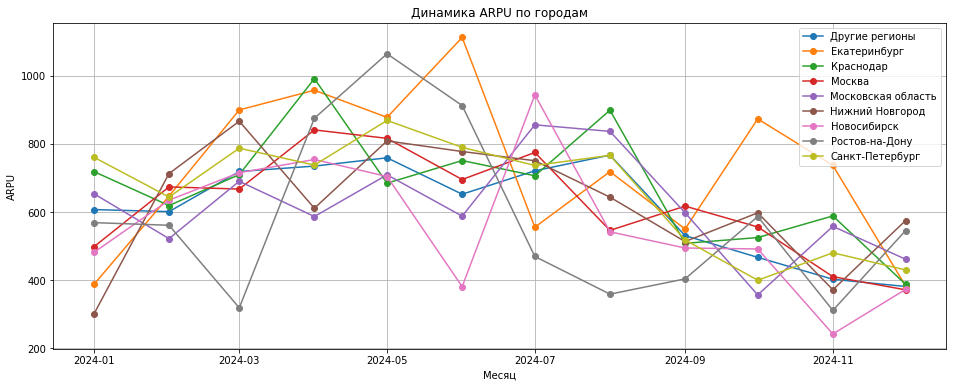

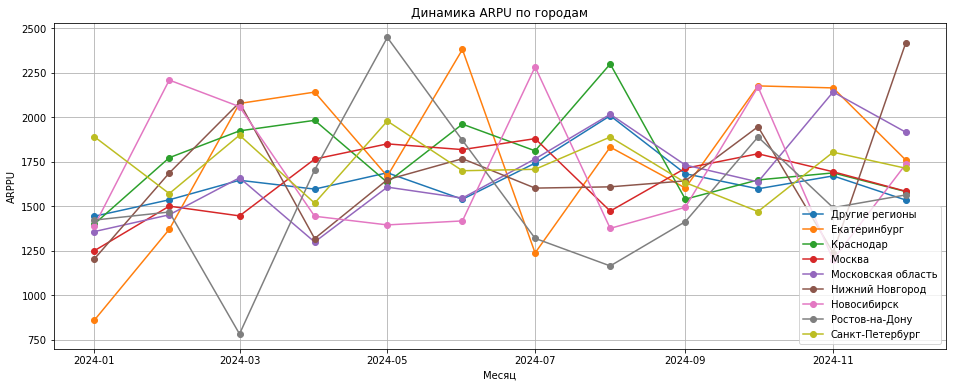

In [65]:
#Посмотрим на динамику ARPU и ARPPU помесячно
orders_r = pd.merge(orders, users[['user_id', 'region']], on = 'user_id', how = 'left') 
revenue_per_month = orders_r.groupby(['order_month', 'region'], as_index = False)['revenue'].sum().rename(columns = {'order_month':'month'})
#так как считаем ARPU, учитываем даже не платящих пользователей по датафрейму sessions
all_users = sessions.groupby(['session_month', 'region'], as_index = False)['user_id'].nunique().rename(columns = {'session_month':'month',
                                                                                            'user_id':'all_users'})
paying_users = orders_r.groupby(['order_month', 'region'], as_index = False)['user_id'].nunique().rename(columns = {'order_month':'month',
                                                                                                     'user_id':'paying_users'})
#объединяем данные
merged = pd.merge(revenue_per_month, all_users, how = 'left', on = ['month', 'region'])
merged = pd.merge(merged, paying_users, how = 'left', on = ['month', 'region'])
merged['arpu'] = merged['revenue'] / merged['all_users']
merged['arppu'] = merged['revenue'] / merged['paying_users']

#Построим график динамики ARPU
plt.figure(figsize = (16,6))
for region in merged['region'].unique():
    df_plot = merged[merged['region'] == region]
    plt.plot(df_plot['month'], df_plot['arpu'], label = f'{region}', marker = 'o')
plt.title('Динамика ARPU по городам')
plt.xlabel('Месяц')
plt.ylabel('ARPU')
plt.grid()
plt.legend()
plt.show()

#Построим график динамики ARPPU
plt.figure(figsize = (16,6))
for region in merged['region'].unique():
    df_plot = merged[merged['region'] == region]
    plt.plot(df_plot['month'], df_plot['arppu'], label = f'{region}', marker = 'o')
plt.title('Динамика ARPU по городам')
plt.xlabel('Месяц')
plt.ylabel('ARPPU')
plt.grid()
plt.legend()
plt.show()

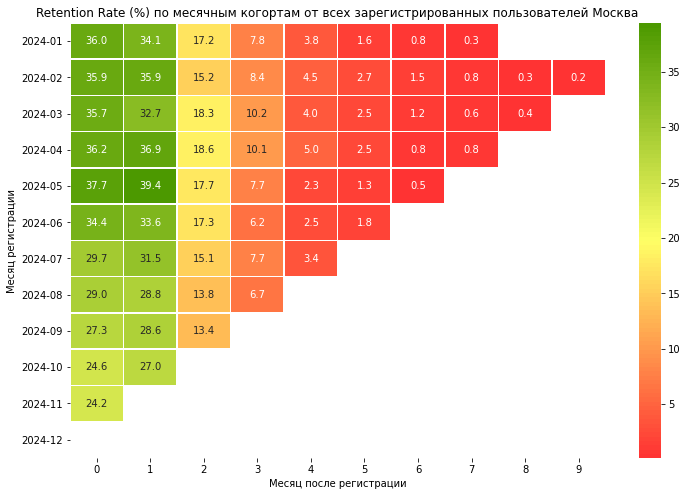

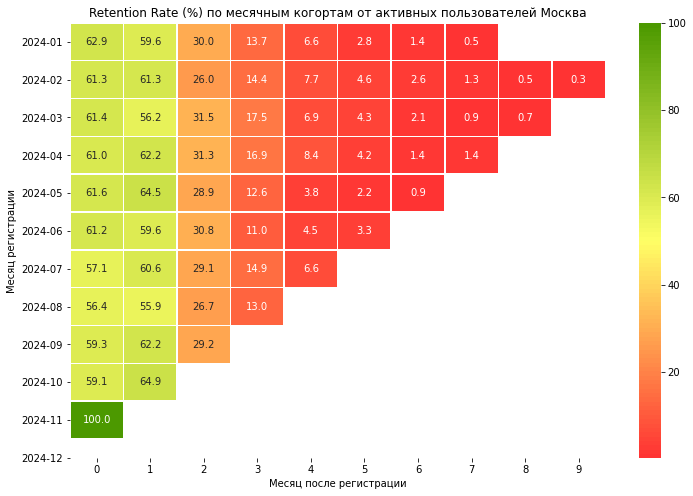

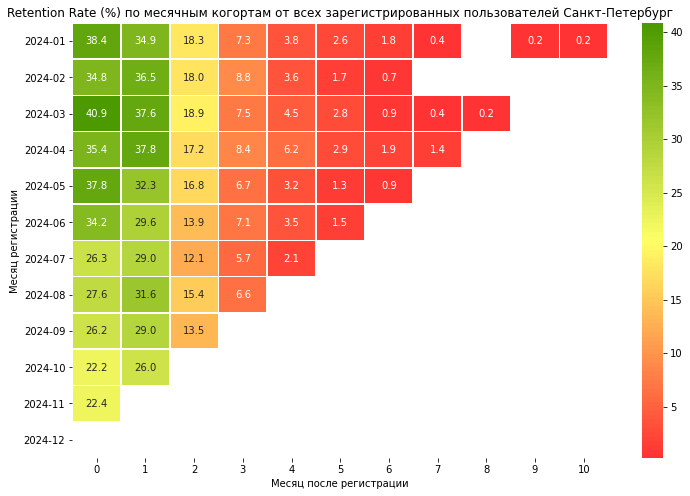

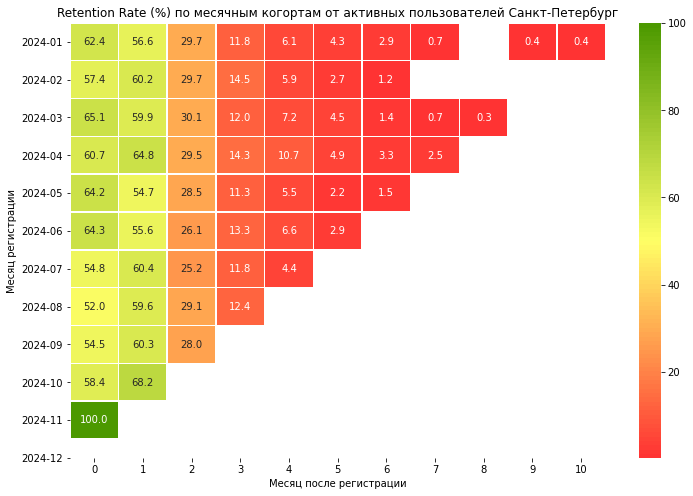

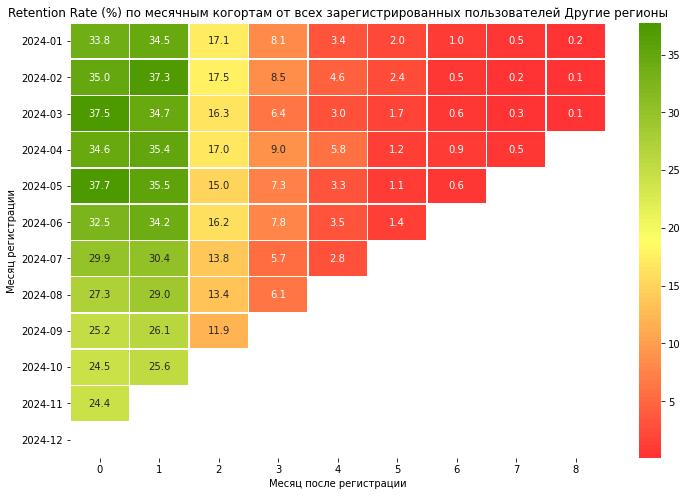

...

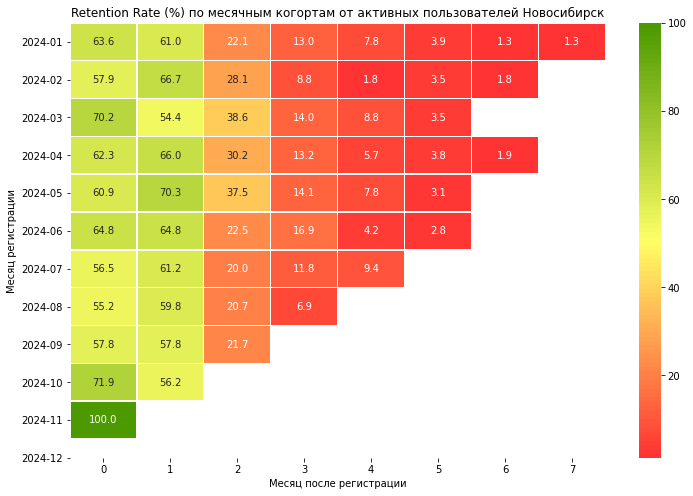

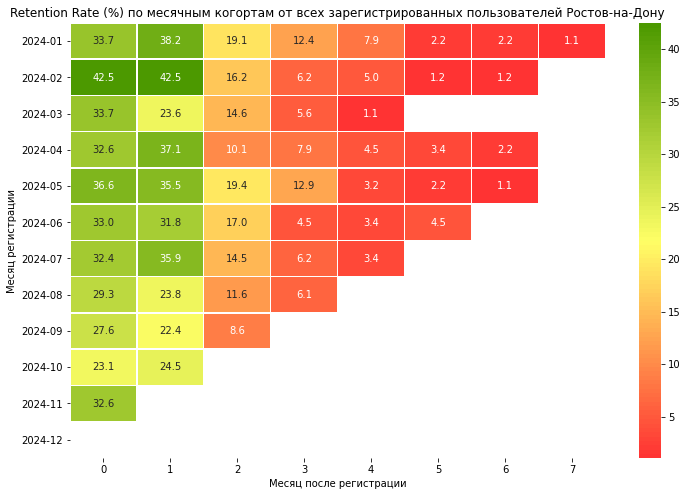

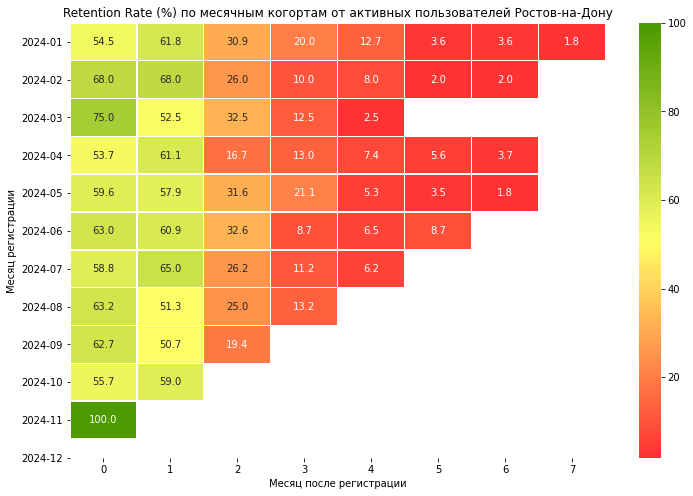

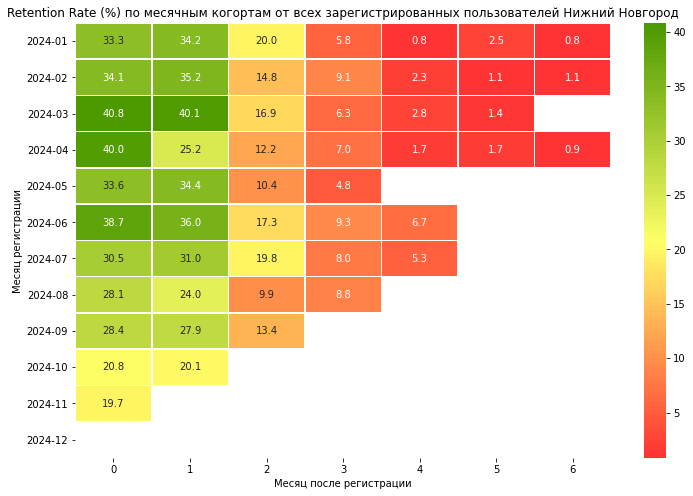

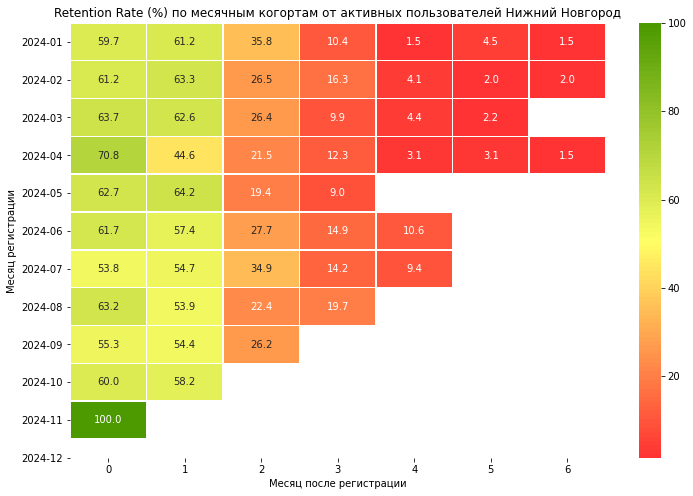

In [66]:
#Подготовим новый датафрейм 
df_month_activity_region = pd.merge(
    sessions[['user_id', 'session_month']],
    users[['user_id', 'cohort_month', 'region']],
    on='user_id',
    how='right'
)

# Удаляем записи, где активность была ДО регистрации
df_month_activity_region = df_month_activity_region[df_month_activity_region['session_month'] >= df_month_activity_region['cohort_month']]

# Рассчитываем период (n месяцев после регистрации)
df_month_activity_region['n_period'] = (
(df_month_activity_region['session_month'].dt.to_period('M') - 
     df_month_activity_region['cohort_month'].dt.to_period('M')).apply(lambda x: x.n))

# Удаляем последний месяц (неполные данные)
last_month = df_month_activity_region['session_month'].max()
df_month_activity_region = df_month_activity_region[df_month_activity_region['session_month'] < last_month]


for region in df_month_activity_region['region'].unique():
    df_plot = df_month_activity_region[df_month_activity_region['region'] == region]
    # Размеры когорт (все зарегистрированные пользователи)
    cohort_sizes_all = users[users['region'] == region].groupby(['cohort_month'])['user_id'].nunique()
    cohort_sizes_active = df_plot.groupby(['cohort_month'])['user_id'].nunique()
# Создаем сводную таблицу
    pivot_month_activity_region = df_plot.pivot_table(
    index='cohort_month',
    columns='n_period',
    values='user_id',
    aggfunc='nunique'
)

# Расчет Retention Rate
    retention_rate_all = pivot_month_activity_region.div(cohort_sizes_all, axis=0) * 100
    retention_rate_active = pivot_month_activity_region.div(cohort_sizes_active, axis=0) * 100

    cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900'], N=100)
# Визуализация retention от всех зарегистрированных пользователей

# Форматируем даты когорт для подписей
    formatted_labels = [dt.strftime('%Y-%m') for dt in retention_rate_all.index]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(
    retention_rate_all,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels)
    plt.title(f'Retention Rate (%) по месячным когортам от всех зарегистрированных пользователей {region}')
    plt.xlabel('Месяц после регистрации')
    plt.ylabel('Месяц регистрации')
    plt.show()

# Визуализация retention от активных пользователей
    plt.figure(figsize=(12, 8))
    sns.heatmap(
    retention_rate_active,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels
)
    plt.title(f'Retention Rate (%) по месячным когортам от активных пользователей {region}')
    plt.xlabel('Месяц после регистрации')
    plt.ylabel('Месяц регистрации')
    plt.show()

Заметим, что Retention rate от всех зарегистрированных пользователей в первый месяц после регистрации у всех когорт во всех рнгионах ниже 50% процентов. Это показатель того, что более половины пользователей, совершивших регистрацию, и вовсе не возвращаются в продукт. При этом заметим, что начиная с июльской когорты происходит снижение удержания во всех регионах - это еще раз подтверждает гипотезу о росте некачественного трафика. 
______________

**Вывод 2**

Retention Rate от активных пользователей указывает на проблему долгосрочного удержания среди всех когорт и регионов - от 60 до 80% и более активных в первый месяц пользователей теряются к третьем месяцу. Для решения этой проблемы необходимо ввести систему стимуляции активности: push-уведомления и другие напоминания.  
________________

Посмотрим на распределение пользователей по покупательским сегментам в разрезе региона - возможно, сможем получить интересный инсайт и дать идею бизнесу. 


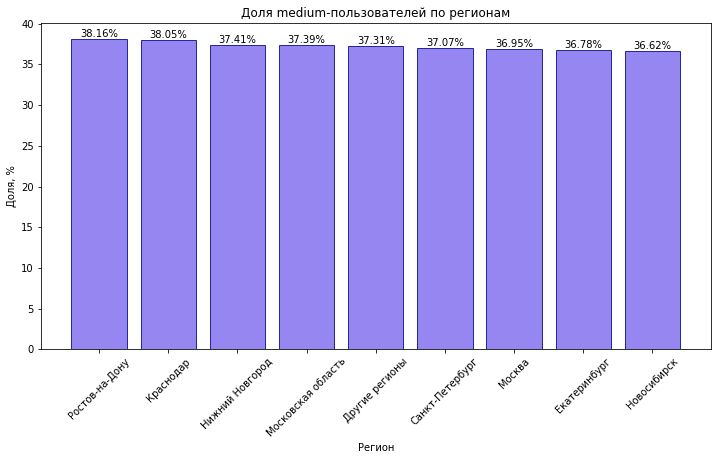

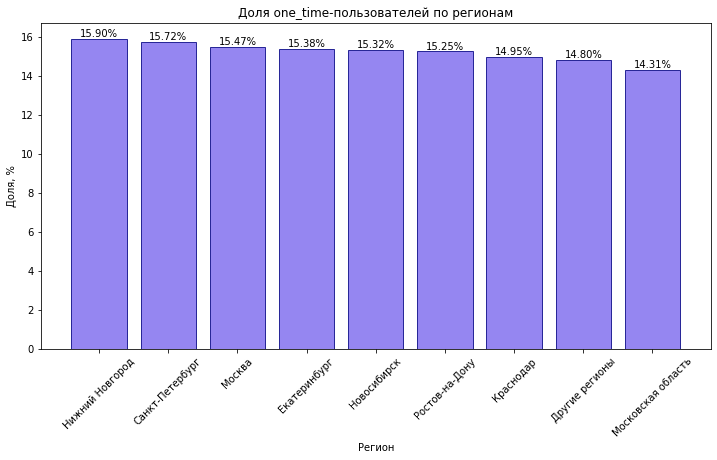

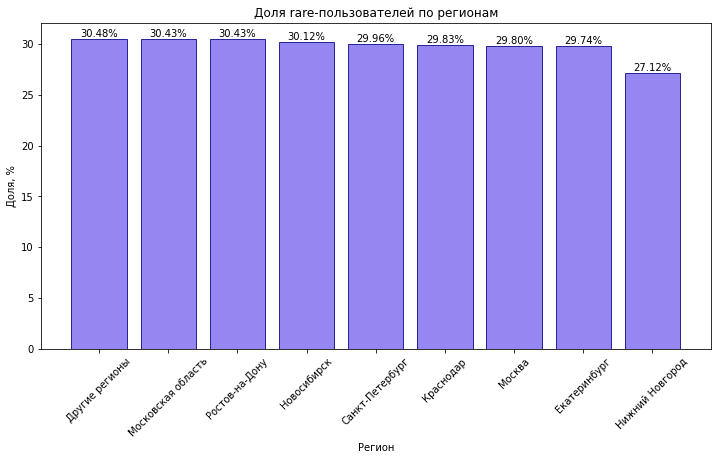

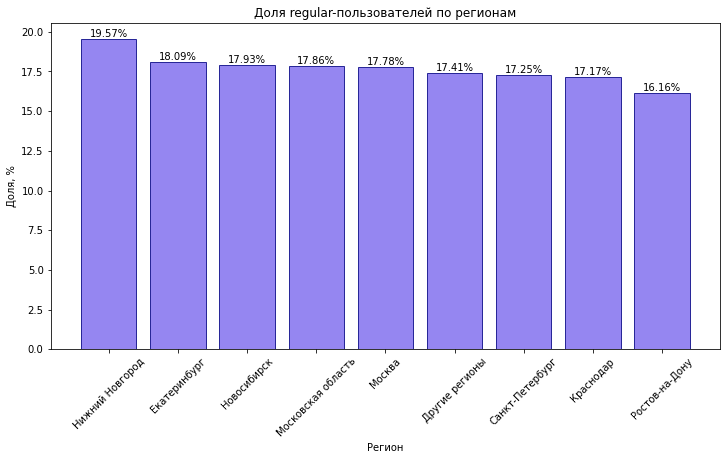

In [67]:
buyer_segments = users.groupby(['region', 'buyer_segment'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
buyer_segments = pd.merge(users_region, buyer_segments, on = 'region', how = 'left')
buyer_segments['part'] = buyer_segments['users'] / buyer_segments['user_id'] * 100
for segment in buyer_segments['buyer_segment'].unique():
    df_plot = buyer_segments[buyer_segments['buyer_segment'] == segment].sort_values(by = 'part', ascending = False)
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['region'], df_plot['part'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Доля {segment}-пользователей по регионам')
    plt.xlabel('Регион')
    plt.ylabel('Доля, %')
    plt.xticks(rotation = 45)
    plt.show()

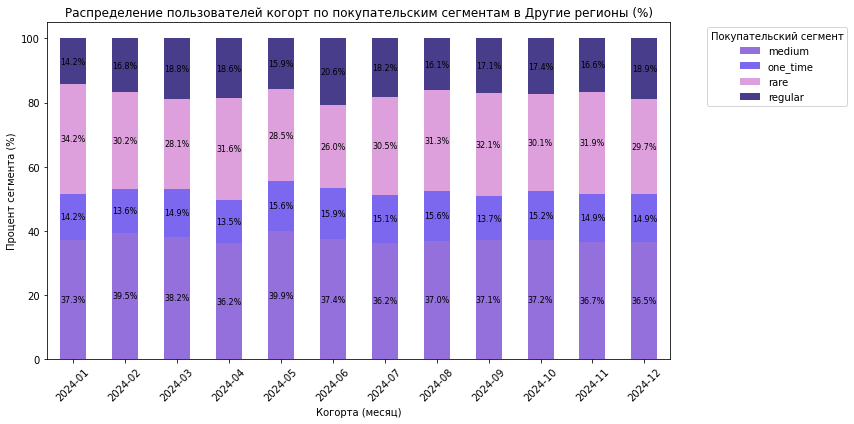

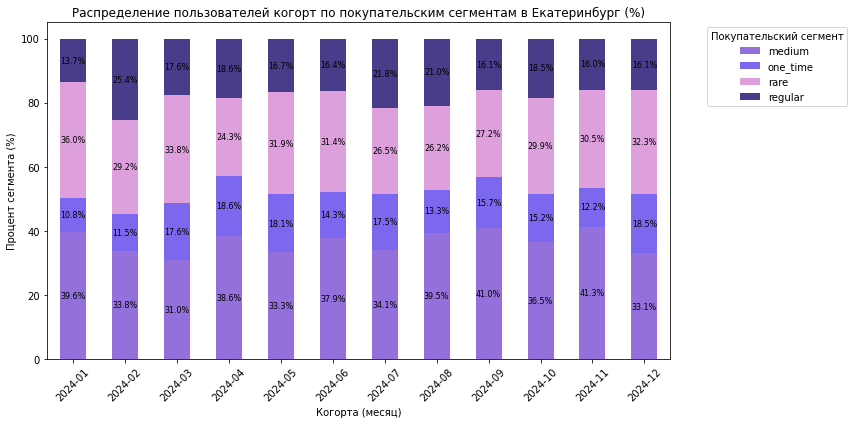

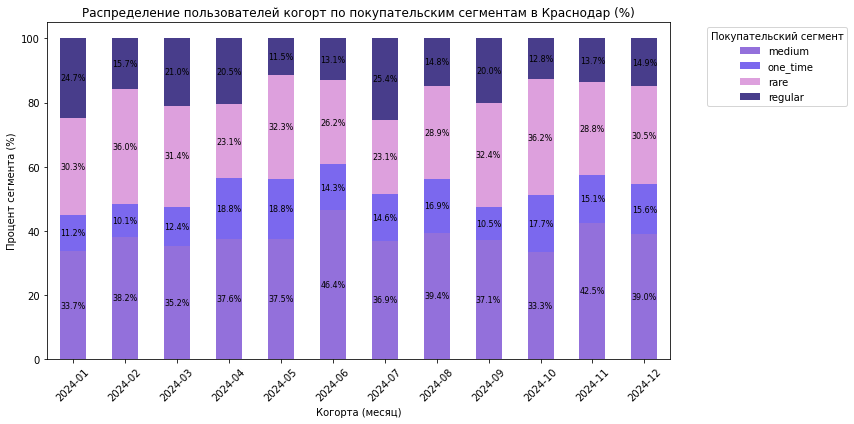

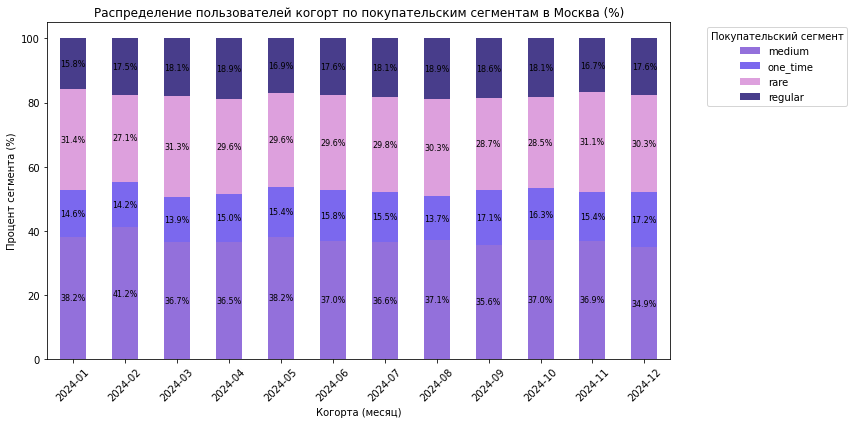

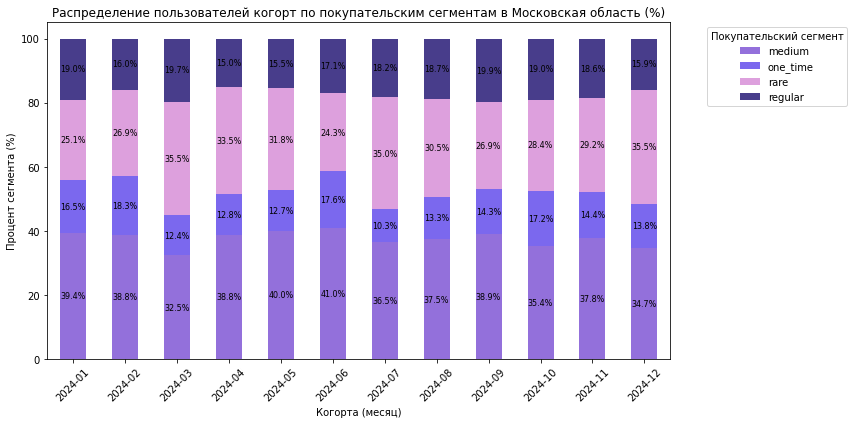

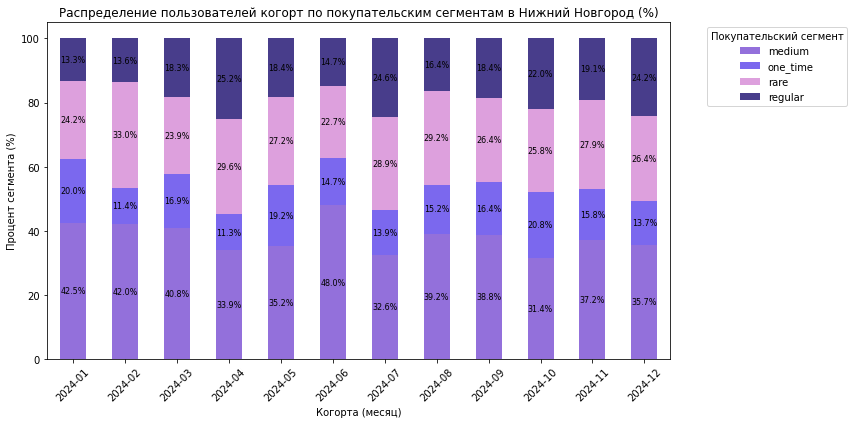

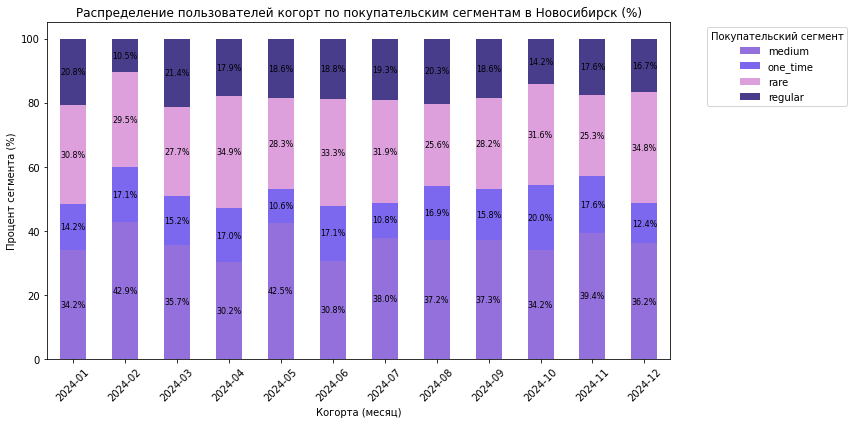

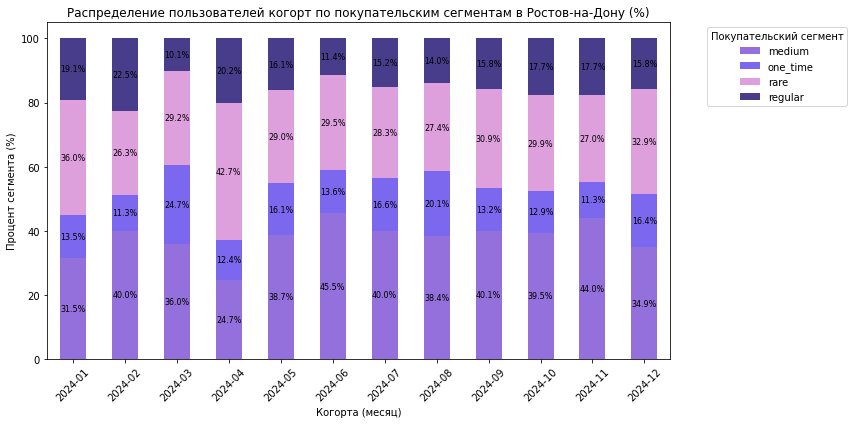

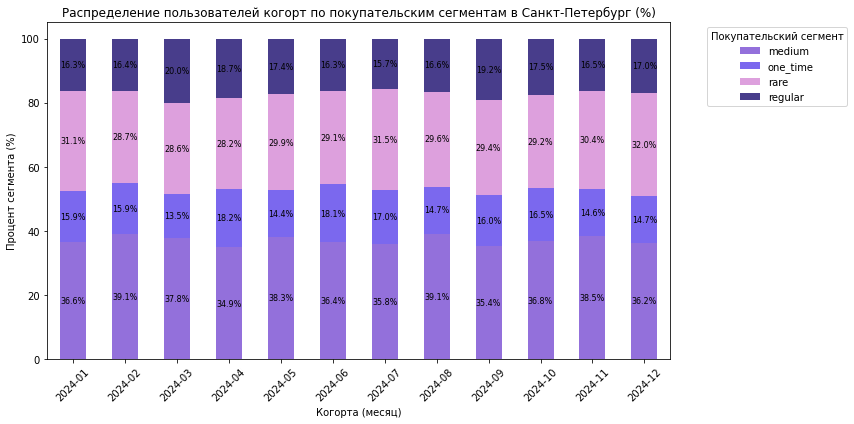

In [68]:
buyer_segments = users.groupby(['region', 'buyer_segment', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
users_region_cohorts = users.groupby(['region', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'cohort_users'})
buyer_segments = pd.merge(users_region_cohorts, buyer_segments, on = ['region', 'cohort_month'], how = 'left')
buyer_segments['part'] = buyer_segments['users'] / buyer_segments['cohort_users'] * 100
for region in buyer_segments['region'].unique():
    df_plot = buyer_segments[buyer_segments['region'] == region]
    pivot_df = df_plot.pivot(index='cohort_month', columns='buyer_segment', values='part').fillna(0)
    pivot_df.index = pivot_df.index.strftime('%Y-%m')
    # Строим гистограмму с накоплением
    ax = pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6), color = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей когорт по покупательским сегментам в {region} (%)')
    plt.xlabel('Когорта (месяц)')
    plt.ylabel('Процент сегмента (%)')
    plt.legend(title='Покупательский сегмент', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    for bars in ax.containers:
        heights = [bar.get_height() for bar in bars]
        y_positions = [bar.get_y() + bar.get_height()/2 for bar in bars]
        for bar, height, y_pos in zip(bars, heights, y_positions):
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2, 
                    y_pos, 
                    f'{height:.1f}%', 
                    ha='center', 
                    va='center',
                    fontsize=8,
                    color='black')

Анализ распределения пользователей по сегментам в разных регионах показывает удивительно стабильную картину без существенных различий. Во всех регионах, включая Москву, Санкт-Петербург и менее населенные города, сохраняется практически идентичная структура сегментов: наибольшую долю занимают пользователи medium (36-38%), следом идут rare (29-30%), затем regular (17-19%) и one_time (14-16%). Незначительные отклонения в пределах 1-2% не формируют статистически значимой разницы между регионами. Особенно показательно, что даже в городах-миллионниках (Екатеринбург, Новосибирск) и менее крупных региональных центрах (Ростов-на-Дону, Краснодар) распределение повторяется с минимальными вариациями. Единственное слабо выраженное отличие — чуть более высокая доля regular-покупателей в Нижнем Новгороде (19.57%) и Екатеринбурге (18.09%) по сравнению с другими регионами, но эта разница недостаточна для выявления устойчивой региональной специфики. Такая унификация поведенческих паттернов свидетельствует либо о высокой стандартизации пользовательского опыта на платформе, либо о недостаточной локализации маркетинговых стратегий, не учитывающих потенциальные региональные особенности спроса.

Анализ динамики распределения покупательских сегментов показывает стабильность во всех городах — значительных изменений в структуре сегментов не наблюдается. В Санкт-Петербурге сохраняется баланс между разовыми и постоянными покупателями, тогда как в Московской области и Нижнем Новгороде стабильно преобладают лояльные клиенты. Месячные колебания долей незначительны, что свидетельствует об устойчивости сложившейся модели покупательского поведения. Это позволяет сделать вывод о предсказуемости аудитории и отсутствии резких изменений в её предпочтениях на протяжении всего анализируемого периода.

Посмотрим на распределение по пользовательским сегментам в различных регионах.

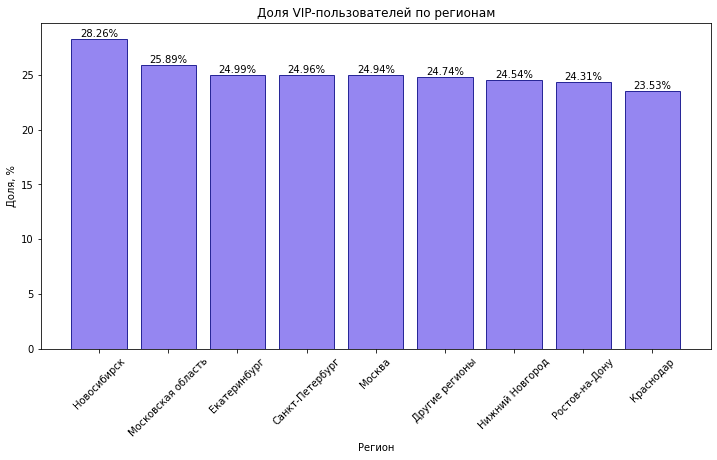

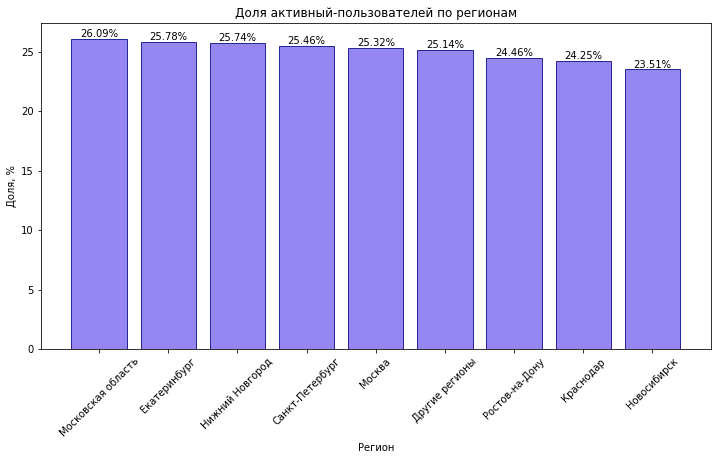

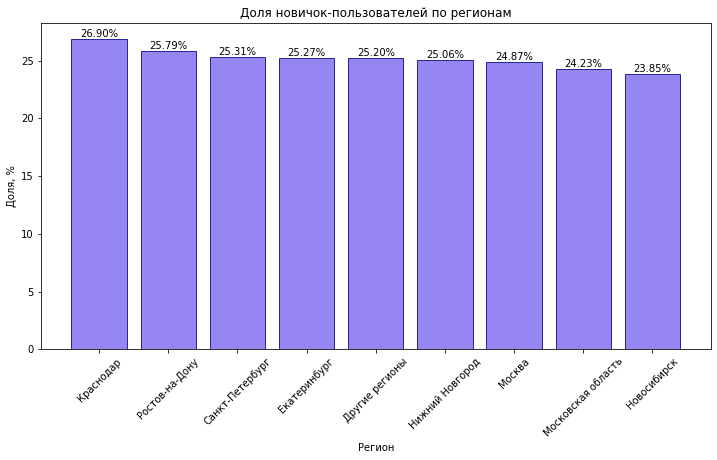

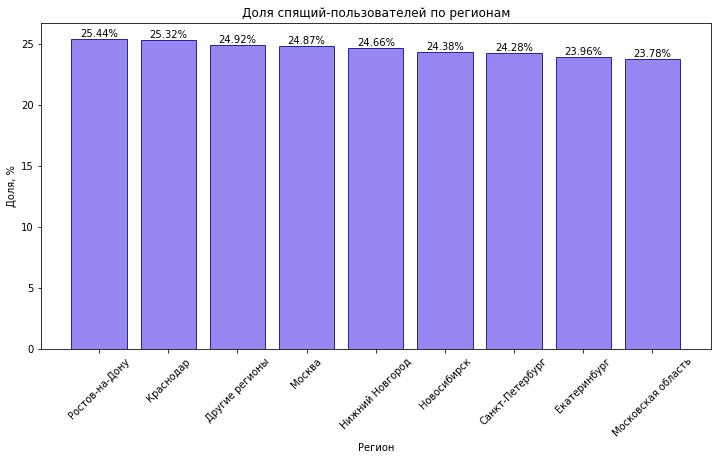

In [69]:
user_segments = users.groupby(['region', 'user_segment'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
user_segments = pd.merge(users_region, user_segments, on = 'region', how = 'left')
user_segments['part'] = user_segments['users'] / user_segments['user_id'] * 100
for segment in user_segments['user_segment'].unique():
    df_plot = user_segments[user_segments['user_segment'] == segment].sort_values(by = 'part', ascending = False)
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['region'], df_plot['part'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Доля {segment}-пользователей по регионам')
    plt.xlabel('Регион')
    plt.ylabel('Доля, %')
    plt.xticks(rotation = 45)
    plt.show()

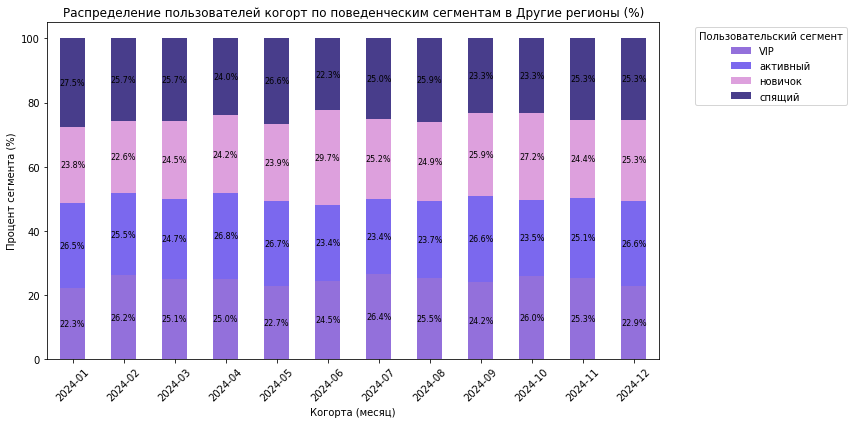

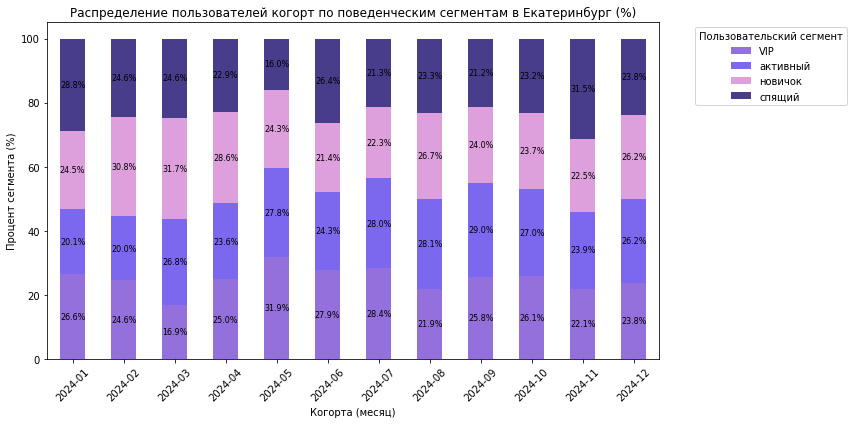

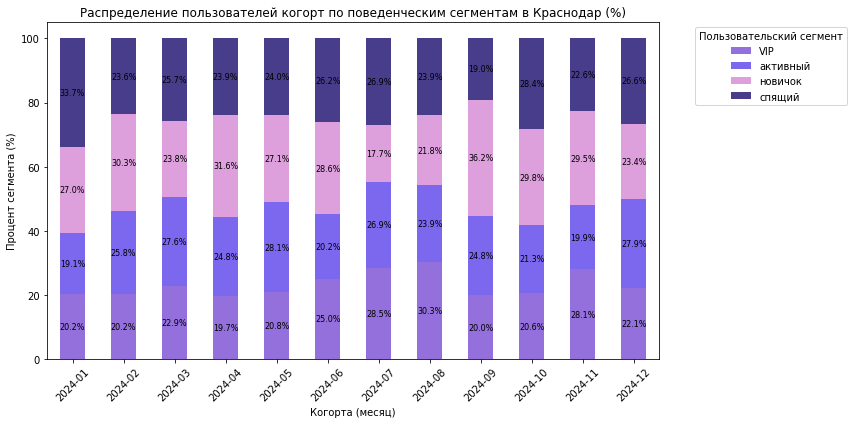

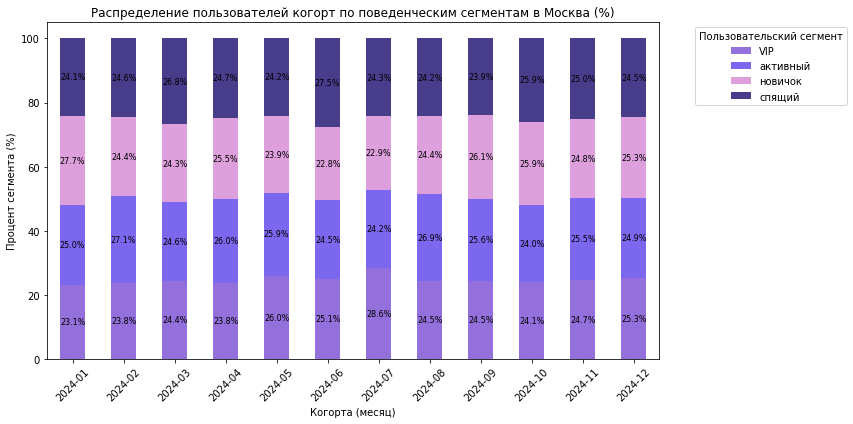

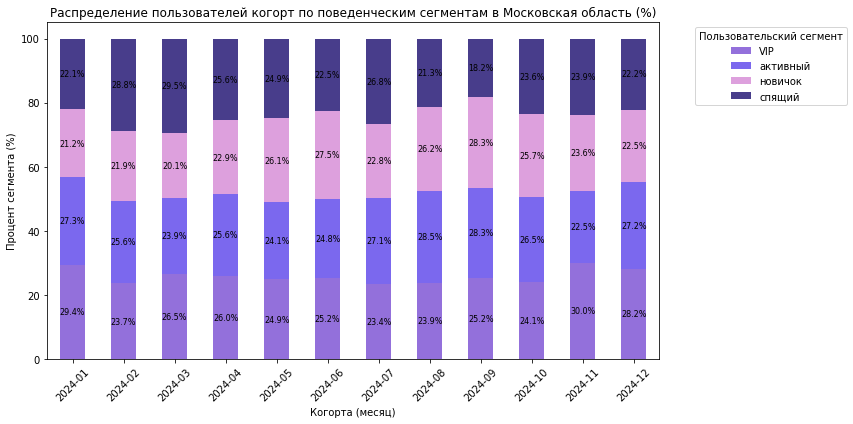

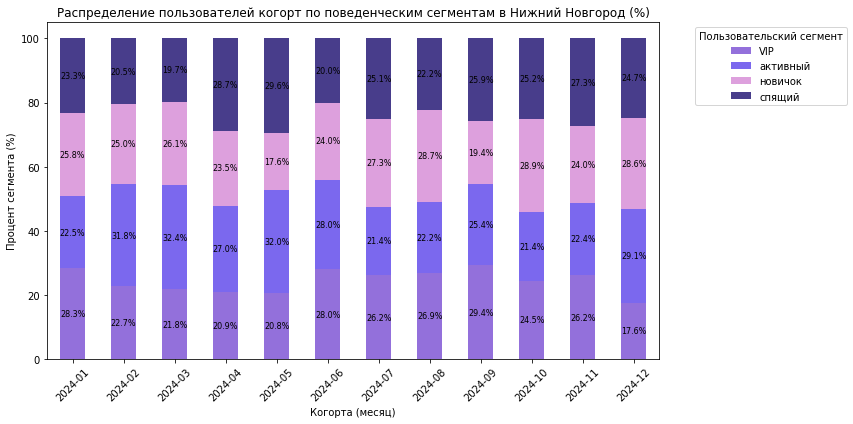

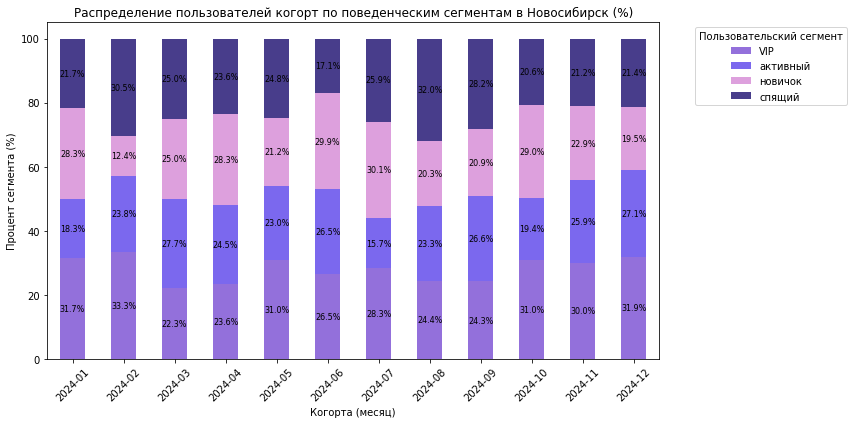

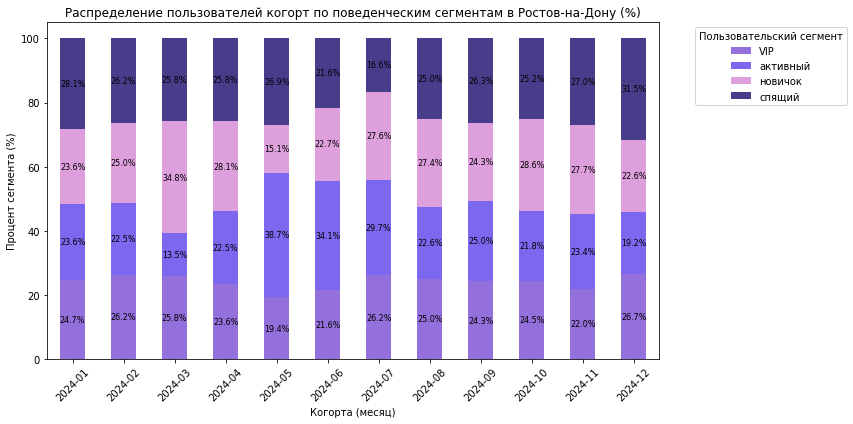

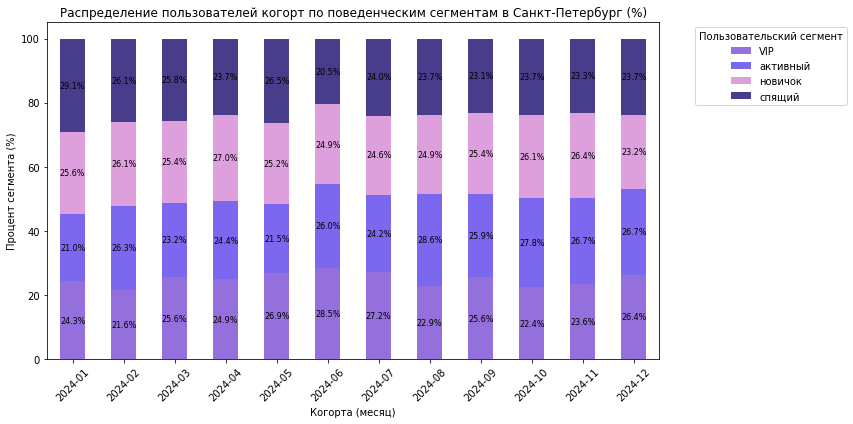

In [70]:
user_segments = users.groupby(['region', 'user_segment', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
user_segments = pd.merge(users_region_cohorts, user_segments, on = ['region', 'cohort_month'], how = 'left')
user_segments['part'] = user_segments['users'] / user_segments['cohort_users'] * 100
for region in user_segments['region'].unique():
    df_plot = user_segments[user_segments['region'] == region]
    pivot_df = df_plot.pivot(index='cohort_month', columns='user_segment', values='part').fillna(0)
    pivot_df.index = pivot_df.index.strftime('%Y-%m')
    # Строим гистограмму с накоплением
    ax = pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6), color = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей когорт по поведенческим сегментам в {region} (%)')
    plt.xlabel('Когорта (месяц)')
    plt.ylabel('Процент сегмента (%)')
    plt.legend(title='Пользовательский сегмент', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    for bars in ax.containers:
        heights = [bar.get_height() for bar in bars]
        y_positions = [bar.get_y() + bar.get_height()/2 for bar in bars]
        for bar, height, y_pos in zip(bars, heights, y_positions):
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2, 
                    y_pos, 
                    f'{height:.1f}%', 
                    ha='center', 
                    va='center',
                    fontsize=8,
                    color='black')

Анализ данных выявил равномерное распределение пользователей по пользовательским сегментам во всех регионах. Картина настолько однородна, что различия между Москвой, миллионниками и провинцией оказываются минимальными - все четыре категории пользователей (VIP, активные, новички и спящие) стабильно занимают около 25% аудитории в каждом регионе.

Однако в этой стройной картине есть интересный момент - Новосибирск незначительно выбивается из общего ряда - здесь доля VIP-клиентов подскакивает до 28%, тогда как в других городах она держится на уровне 24-25%.

Анализ динамики покупательских сегментов по регионам в динамике показывает стабильное распределение без резких колебаний: во всех городах сохраняется баланс между сегментами VIP (20-30%), активными (20-27%), новичками (20-28%) и спящими (20-26%) клиентами. Наибольшая доля VIP-клиентов наблюдается в Новосибирске (до 33%) и Московской области (до 30%), тогда как в Санкт-Петербурге и Краснодаре выше доля новичков (до 29-36%). При этом в Екатеринбурге и Нижнем Новгороде отмечается чуть более высокая волатильность долей между месяцами, особенно в сегменте новичков (колебания до 10-15%). В целом структура сегментов остается предсказуемой, что свидетельствует об устойчивости покупательского поведения. Для роста конверсии стоит обратить внимание на регионы с повышенной долей новичков (Краснодар, Ростов-на-Дону), где можно усилить программы лояльности для их перевода в активные и VIP-сегменты.

In [71]:
order_product_all = orders_region.groupby(['region'])['order_id'].nunique().reset_index().rename(columns = {'order_id':'total_orders'})
order_product = orders_region.groupby(['region', 'category_name'])['order_id'].nunique().reset_index()
order_product = pd.merge(order_product_all, order_product, on = 'region', how = 'left')
order_product['part'] = order_product['order_id'] / order_product['total_orders'] * 100
order_product = order_product.sort_values(by = ['region', 'part'], ascending = False)
# Для каждого региона выбираем топ-3 товара
top_products_by_region = order_product.groupby('region').head(3).reset_index(drop=True)

In [72]:
display('Топ-3 категории товаров по регионам России')
top_products_by_region

'Топ-3 категории товаров по регионам России'

,region,total_orders,category_name,order_id,part
0,Санкт-Петербург,4667,Продукты питания,625,13.39
1,Санкт-Петербург,4667,Сумки и аксессуары,206,4.41
2,Санкт-Петербург,4667,Детская одежда,203,4.35
3,Ростов-на-Дону,906,Продукты питания,120,13.25
4,Ростов-на-Дону,906,Аксессуары для гаджетов,52,5.74
5,Ростов-на-Дону,906,Одежда для спорта,44,4.86
6,Новосибирск,1072,Продукты питания,120,11.19
7,Новосибирск,1072,Детские игрушки,67,6.25
8,Новосибирск,1072,Детская одежда,58,5.41
9,Нижний Новгород,1224,Продукты питания,185,15.11


Мы видим, что топ-1 во всех регионах - это продукты питания. 
Но некоторые регионы заметно отличаются своими категориями. Эти нишевые категории (зоотовары, детские товары, гаджеты) — ключ к увеличению среднего чека. Маркетплейсу можно попробовать локализацию ассортимента и персонализированные акции, учитывая региональные предпочтения. 

Инсайт: среди пользователей из Новосибирска особенно популярны детские товары (около 11% от всех продаж).

Можно создать региональные маркетинговые стратегии. Например:
- В Новосибирске топ-2 и топ-3 занимают детские игрушки и детская одежда. Поэтому можно создать раздел «Топ детских товаров» (игрушки + одежда = 11.66% заказов).
Гипотеза, которую нужно проверить - добавление этого раздела повысит средний чек и количество продаж.
Также для Новосибирска можно создавать региональные акции по этим категориям. 
- В Екатеринбурге можно выводить в топ готовые наборы для новорожденных, а для остальных регионов — школьные наборы из книг и канцтоваров к 1 сентября. 
- Для всех регионов внедрить раздел 'Топ продуктов питания' или что-то подобное. 

________________

**Промежуточный вывод по региональной сегментации**

Анализ данных показывает системные проблемы с удержанием и конверсией новых пользователей, которые носят общеплатформенный характер и не связаны с региональными особенностями. С июля наблюдается одновременное снижение конверсии в заказ и Retention Rate во всех регионах, что указывает на приток некачественного трафика по всем каналам привлечения. Критически низкий Retention (менее 50% в первый месяц) и высокий отток активных пользователей (60-80% уходят к третьему месяцу) требуют срочного пересмотра онбординга и системы вовлечения.

При этом распределение пользователей по сегментам активности демонстрирует однородность по всем регионам (VIP, активные, новички и спящие стабильно составляют около 25% каждый), за исключением незначительного превышения доли VIP в Новосибирске (28%). Это свидетельствует о стандартизированном, но недостаточно персонализированном пользовательском опыте.

Рекомендуемые действия:

- Оптимизировать каналы привлечения для повышения качества трафика

- Внедрить систему push-уведомлений и триггерных коммуникаций

- Проработать региональные особенности Новосибирска как позитивного кейса

- Протестировать региональную персонализацию товаров исходя из топ-3 продаваемых категорий

- Внедрить отдельный раздел с продуктами питания для всех регионов. 
_______________

Сегментируем пользователей по типу устройства и посмотрим, есть ли связь с проблемами бизнеса.

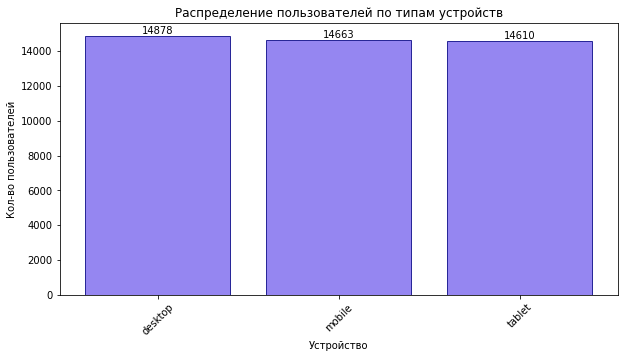

In [73]:
#Смотрим на распределение пользователей по типу устройств
users_devices = users.groupby('device')['user_id'].nunique().reset_index()

plt.figure(figsize = (10,5))
bars = plt.bar(users_devices['device'], users_devices['user_id'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.0f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Распределение пользователей по типам устройств')
plt.xlabel('Устройство')
plt.ylabel('Кол-во пользователей')
plt.xticks(rotation = 45)
plt.show()

Пользователи маркетплейса примерно одинаково (14610-12876) распределены по типу устройств - это указывает на хорошую сегментацию бизнеса. 
Посмотрим на динамику привлечения новых пользователей по когортам и типам устройств. 

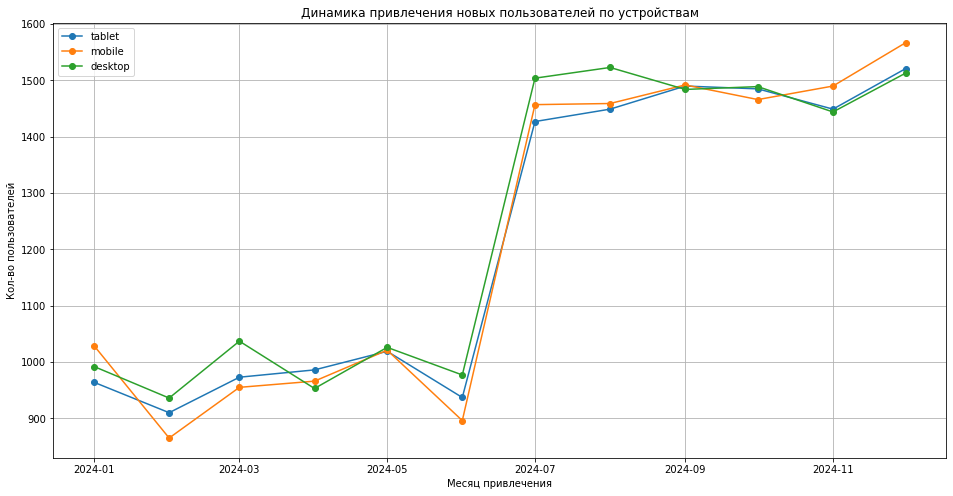

In [74]:
#Посмотрим динамику привлечения когорт по городам
#Смотрим число пользователей
users_device_cohorts = users.groupby(['cohort_month','device'])['user_id'].nunique().reset_index().sort_values(by = ['cohort_month'], ascending = False)
plt.figure(figsize = (16,8))
for device in users_device_cohorts['device'].unique():
    df_plot = users_device_cohorts[users_device_cohorts['device'] == device]
    plt.plot(df_plot['cohort_month'], df_plot['user_id'], label = f'{device}', marker = 'o')
    
plt.title('Динамика привлечения новых пользователей по устройствам')
plt.xlabel('Месяц привлечения')
plt.ylabel('Кол-во пользователей')
plt.legend()
plt.grid()
plt.show()

По графику, виден резкий скачок числа новых пользователей в июле и стабилизация на этом уровне в последующих месяцах. Посмотрим на общую конверсию из регистрации в заказ по типам устройств, а затем и по когортам. 

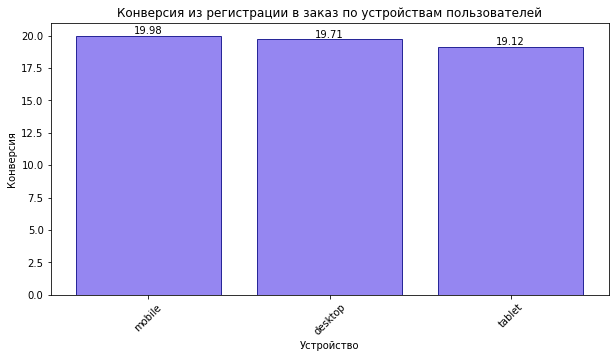

In [75]:
#Посмотрим конверсию из регистрации в заказ по устройствам
orders_devices = pd.merge(orders, users[['user_id', 'device', 'cohort_month']], how = 'left', on = 'user_id')
orders_devices_grouped = orders_devices.groupby('device')['user_id'].nunique().reset_index().rename(columns = {'user_id':'buyers'})
orders_devices_grouped = pd.merge(orders_devices_grouped, users_devices, how = 'right', on = 'device')
orders_devices_grouped['cr_to_order'] = orders_devices_grouped['buyers'] / orders_devices_grouped['user_id'] * 100
orders_devices_grouped = orders_devices_grouped.sort_values(by = ['cr_to_order'], ascending = False)

plt.figure(figsize = (10,5))
bars = plt.bar(orders_devices_grouped['device'], orders_devices_grouped['cr_to_order'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Конверсия из регистрации в заказ по устройствам пользователей')
plt.xlabel('Устройство')
plt.ylabel('Конверсия')
plt.xticks(rotation = 45)
plt.show()

Чуть выше конверсия у мобильной версии (19.98%), далее у десктопной (19.71%), а самая маленькая у tablet (19.12%). Однако это незначимые отличия, поэтому утверждать, что тип устройства влиет на конверсию в заказ, нельзя. 

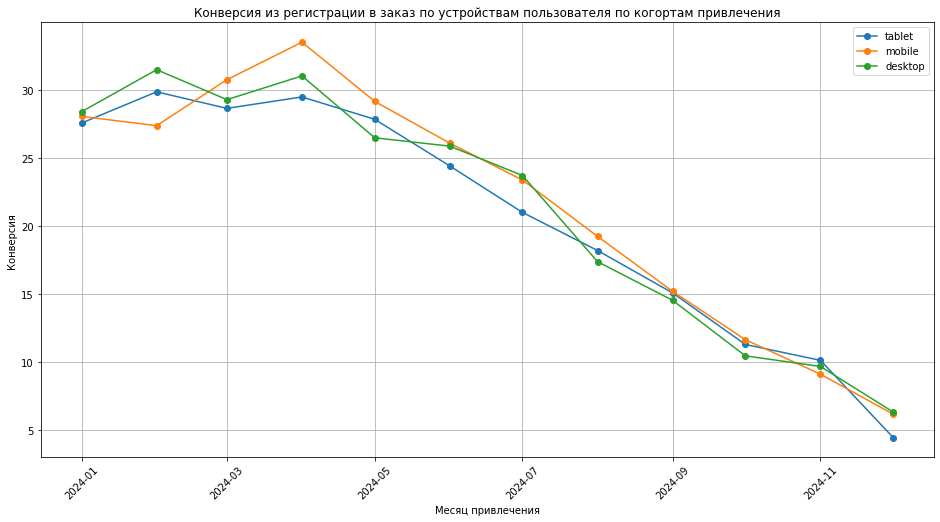

In [76]:
orders_devices_grouped = orders_devices.groupby(['cohort_month', 'device'])['user_id'].nunique().reset_index().rename(
    columns = {'user_id':'buyers'})
orders_devices_grouped = pd.merge(orders_devices_grouped, users_device_cohorts, how = 'right', on = ['cohort_month', 'device'])
orders_devices_grouped['cr_to_order'] = orders_devices_grouped['buyers'] / orders_devices_grouped['user_id'] * 100

plt.figure(figsize = (16,8))
for device in orders_devices_grouped['device'].unique():
    df_plot = orders_devices_grouped[orders_devices_grouped['device'] == device]
    plt.plot(df_plot['cohort_month'], df_plot['cr_to_order'], label = f'{device}', marker = 'o')
plt.title('Конверсия из регистрации в заказ по устройствам пользователя по когортам привлечения')
plt.xlabel('Месяц привлечения')
plt.ylabel('Конверсия')
plt.xticks(rotation = 45)
plt.grid()
plt.legend()
plt.show()

Видим, постепенное снижение конверсии на всех устройствах и во всех когортах, начиная с когорты мая. Это позволяет отвергнуть наше предположение о влиянии типа устройства на конверсии и, соотвественно, на ключевые показатели бизнеса.

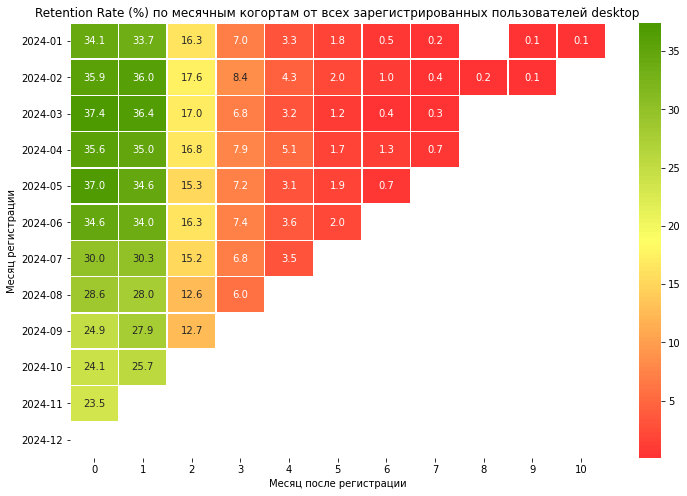

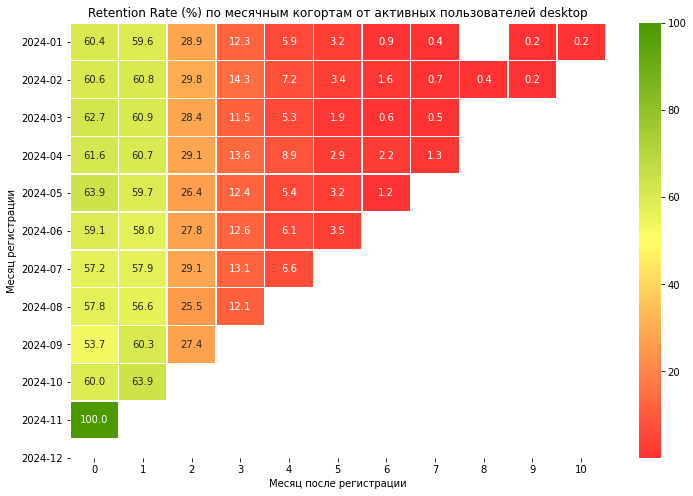

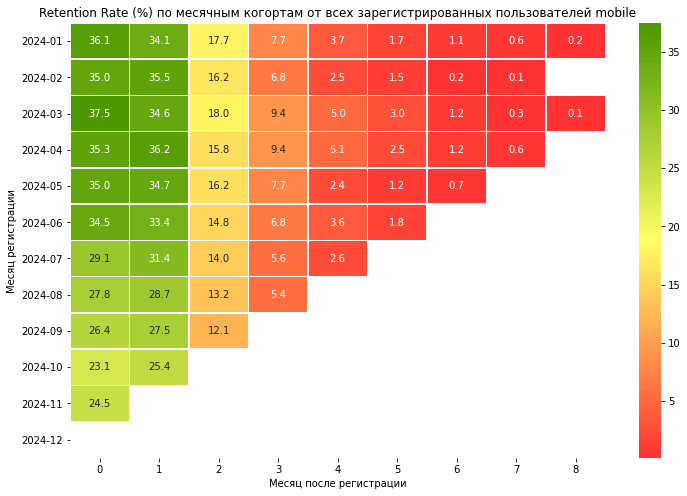

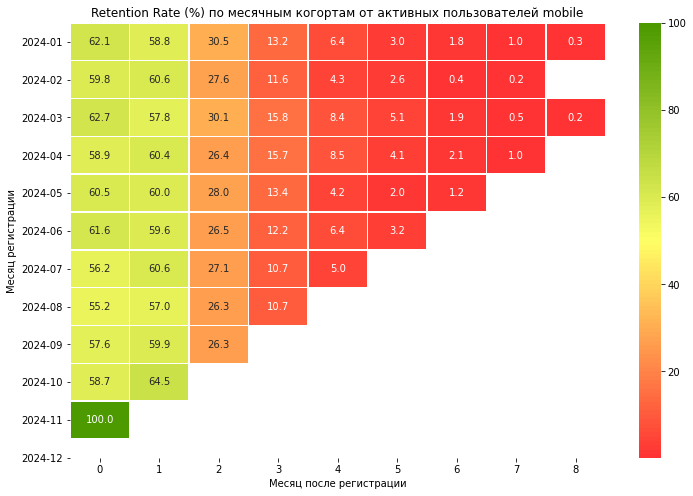

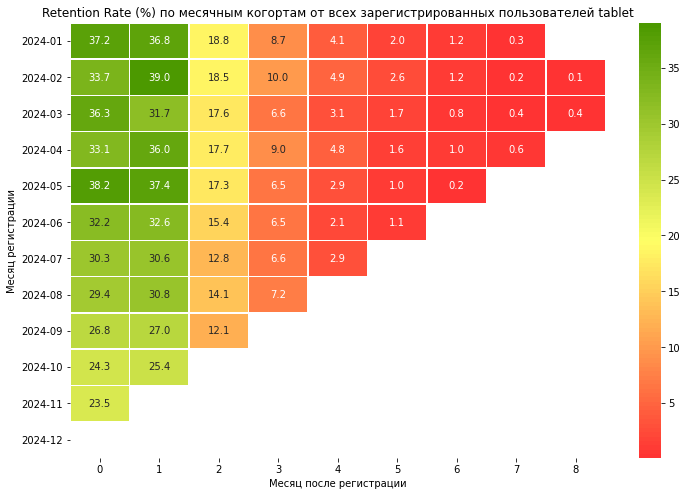

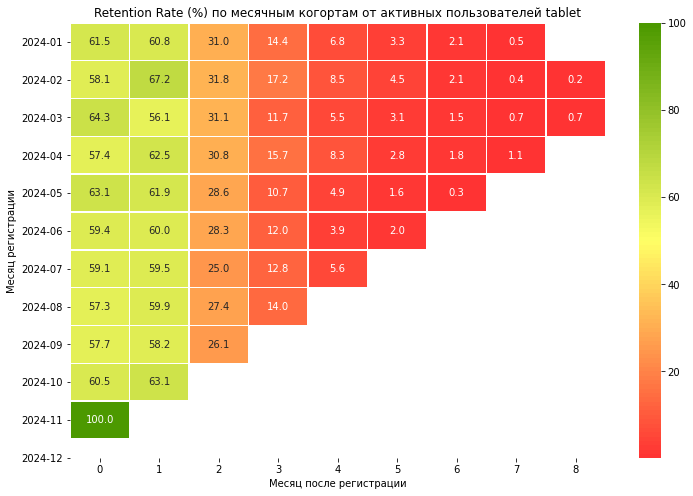

In [77]:
df_month_activity_device = pd.merge(
    sessions[['user_id', 'session_month']],
    users[['user_id', 'cohort_month', 'device']],
    on='user_id',
    how='right'
)

# Удаляем записи, где активность была ДО регистрации
df_month_activity_device = df_month_activity_device[df_month_activity_device['session_month'] >= df_month_activity_device['cohort_month']]

# Рассчитываем период (n месяцев после регистрации)
df_month_activity_device['n_period'] = (
(df_month_activity_device['session_month'].dt.to_period('M') - 
     df_month_activity_device['cohort_month'].dt.to_period('M')).apply(lambda x: x.n))

# Удаляем последний месяц (неполные данные)
last_month = df_month_activity_device['session_month'].max()
df_month_activity_device = df_month_activity_device[df_month_activity_device['session_month'] < last_month]


for device in df_month_activity_device['device'].unique():
    df_plot = df_month_activity_device[df_month_activity_device['device'] == device]
    # Размеры когорт (все зарегистрированные пользователи)
    cohort_sizes_all = users[users['device'] == device].groupby(['cohort_month'])['user_id'].nunique()
    cohort_sizes_active = df_plot.groupby(['cohort_month'])['user_id'].nunique()
# Создаем сводную таблицу
    pivot_month_activity_device = df_plot.pivot_table(
    index='cohort_month',
    columns='n_period',
    values='user_id',
    aggfunc='nunique'
)

# Расчет Retention Rate
    retention_rate_all = pivot_month_activity_device.div(cohort_sizes_all, axis=0) * 100
    retention_rate_active = pivot_month_activity_device.div(cohort_sizes_active, axis=0) * 100

    cmap = mcolors.LinearSegmentedColormap.from_list('green_red', ['#FF3333', '#FFFF66', '#4C9900'], N=100)
# Визуализация retention от всех зарегистрированных пользователей

# Форматируем даты когорт для подписей
    formatted_labels = [dt.strftime('%Y-%m') for dt in retention_rate_all.index]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(
    retention_rate_all,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels)
    plt.title(f'Retention Rate (%) по месячным когортам от всех зарегистрированных пользователей {device}')
    plt.xlabel('Месяц после регистрации')
    plt.ylabel('Месяц регистрации')
    plt.show()
    
    
# Визуализация retention от активных пользователей
    plt.figure(figsize=(12, 8))
    sns.heatmap(
    retention_rate_active,
    annot=True,
    fmt='.1f',
    cmap=cmap,
    linewidths=0.5,
    yticklabels=formatted_labels
)
    plt.title(f'Retention Rate (%) по месячным когортам от активных пользователей {device}')
    plt.xlabel('Месяц после регистрации')
    plt.ylabel('Месяц регистрации')
    plt.show()

Точно такая же ситуация как и с регионом - retention rate от всех зарегестрированных пользователей показывает небольшой спад с июльской когорты, а retention rate от активных пользователей на всех устройствах сильно просядает на 3 месяц. 

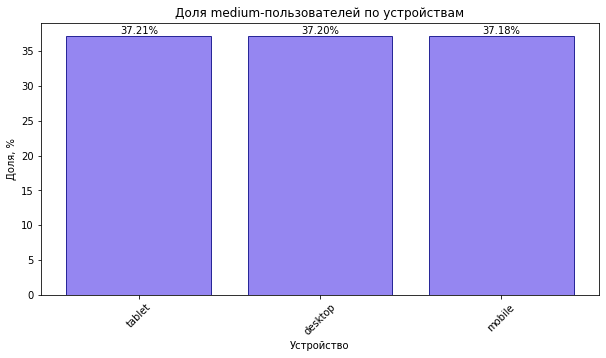

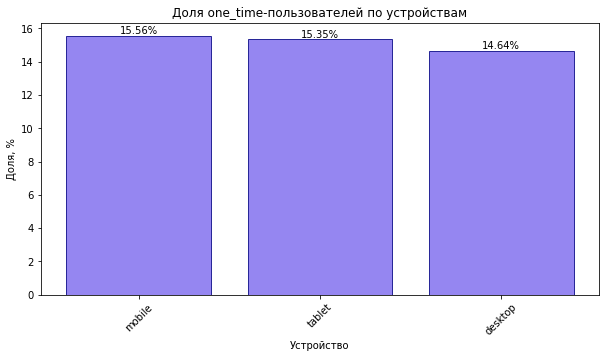

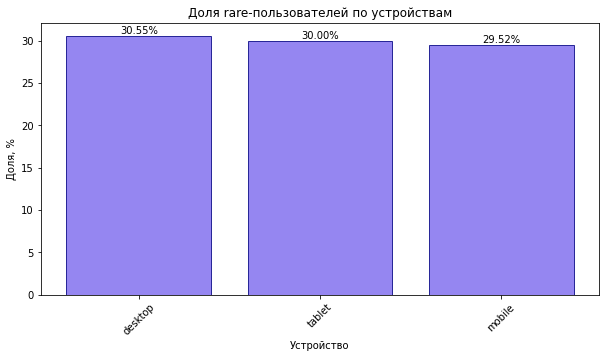

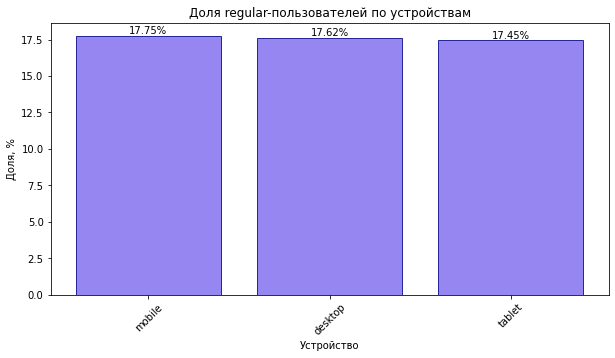

In [78]:
buyer_segments = users.groupby(['device', 'buyer_segment'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
buyer_segments = pd.merge(users_devices, buyer_segments, on = 'device', how = 'left')
buyer_segments['part'] = buyer_segments['users'] / buyer_segments['user_id'] * 100
for segment in buyer_segments['buyer_segment'].unique():
    df_plot = buyer_segments[buyer_segments['buyer_segment'] == segment].sort_values(by = 'part', ascending = False)
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['device'], df_plot['part'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Доля {segment}-пользователей по устройствам')
    plt.xlabel('Устройство')
    plt.ylabel('Доля, %')
    plt.xticks(rotation = 45)
    plt.show()

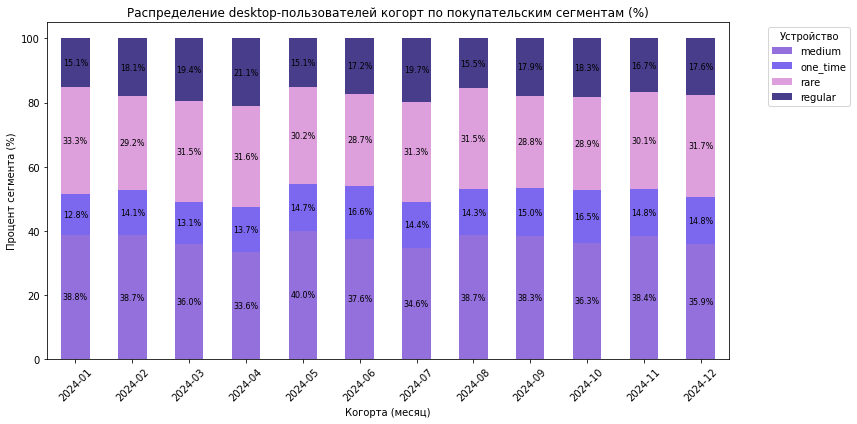

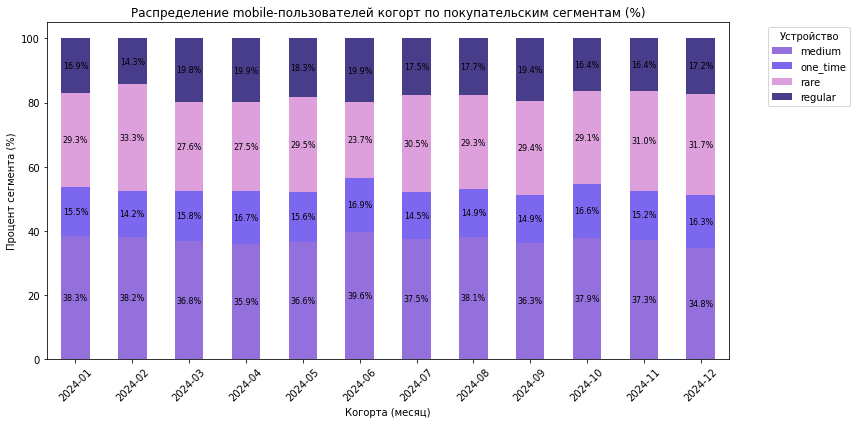

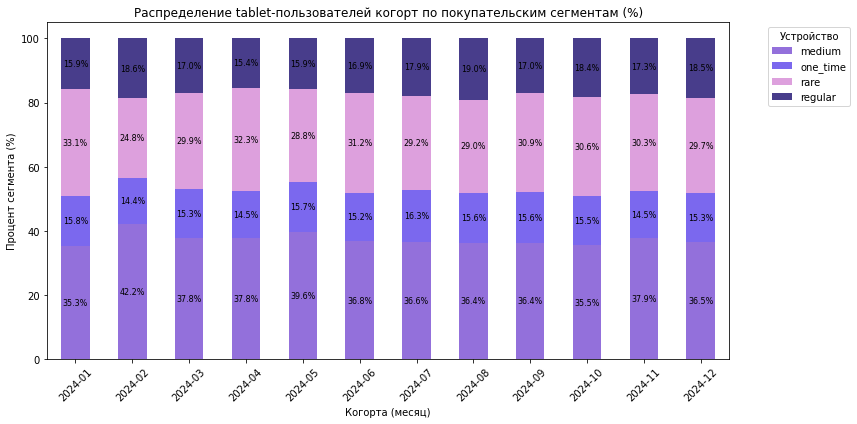

In [79]:
buyer_segments = users.groupby(['device', 'buyer_segment', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
users_device_cohorts = users.groupby(['device', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'cohort_users'})
buyer_segments = pd.merge(users_device_cohorts, buyer_segments, on = ['device', 'cohort_month'], how = 'left')
buyer_segments['part'] = buyer_segments['users'] / buyer_segments['cohort_users'] * 100
for device in buyer_segments['device'].unique():
    df_plot = buyer_segments[buyer_segments['device'] == device]
    pivot_df = df_plot.pivot(index='cohort_month', columns='buyer_segment', values='part').fillna(0)
    pivot_df.index = pivot_df.index.strftime('%Y-%m')
    # Строим гистограмму с накоплением
    ax = pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6), color = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение {device}-пользователей когорт по покупательским сегментам (%)')
    plt.xlabel('Когорта (месяц)')
    plt.ylabel('Процент сегмента (%)')
    plt.legend(title='Устройство', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    for bars in ax.containers:
        heights = [bar.get_height() for bar in bars]
        y_positions = [bar.get_y() + bar.get_height()/2 for bar in bars]
        for bar, height, y_pos in zip(bars, heights, y_positions):
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2, 
                    y_pos, 
                    f'{height:.1f}%', 
                    ha='center', 
                    va='center',
                    fontsize=8,
                    color='black')

Распределение покупательских сегментов по типам устройств схоже: независимо от платформы (десктоп, мобильные устройства или планшеты) структура аудитории остается практически идентичной. Во всех случаях наибольшую долю составляют пользователи сегмента medium (37,18-37,21%), за ними следуют rare (29,52-30,55%), затем regular (17,45-17,75%) и one_time (14,64-15,56%). Это свидетельствует о единообразии пользовательского поведения вне зависимости от выбранного способа взаимодействия с платформой.

Анализ распределения покупательских сегментов по типам устройств показывает устойчивую структуру с небольшими вариациями. Во всех категориях устройств преобладают клиенты сегмента medium (35-42%), что указывает на сбалансированность аудитории. Доля one_time покупателей (разовых) стабильна и составляет 13-17%, демонстрируя схожий приток новых пользователей для всех устройств. Сегмент rare (редкие покупатели) занимает 24-33%, а regular (постоянные) — 15-20%, при этом для desktop и tablet доля постоянных клиентов немного выше (до 21%), что может быть связано с более удобным процессом покупки на этих устройствах.

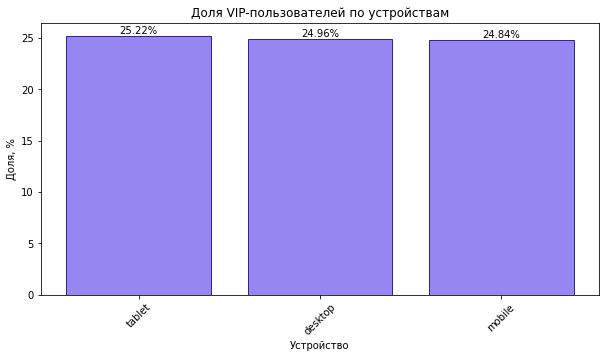

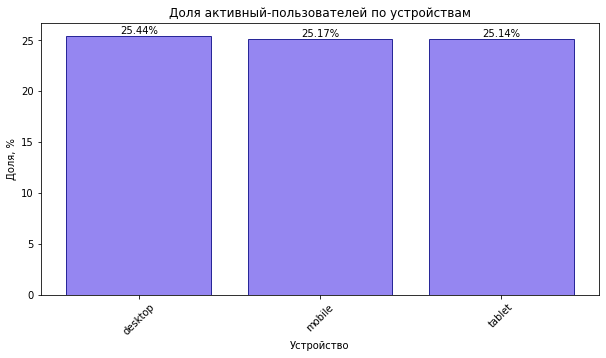

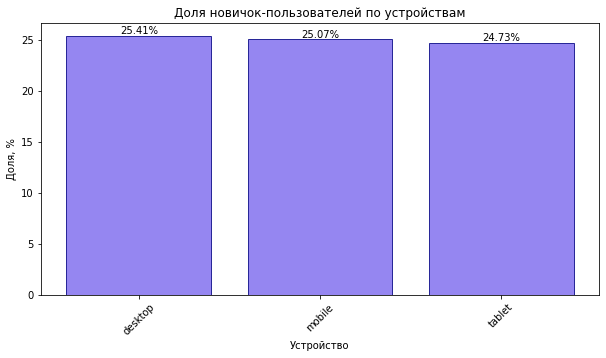

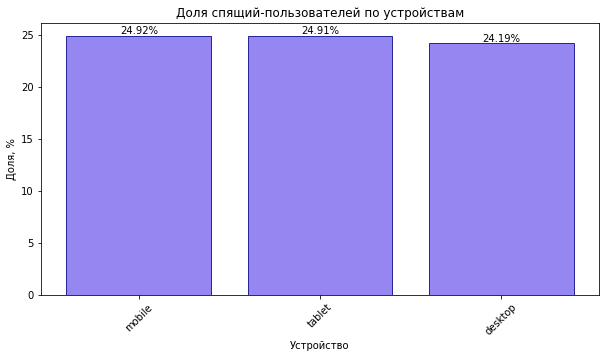

In [80]:
user_segments = users.groupby(['device', 'user_segment'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
user_segments = pd.merge(users_devices, user_segments, on = 'device', how = 'left')
user_segments['part'] = user_segments['users'] / user_segments['user_id'] * 100
for segment in user_segments['user_segment'].unique():
    df_plot = user_segments[user_segments['user_segment'] == segment].sort_values(by = 'part', ascending = False)
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['device'], df_plot['part'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Доля {segment}-пользователей по устройствам')
    plt.xlabel('Устройство')
    plt.ylabel('Доля, %')
    plt.xticks(rotation = 45)
    plt.show()

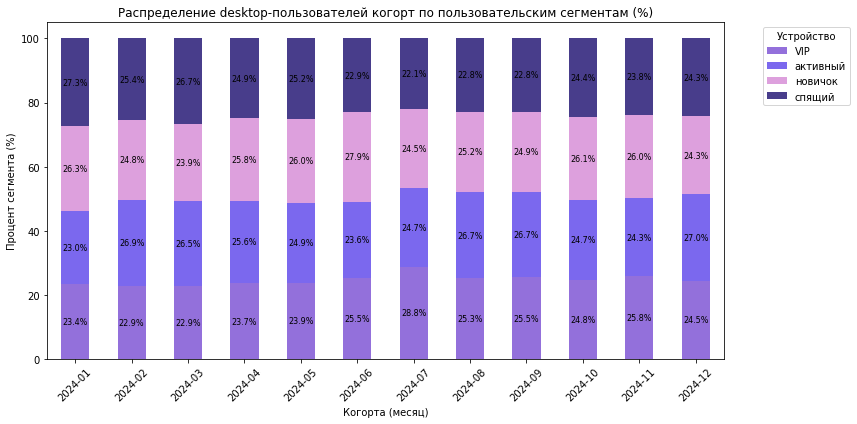

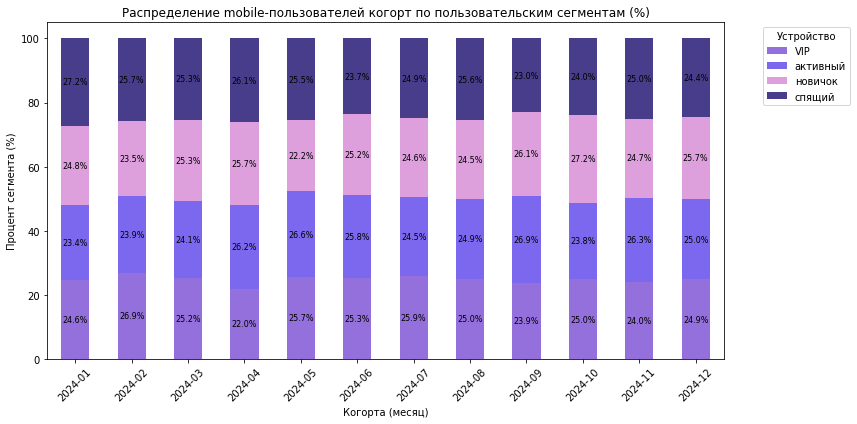

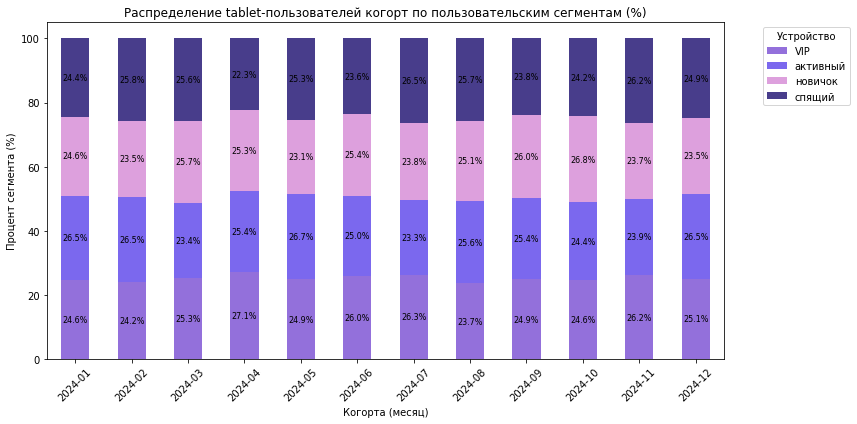

In [81]:
user_segments = users.groupby(['device', 'user_segment', 'cohort_month'])['user_id'].nunique().reset_index().rename(columns = {'user_id': 'users'})
user_segments = pd.merge(users_device_cohorts, user_segments, on = ['device', 'cohort_month'], how = 'left')
user_segments['part'] = user_segments['users'] / user_segments['cohort_users'] * 100
for device in user_segments['device'].unique():
    df_plot = user_segments[user_segments['device'] == device]
    pivot_df = df_plot.pivot(index='cohort_month', columns='user_segment', values='part').fillna(0)
    pivot_df.index = pivot_df.index.strftime('%Y-%m')
    # Строим гистограмму с накоплением
    ax = pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6), color = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение {device}-пользователей когорт по пользовательским сегментам (%)')
    plt.xlabel('Когорта (месяц)')
    plt.ylabel('Процент сегмента (%)')
    plt.legend(title='Устройство', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    for bars in ax.containers:
        heights = [bar.get_height() for bar in bars]
        y_positions = [bar.get_y() + bar.get_height()/2 for bar in bars]
        for bar, height, y_pos in zip(bars, heights, y_positions):
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2, 
                    y_pos, 
                    f'{height:.1f}%', 
                    ha='center', 
                    va='center',
                    fontsize=8,
                    color='black')

Распределение пользователей по пользовательской активности демонстрирует стабильную картину на всех типах устройств - десктопах, мобильных устройствах и планшетах. Независимо от платформы, все четыре сегмента (VIP, активные, новички и спящие) занимают примерно по 25% пользовательской базы на протяжении исследуемого периода с минимальными отклонениями в пределах 1 процентного пункта. 



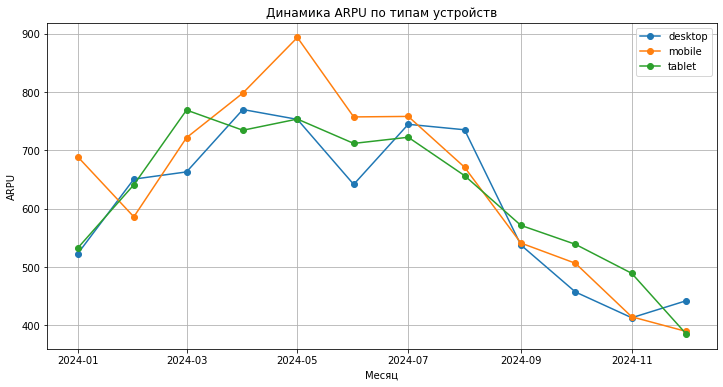

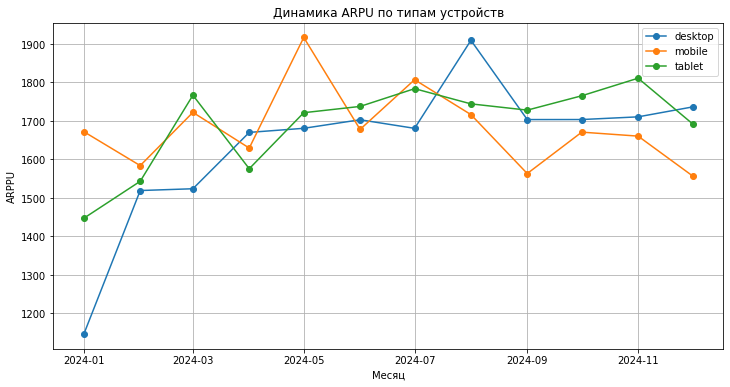

In [82]:
#Посмотрим на динамику ARPU и ARPPU помесячно
orders_d = pd.merge(orders, users[['user_id', 'device']], on = 'user_id', how = 'left') 
revenue_per_month = orders_d.groupby(['order_month', 'device'], as_index = False)['revenue'].sum().rename(columns = {'order_month':'month'})
#так как считаем ARPU, учитываем даже не платящих пользователей по датафрейму sessions
all_users = sessions.groupby(['session_month', 'device'], as_index = False)['user_id'].nunique().rename(columns = {'session_month':'month',
                                                                                            'user_id':'all_users'})
paying_users = orders_d.groupby(['order_month', 'device'], as_index = False)['user_id'].nunique().rename(columns = {'order_month':'month',
                                                                                                     'user_id':'paying_users'})
#объединяем данные
merged = pd.merge(revenue_per_month, all_users, how = 'left', on = ['month', 'device'])
merged = pd.merge(merged, paying_users, how = 'left', on = ['month', 'device'])
merged['arpu'] = merged['revenue'] / merged['all_users']
merged['arppu'] = merged['revenue'] / merged['paying_users']

#Построим график динамики ARPU
plt.figure(figsize = (12,6))
for device in merged['device'].unique():
    df_plot = merged[merged['device'] == device]
    plt.plot(df_plot['month'], df_plot['arpu'], label = f'{device}', marker = 'o')
plt.title('Динамика ARPU по типам устройств')
plt.xlabel('Месяц')
plt.ylabel('ARPU')
plt.grid()
plt.legend()
plt.show()

#Построим график динамики ARPPU
plt.figure(figsize = (12,6))
for device in merged['device'].unique():
    df_plot = merged[merged['device'] == device]
    plt.plot(df_plot['month'], df_plot['arppu'], label = f'{device}', marker = 'o')
plt.title('Динамика ARPU по типам устройств')
plt.xlabel('Месяц')
plt.ylabel('ARPPU')
plt.grid()
plt.legend()
plt.show()

Динамика ARPU и ARPPU на всех устройствах пользователей имеет схожий график, что не позволяет выделить какой-либо особенности. 
__________
**Промежуточный вывод по сегментации по устройствам**

Анализ данных показывает удивительную стабильность пользовательского поведения на маркетплейсе независимо от типа устройства. Пользователи равномерно распределены между десктопами (37,2% medium), мобильными устройствами (37,18%) и планшетами (37,21%), с аналогичной структурой по сегментам активности (VIP, активные, новички и спящие - по ~25% на каждом устройстве). Хотя мобильная версия показывает чуть более высокую конверсию в заказ (19,98% против 19,71% у десктопов и 19,12% у планшетов), эти различия статистически незначимы. Ключевая проблема проявляется в постепенном снижении конверсии и удержания пользователей на всех платформах, начиная с мая, при этом особенно заметно падение Retention Rate к третьему месяцу использования (60-80% потерь среди активных пользователей). Такая универсальность проблемных показателей по всем устройствам и сегментам указывает на системные недостатки маркетплейса, требующие комплексных улучшений в пользовательском опыте и механизмах вовлечения и привлечения аудитории. 

_________

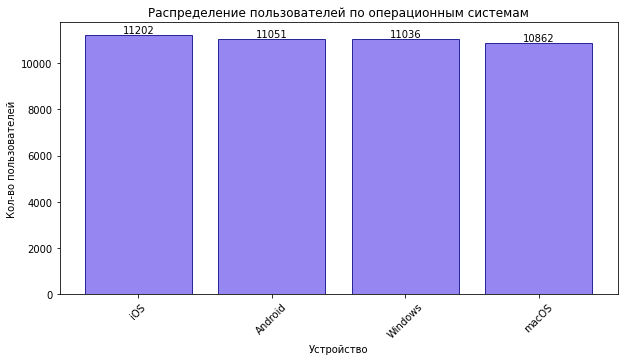

In [83]:
#Смотрим на распределение пользователей по типу устройств
users_os = users.groupby('os')['user_id'].nunique().reset_index().sort_values(by = 'user_id', ascending = False)

plt.figure(figsize = (10,5))
bars = plt.bar(users_os['os'], users_os['user_id'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.0f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Распределение пользователей по операционным системам')
plt.xlabel('Устройство')
plt.ylabel('Кол-во пользователей')
plt.grid(False)
plt.xticks(rotation = 45)
plt.show()

Анализ распределения пользователей по операционным системам показывает сбалансированное присутствие основных платформ: iOS (11,202 пользователя), Android (11,051), Windows (11,036) и macOS (10,862). Практически равное количество пользователей на каждой из платформ свидетельствует о широкой кросс-платформенной доступности сервиса и отсутствии явного доминирования какой-либо одной ОС. Такая равномерность распределения указывает на необходимость одинаково качественной оптимизации пользовательского опыта для всех платформ, так как каждая из них представляет значительную долю аудитории.

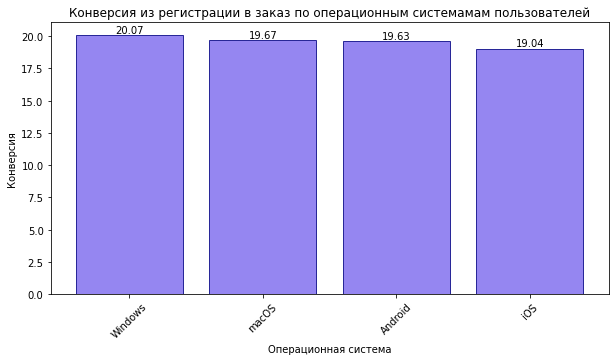

In [84]:
#Посмотрим конверсию из регистрации в заказ по устройствам
orders_os = pd.merge(orders, users[['user_id', 'os', 'cohort_month']], how = 'left', on = 'user_id')
orders_os_grouped = orders_os.groupby('os')['user_id'].nunique().reset_index().rename(columns = {'user_id':'buyers'})
orders_os_grouped = pd.merge(orders_os_grouped, users_os, how = 'right', on = 'os')
orders_os_grouped['cr_to_order'] = orders_os_grouped['buyers'] / orders_os_grouped['user_id'] * 100
orders_os_grouped = orders_os_grouped.sort_values(by = ['cr_to_order'], ascending = False)

plt.figure(figsize = (10,5))
bars = plt.bar(orders_os_grouped['os'], orders_os_grouped['cr_to_order'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Конверсия из регистрации в заказ по операционным системамам пользователей')
plt.xlabel('Операционная система')
plt.ylabel('Конверсия')
plt.grid(False)
plt.xticks(rotation = 45)
plt.show()

Анализ конверсии в покупку по операционным системам показывает, что Windows демонстрирует наилучший результат (20.07%), незначительно опережая macOS (19.67%) и Android (19.63%), в то время как iOS имеет несколько более низкий показатель (19.04%), что может указывать на необходимость оптимизации пользовательского опыта для данной платформы, при этом различия между системами не являются критичными.

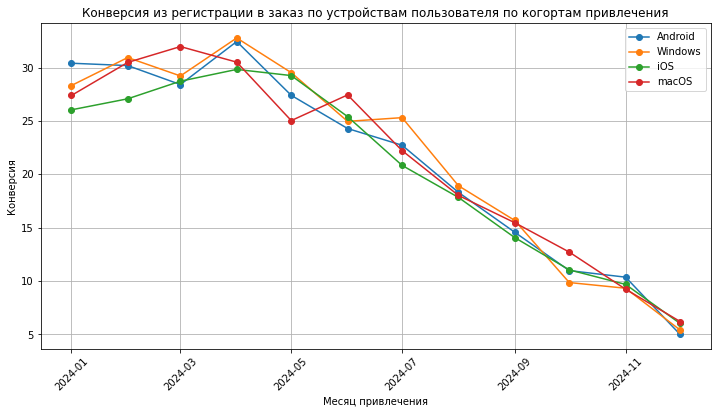

In [85]:
orders_os_grouped = orders_os.groupby(['cohort_month', 'os'])['user_id'].nunique().reset_index().rename(
    columns = {'user_id':'buyers'})
users_os_cohorts = users.groupby(['cohort_month', 'os'])['user_id'].nunique().reset_index()
orders_os_grouped = pd.merge(orders_os_grouped, users_os_cohorts, how = 'right', on = ['cohort_month', 'os'])
orders_os_grouped['cr_to_order'] = orders_os_grouped['buyers'] / orders_os_grouped['user_id'] * 100

plt.figure(figsize = (12,6))
for os in orders_os_grouped['os'].unique():
    df_plot = orders_os_grouped[orders_os_grouped['os'] == os]
    plt.plot(df_plot['cohort_month'], df_plot['cr_to_order'], label = f'{os}', marker = 'o')
plt.title('Конверсия из регистрации в заказ по устройствам пользователя по когортам привлечения')
plt.xlabel('Месяц привлечения')
plt.ylabel('Конверсия')
plt.xticks(rotation = 45)
plt.grid()
plt.legend()
plt.show()

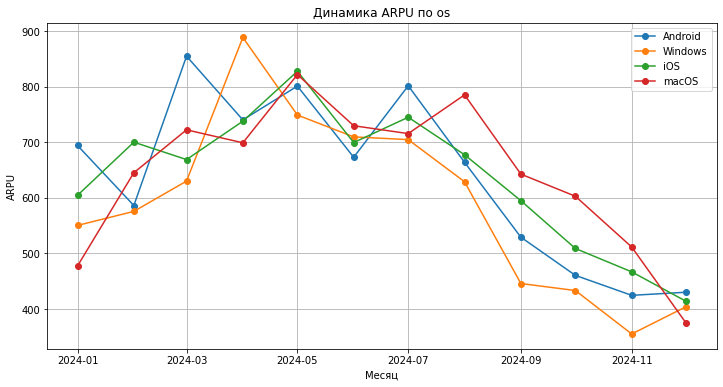

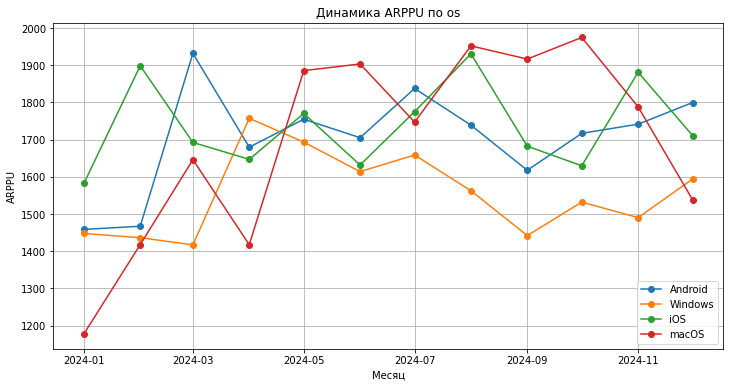

In [86]:
#Посмотрим на динамику ARPU и ARPPU помесячно
orders_o = pd.merge(orders, users[['user_id', 'os']], on = 'user_id', how = 'left') 
revenue_per_month = orders_o.groupby(['order_month', 'os'], as_index = False)['revenue'].sum().rename(columns = {'order_month':'month'})
#так как считаем ARPU, учитываем даже не платящих пользователей по датафрейму sessions
all_users = sessions.groupby(['session_month', 'os'], as_index = False)['user_id'].nunique().rename(columns = {'session_month':'month',
                                                                                            'user_id':'all_users'})
paying_users = orders_o.groupby(['order_month', 'os'], as_index = False)['user_id'].nunique().rename(columns = {'order_month':'month',
                                                                                                     'user_id':'paying_users'})
#объединяем данные
merged = pd.merge(revenue_per_month, all_users, how = 'left', on = ['month', 'os'])
merged = pd.merge(merged, paying_users, how = 'left', on = ['month', 'os'])
merged['arpu'] = merged['revenue'] / merged['all_users']
merged['arppu'] = merged['revenue'] / merged['paying_users']

#Построим график динамики ARPU
plt.figure(figsize = (12,6))
for os in merged['os'].unique():
    df_plot = merged[merged['os'] == os]
    plt.plot(df_plot['month'], df_plot['arpu'], label = f'{os}', marker = 'o')
plt.title('Динамика ARPU по os')
plt.xlabel('Месяц')
plt.ylabel('ARPU')
plt.grid()
plt.legend()
plt.show()

#Построим график динамики ARPPU
plt.figure(figsize = (12,6))
for os in merged['os'].unique():
    df_plot = merged[merged['os'] == os]
    plt.plot(df_plot['month'], df_plot['arppu'], label = f'{os}', marker = 'o')
plt.title('Динамика ARPPU по os')
plt.xlabel('Месяц')
plt.ylabel('ARPPU')
plt.grid()
plt.legend()
plt.show()

После июля 2024 года все платформы демонстрируют единообразное падение ARPU, что указывает на системный, а не локальный характер проблемы - как выяснили проблема в качестве трафика. 

Анализ данных показывает, что Windows системно отстает по ключевым метрикам монетизации. При сравнении ARPPU за весь период видно, что пользователи Windows приносят меньше дохода на платящего пользователя во второй половине года, чем другие системы. 

MacOS показывает рекордные значения ARPPU в отдельные месяцы, но ее показатели сильно колеблются, а в декабре она неожиданно опускается на последнее место. Это скорее говорит о нестабильности, чем о гарантированно высоком чеке. 
______________
**Промежуточный вывод по сегментации по операционным системам**

Несмотря на равномерное распределение пользователей по платформам (iOS, Android, Windows, macOS), анализ ключевых метрик выявляет парадокс: Windows лидирует по конверсии в покупку (20.07%), но системно отстает по доходу на платящего пользователя (ARPPU), что указывает на проблему с размером среднего чека у этой аудитории. При этом macOS демонстрирует высокую, но нестабильную монетизацию с резкими колебаниями ARPPU, а iOS, имея наибольшее количество пользователей, показывает самую низкую конверсию (19.04%), что сигнализирует о нереализованном потенциале этой платформы. Единое падение ARPU после июля 2024 года на всех платформах подтверждает системную проблему с качеством трафика, требующую комплексного пересмотра стратегии привлечения и удержания пользователей, при этом каждая платформа нуждается в индивидуальной оптимизации - от повышения конверсии iOS до увеличения среднего чека Windows и стабилизации монетизации macOS.

________________________
Посмотрим на воронку пользовательского пути. 

In [87]:
# Определим порядок событий для воронки
funnel_steps = [
    'page_view',          # Шаг 1: Просмотр страницы
    'product_view',       # Шаг 2: Просмотр товара
    'add_to_cart',        # Шаг 3: Добавление в корзину
    'checkout_start',     # Шаг 4: Начало оформления
    'checkout_complete'   # Шаг 5: Завершение оформления
]

# Подсчет уникальных пользователей на каждом шаге
funnel_data = []
funnel_data.append({'step':'registration', 'users': users['user_id'].nunique()})
for step in funnel_steps:
    unique_users = events[events['event_type'] == step]['user_id'].nunique()
    funnel_data.append({'step': step, 'users': unique_users})
funnel_data.append({'step':'order_completed', 'users': orders['user_id'].nunique()})
# Создаем DataFrame с данными воронки
funnel_df = pd.DataFrame(funnel_data)

# Добавляем расчет конверсии
funnel_df['conversion_rate'] = round((funnel_df['users'] / funnel_df['users'].iloc[0]) * 100, 1)
funnel_df['conversion_from_previous'] = round((funnel_df['users'] / funnel_df['users'].shift(1)) * 100, 1)
funnel_df.loc[0, 'conversion_from_previous'] = 100

# Выводим таблицу с данными
display('Данные воронки конверсии:')
display(funnel_df)

'Данные воронки конверсии:'

,step,users,conversion_rate,conversion_from_previous
0,registration,44151,100.00,100.00
1,page_view,21562,48.80,48.80
2,product_view,21533,48.80,99.90
3,add_to_cart,19887,45.00,92.40
4,checkout_start,16293,36.90,81.90
5,checkout_complete,13486,30.50,82.80
6,order_completed,8654,19.60,64.20


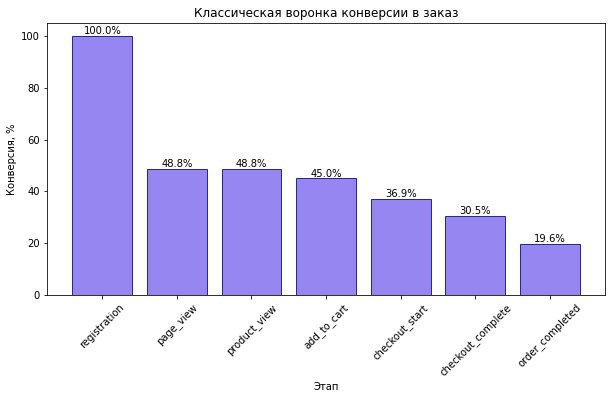

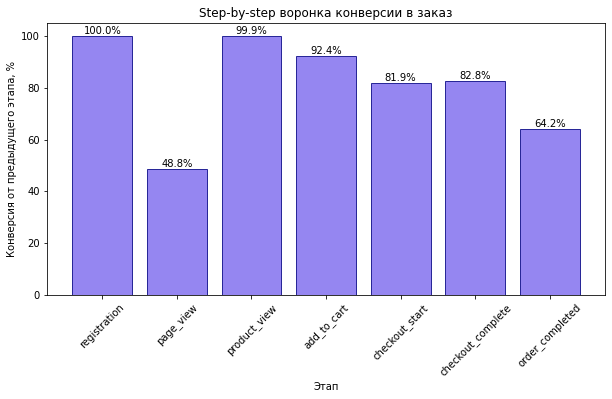

In [88]:
#Строим классическую воронку
plt.figure(figsize = (10,5))
bars = plt.bar(funnel_df['step'], funnel_df['conversion_rate'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Классическая воронка конверсии в заказ')
plt.xlabel('Этап')
plt.ylabel('Конверсия, %')
plt.grid(False)
plt.xticks(rotation = 45)
plt.show()

#Строим step-by-step воронку
plt.figure(figsize = (10,5))
bars = plt.bar(funnel_df['step'], funnel_df['conversion_from_previous'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Step-by-step воронка конверсии в заказ')
plt.xlabel('Этап')
plt.ylabel('Конверсия от предыдущего этапа, %')
plt.grid(False)
plt.xticks(rotation = 45)
plt.show()

Анализ воронки конверсии показывает эффективную работу платформы на этапах от просмотра товара до оформления заказа (конверсия между шагами стабильно выше 80%), но выявляет два критических узких места: катастрофическую потерю 50% пользователей на первом шаге (только половина зарегистрированных переходит к просмотру страниц) и значительное падение конверсии на финальном этапе (лишь 62% завершенных заказов от всех оформлений). Общая конверсия в покупку составляет 19.6% от регистраций. Все это указывает на необходимость срочной оптимизации онбординга (улучшение первых впечатлений пользователей и вовлечение их в продукт) и процесса оплаты (упрощение финальных шагов), тогда как средние этапы воронки (добавление в корзину, оформление) работают относительно стабильно с конверсией 82-93% между шагами.

In [89]:
events_channel =  pd.merge(events, users[['user_id', 'acq_channel']], how = 'left', on = 'user_id')
# Определим порядок событий для воронки
funnel_steps = [
    'page_view',          # Шаг 1: Просмотр страницы
    'product_view',       # Шаг 2: Просмотр товара
    'add_to_cart',        # Шаг 3: Добавление в корзину
    'checkout_start',     # Шаг 4: Начало оформления
    'checkout_complete'   # Шаг 5: Завершение оформления
]

# Подсчет уникальных пользователей на каждом шаге
funnel_df = []
for channel in events_channel['acq_channel'].unique():
    funnel_data = []
    df_events = events_channel[events_channel['acq_channel'] == channel]
    df_orders = orders_channel[orders_channel['acq_channel'] == channel]
    df_users = users[users['acq_channel'] == channel]
    funnel_data.append({'channel':channel, 'step':'registration', 'users': df_users['user_id'].nunique()})
    for step in funnel_steps:
        unique_users = df_events[df_events['event_type'] == step]['user_id'].nunique()
        funnel_data.append({'channel':channel,'step': step, 'users': unique_users})
    funnel_data.append({'channel':channel, 'step':'order_completed', 'users': df_orders['user_id'].nunique()})
    # Создаем DataFrame с данными воронки
    funnel = pd.DataFrame(funnel_data)
    # Добавляем расчет конверсии
    funnel['conversion_rate'] = round((funnel['users'] / funnel['users'].iloc[0]) * 100, 1)
    funnel['conversion_from_previous'] = round((funnel['users'] / funnel['users'].shift(1)) * 100, 1)
    funnel.loc[0, 'conversion_from_previous'] = 100
    funnel_df.append(funnel)
    
funnel_df = pd.concat(funnel_df)

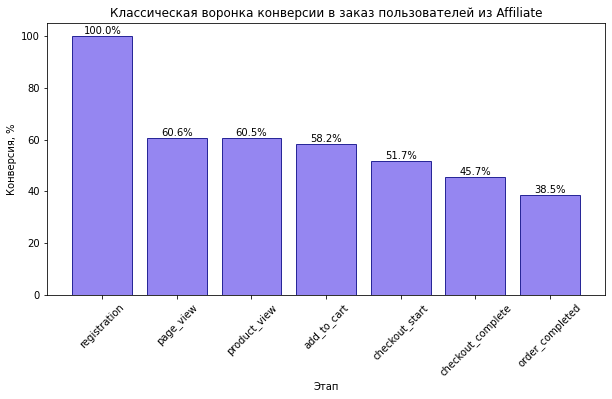

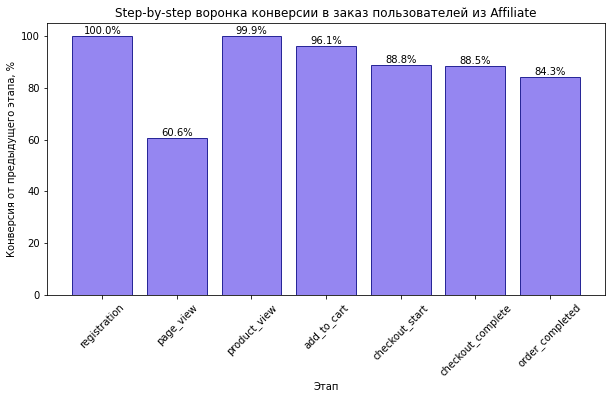

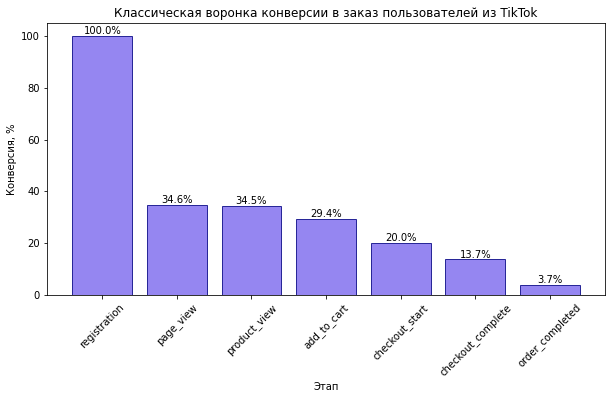

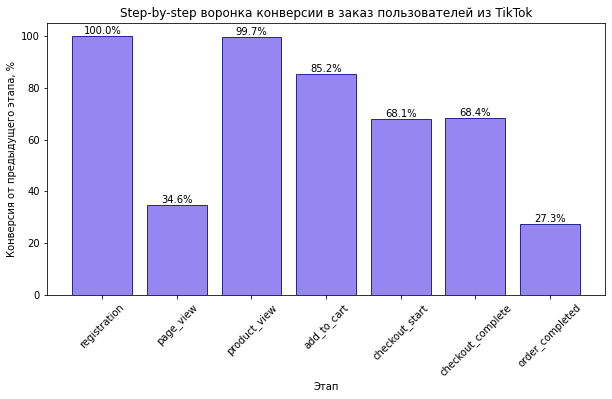

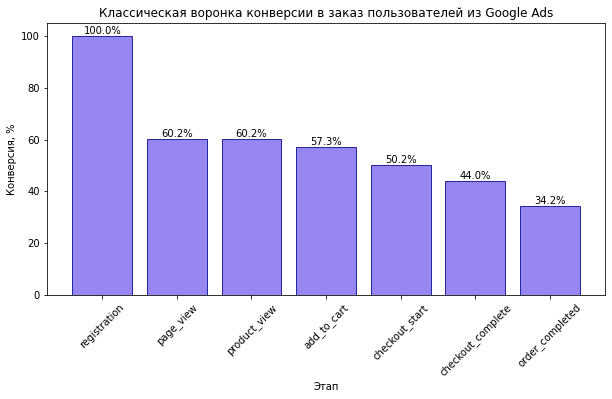

...

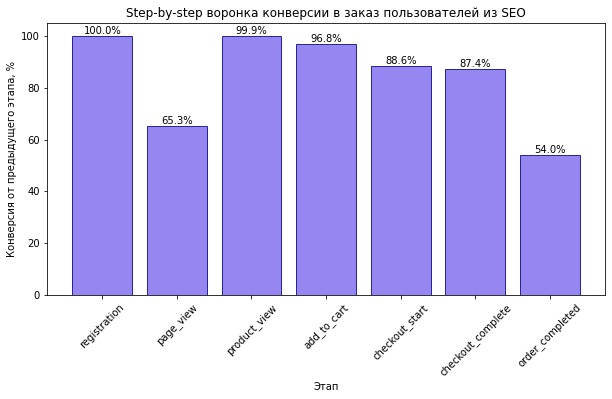

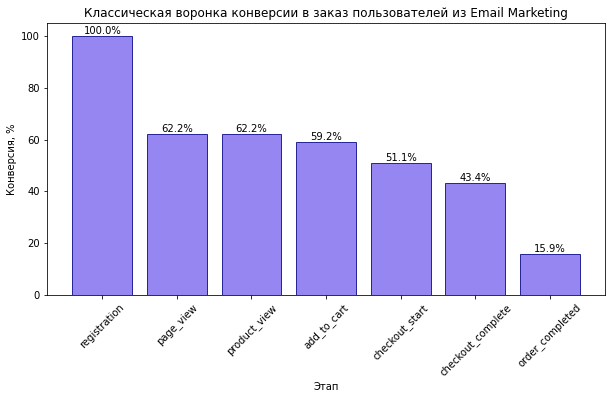

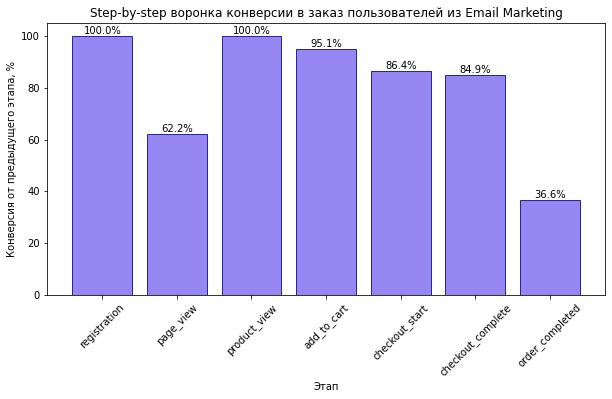

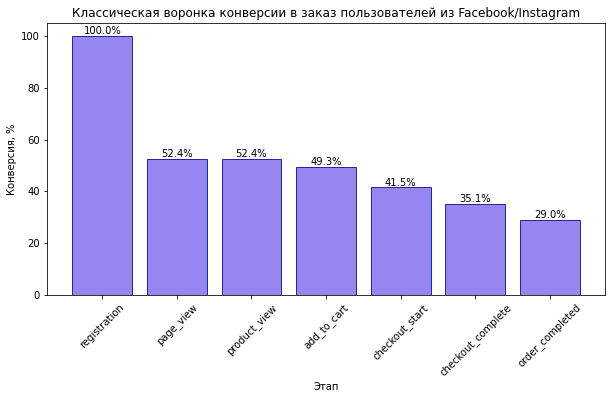

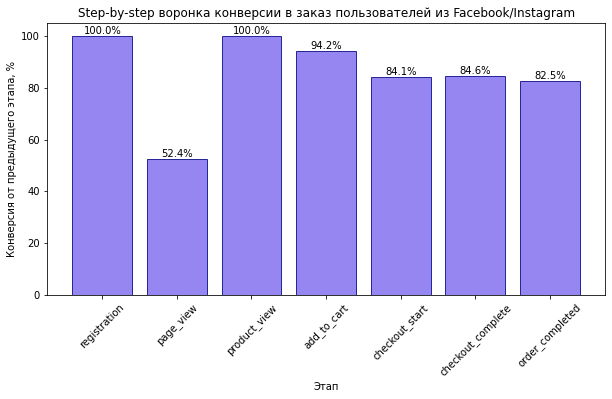

In [90]:
for channel in funnel_df['channel'].unique():
    df_plot = funnel_df[funnel_df['channel'] == channel]
    #Строим классическую воронку
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['step'], df_plot['conversion_rate'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Классическая воронка конверсии в заказ пользователей из {channel}')
    plt.xlabel('Этап')
    plt.ylabel('Конверсия, %')
    plt.grid(False)
    plt.xticks(rotation = 45)
    plt.show()

    #Строим step-by-step воронку
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['step'], df_plot['conversion_from_previous'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Step-by-step воронка конверсии в заказ пользователей из {channel}')
    plt.xlabel('Этап')
    plt.ylabel('Конверсия от предыдущего этапа, %')
    plt.grid(False)
    plt.xticks(rotation = 45)
    plt.show()

Анализ воронки конверсии выявил резкий контраст между каналами привлечения: в то время как Affiliate, Google Ads и SEO демонстрируют стабильно высокие показатели на всех этапах (конверсия от регистрации до заказа 34-38%, 34% и 26% соответственно), TikTok-аудитория показывает катастрофически низкую эффективность — лишь 3.7% пользователей доходят до покупки, причем основные потери происходят на первых этапах (падение до 34.6% на переходе к просмотру страниц) и особенно на финальном шаге (только 27.3% оформленных заказов завершаются покупкой против 77-88% у других каналов). При этом Email Marketing и Facebook/Instagram занимают промежуточное положение, но их финальная конверсия (15.9% и 29%) все равно в 4-8 раз превышает показатели TikTok, что указывает на фундаментальную проблему либо с качеством трафика из TikTok (нерелевантная аудитория), либо с неадаптированностью воронки под мобильных пользователей (характерных для этой платформы). Проверим адаптированность маркетплейса для мобильных пользователей, чтобы исключить или подтвердить влияние типа устройства на конверсию.

In [91]:
# Определим порядок событий для воронки
funnel_steps = [
    'page_view',          # Шаг 1: Просмотр страницы
    'product_view',       # Шаг 2: Просмотр товара
    'add_to_cart',        # Шаг 3: Добавление в корзину
    'checkout_start',     # Шаг 4: Начало оформления
    'checkout_complete'   # Шаг 5: Завершение оформления
]

# Подсчет уникальных пользователей на каждом шаге
funnel_df = []
for device in events['device'].unique():
    funnel_data = []
    df_events = events[events['device'] == device]
    df_orders = orders_devices[orders_devices['device'] == device]
    df_users = users[users['device'] == device]
    funnel_data.append({'device':device, 'step':'registration', 'users': df_users['user_id'].nunique()})
    for step in funnel_steps:
        unique_users = df_events[df_events['event_type'] == step]['user_id'].nunique()
        funnel_data.append({'device':device, 'step': step, 'users': unique_users})
    funnel_data.append({'device':device, 'step':'order_completed', 'users': df_orders['user_id'].nunique()})
    # Создаем DataFrame с данными воронки
    funnel = pd.DataFrame(funnel_data)
    # Добавляем расчет конверсии
    funnel['conversion_rate'] = round((funnel['users'] / funnel['users'].iloc[0]) * 100, 1)
    funnel['conversion_from_previous'] = round((funnel['users'] / funnel['users'].shift(1)) * 100, 1)
    funnel.loc[0, 'conversion_from_previous'] = 100
    funnel_df.append(funnel)
    
funnel_df = pd.concat(funnel_df)

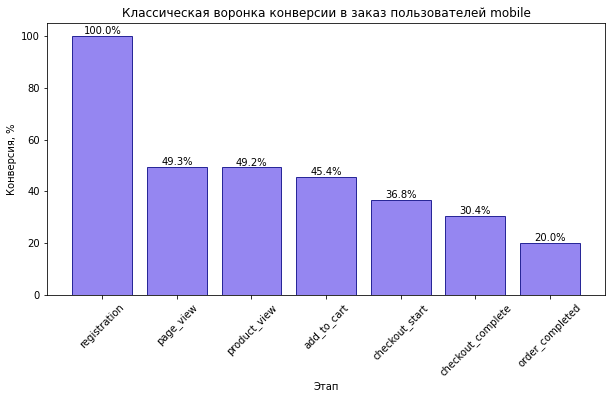

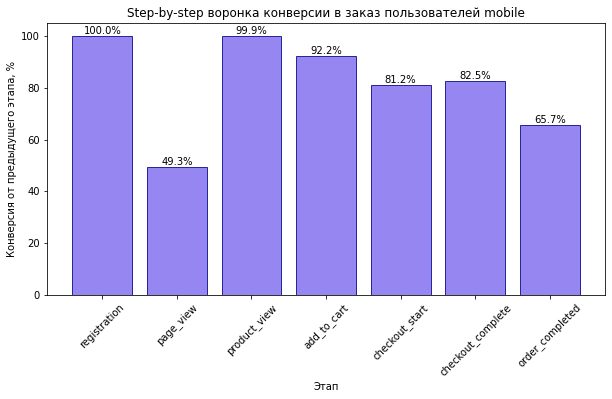

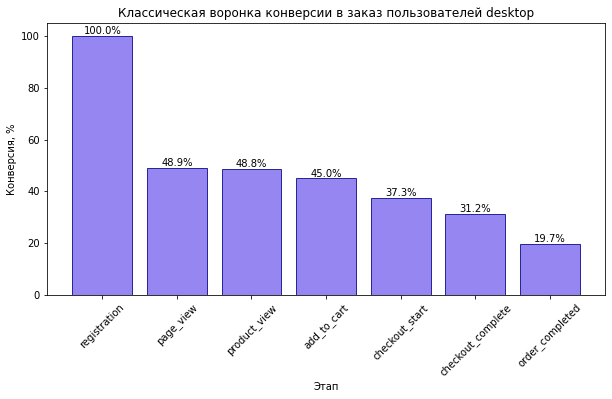

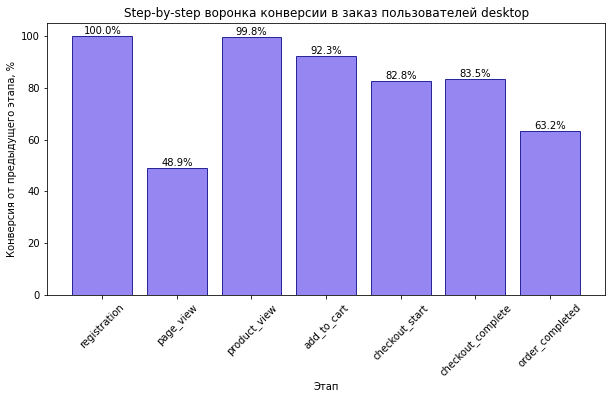

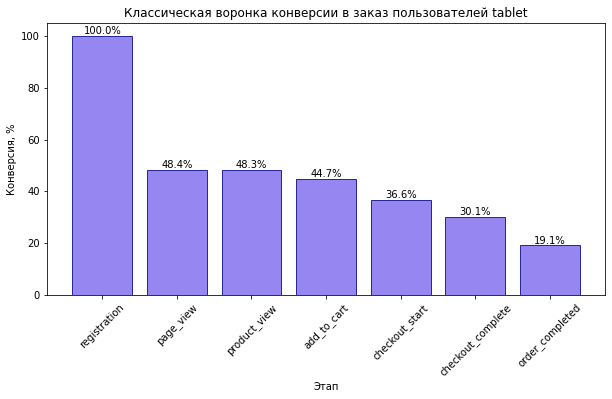

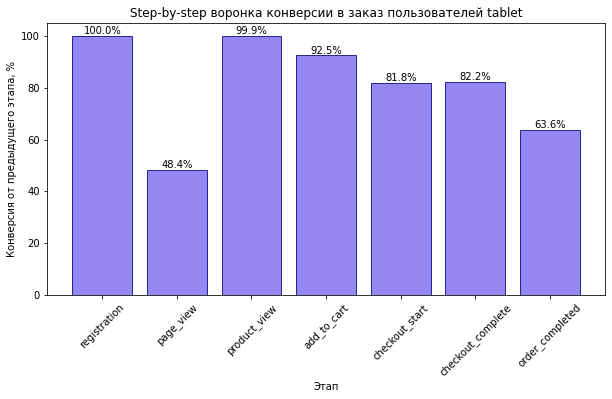

In [92]:
for device in funnel_df['device'].unique():
    df_plot = funnel_df[funnel_df['device'] == device]
    #Строим классическую воронку
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['step'], df_plot['conversion_rate'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Классическая воронка конверсии в заказ пользователей {device}')
    plt.xlabel('Этап')
    plt.ylabel('Конверсия, %')
    plt.grid(False)
    plt.xticks(rotation = 45)
    plt.show()

    #Строим step-by-step воронку
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['step'], df_plot['conversion_from_previous'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%',
             ha='center', va='bottom',
             fontsize=10)
    plt.title(f'Step-by-step воронка конверсии в заказ пользователей {device}')
    plt.xlabel('Этап')
    plt.ylabel('Конверсия от предыдущего этапа, %')
    plt.grid(False)
    plt.xticks(rotation = 45)
    plt.show()

Анализ воронки по типам устройств показывает стабильную картину: все платформы (мобильные, десктопы, планшеты) демонстрируют почти идентичные показатели конверсии на каждом этапе, с отклонениями не более 1-2 процентных пунктов. Ключевые узкие места универсальны для всех устройств: катастрофическая потеря 50% пользователей на первом шаге (только половина зарегистрированных переходит к просмотру страниц) и значительное падение на финальном этапе (63-66% конверсии от оформления к покупке). Общая конверсия в заказ составляет 19-20% от регистраций независимо от устройства, что указывает на то, что тип устройства не влияет на конверсию в заказ, а значит проблема конверсии пользователей TikTok именно в некачественном трафике. 

## Выводы по этапу 4

Одновременное падение конверсии и Retention Rate во всех регионах и на всех устройствах с июля 2024 года указывает на проблему не с платформой, а с источниками привлечения, где нужна жёсткая оптимизация и отсев нецелевых пользователей.

- TikTok привлекает массовый, но низкоконверсионный трафик - несмотря на рост аудитории в 9 раз, конверсия в покупки остаётся ниже 10%, что делает этот канал убыточным по сравнению с Google Ads и Affiliate-партнёрками, где LTV в 5-10 раз выше при аналогичных затратах на привлечение.

**Рекомендация:** Сократить бюджет на TikTok, перераспределить на Google Ads/Affiliate.
____________

- Системный кризис удержания пользователей - Retention Rate падает до 50% уже в первый месяц, а к третьему месяцу платформа теряет 60-80% даже активных пользователей.

**Гипотеза роста:**  Внедрение push-уведомлений и персонализированных предложений повысит Retention.
____________________

- Пользователи Windows - слабое звено в монетизации - стабильно низкий ARPPU по сравнению с другими ОС требует внедрения новой ценовой стратегии. 

**Гипотеза роста:** внедрение новой ценовой стратегии под Windows увеличит ARPPU.
_____________________
- Главные точки роста в воронке конверсии - потеря 18% пользователей при переходе от корзины к оформлению заказа (конверсия 82.2%) и ещё 17% на этапе завершения покупки указывают на необходимость упрощения процесса оплаты и добавления стимулов (например, скидки за быстрый заказ или бесплатная доставка).

**Рекомендация:** Упростить процесс оформления, добавить триггеры (например, скидку за быстрый заказ).
_____________________________

- Персонализация предложений по регионам может повысить конверсию - текущий однородный ассортимент не учитывает региональные предпочтения, в то время как данные показывают различия в топовых категориях (например, Новосибирск стабильно показывает +28% VIP-пользователей). Внедрение геозависимых товарных рекомендаций и локальных акций способно увеличить средний чек и лояльность.

- **Гипотеза роста:** Если внедрить алгоритм автоматической подборки товаров на основе региональных продаж и предпочтений, конверсия в покупку вырастет на 15-20%, особенно в регионах с низким Retention.

**Рекомендация:**

  - Выделить топ-3 категорий для каждого региона и усилить их продвижение

  - Добавить раздел "Популярное в вашем городе" на главной странице

  - Тестировать локальные промо-акции (например, "Товары недели для Москвы/Новосибирска")

  - Внедрить A/B-тестирование геозависимых баннеров и рекомендательных блоков

Это дополнит текущие системные улучшения и повысит релевантность предложений для пользователей из разных локаций.

## Подготовка эксперимента и подведение его результатов - Часть 3


# Новые вводные (после этапа 4)

Команда продукта рассмотрела твои гипотезы и на основании этого решила влиять на конверсию при помощи финансовых стимуляций. Так как ситуация со снижением выручки срочная и безотлагательная, пока ты продолжал изучать данные, они подключили другого аналитика для подготовки дизайн документа, но само проведение эксперимента на тебе. При формировании выводов допиши рекомендации по итогам теста и, если необходимо, опиши проблемы, присутствующие в эксперименте.

## Новые данные:

```python
pa_diploma_events_AB = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_events_AB.csv')
pa_diploma_orders_AB = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_orders_AB.csv')
pa_diploma_sessions_AB = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_sessions_AB.csv')
pa_diploma_users_AB = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_users_AB.csv')
```

## Результаты сплита лежат в таблице:

```python
pa_diploma_AB_split_users = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_AB_split_users.csv')
```

* user_id – id клиента
* group – группа, в которую попал клиент

# Дизайн эксперимента:

Бонус на первую покупку для пользователей TikTok

## 1. Контекст и цель эксперимента

- **Бизнес-контекст:** Команда продукта запускает эксперимент, направленный на повышение конверсии среди пользователей, привлечённых через канал TikTok. Для стимулирования первой покупки пользователям будет предоставлен бонус на первую покупку.  
- **Цель:** Проверить, влияет ли предоставление бонуса на первую покупку на конверсию и выручку среди пользователей TikTok.  
- **Гипотеза:** Предоставление бонуса на первую покупку новым пользователям, привлеченным через TikTok, приведет к увеличению конверсии в первую покупку

---

## 2. Формат эксперимента

- **Тип эксперимента:** Сплит-роллинг (rolling split)  
- **Канал:** Только пользователи, пришедшие с TikTok  
- **Группы:**  
  - **Контрольная (A):** пользователи TikTok без бонуса  
  - **Тестовая (B):** пользователи TikTok с бонусом на первую покупку  
- **Распределение:** Равномерное распределение новых пользователей TikTok между группами по дате регистрации  
- **Период проведения:** 3 недели (фиксировано)

---

## 3. Ключевые метрики

### Основная метрика

- **Конверсия в первую покупку** — доля пользователей, зарегистрировавшихся с TikTok и совершивших первую покупку  
  - *Цель:* увеличить конверсию с помощью бонуса  
  - *Критерий успеха:* статистически значимый рост конверсии в тестовой группе

### Вспомогательные метрики

- **ARPU** (средняя выручка на пользователя TikTok)  
- **ARPPU** (средняя выручка на покупателя TikTok)  
- **AOV** (средний чек TikTok)

### Барьерная метрика

- **Общая выручка от пользователей TikTok**

---

## 4. Размеры групп и запуск

- **Целевая аудитория:** только пользователи TikTok  
- **Размеры групп:** определяются по фактическому трафику TikTok за период эксперимента  
- **Комментарий:** запуск без предварительного расчёта мощности и MDE из-за срочности задачи


### Предобработка данных A/B-эксперимента

Перед тем, как приступать к анализу данных, необходимо ознакомиться с ними, проверить на ошибки и провести предобработку. 

In [93]:
#Загружаем данные
events_ab = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_events_AB.csv')
orders_ab = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_orders_AB.csv')
sessions_ab = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_sessions_AB.csv')
users_ab = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_users_AB.csv')
split_users_ab = pd.read_csv('https://code.s3.yandex.net/datasets/pa_diploma_AB_split_users.csv')

Начнем с предобработки датафрейма `split_users_ab`, содержащего информацию о сплите пользователей в эксперименте.

In [94]:
#Выведем общую информацию, используя функцию из первой части
common_info(split_users_ab)

'Первые 5 строк датафрейма split_users_ab'

,user_id,group
0,44965,control
1,44967,control
2,44968,control
3,44969,treatment
4,44970,control


'Информация о датафрейме split_users_ab'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2968 entries, 0 to 2967
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   user_id  2968 non-null   int64 
 1   group    2968 non-null   object
dtypes: int64(1), object(1)
memory usage: 46.5+ KB


None

'Процент пропущенных значений в столбцах датафрейма'

user_id   0.00
group     0.00
dtype: float64

Датафрейм `split_users_ab` содержит 2,968 записей о распределении пользователей по группам (A/B-тестирование или сегментация). Включает два столбца:

- `user_id` (уникальный идентификатор пользователя, целочисленный тип, без пропусков)

- `group` (название группы, строковый тип, без пропусков).

Пропуски отсутствуют, что делает датафрейм готовым к анализу групповых различий, но для оптимизации памяти понизим размерность первого столбца. 

In [95]:
#Оптимизируем память функцией из первой части
optimize_memory_usage(split_users_ab)
split_users_ab.info()

Размер использования памяти: до  0.05 Mb - после  0.03 Mb (24.9%)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2968 entries, 0 to 2967
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   user_id  2968 non-null   int32 
 1   group    2968 non-null   object
dtypes: int32(1), object(1)
memory usage: 34.9+ KB


In [96]:
#Проверим датафрейм на дубликаты функцией из первой части, сразу узнав, есть ли пользователи попавшие в обе группы
duplicates(split_users_ab, ['user_id'])

'В датафрейме split_users_ab найдено 0 явных дубликатов'

'В датафрейме split_users_ab найдено 0 неявных дубликатов'

In [97]:
#Количество участников эксперимента
split_users_ab['user_id'].nunique()

2968

In [98]:
#Посмотрим уникальные значения групп
split_users_ab['group'].unique()

array(['control', 'treatment'], dtype=object)

В датафрейме нет явных дубликатов и нет пользователей попавших в обе группы, это соблюдает условие независимости выборок. Всего в эксперименте приняли участие 2968 человек. 

В целом, датафрейм `users+split_ab` готов к последующей работе с ним. 

Посмотрим на датафрейм users_ab.

In [99]:
common_info(users_ab)

'Первые 5 строк датафрейма users_ab'

,user_id,registration_date,os,age,device,gender,region,browser,country,acq_channel,campaign_id,user_segment,buyer_segment,cohort_week,cohort_month
0,18,2024-01-01 05:26:00,Android,49,mobile,M,Екатеринбург,Edge,Россия,TikTok,10.00,спящий,one_time,2024-01-01,2024-01-01
1,22,2024-01-01 17:13:00,iOS,50,tablet,M,Санкт-Петербург,Chrome,Россия,TikTok,43.00,VIP,one_time,2024-01-01,2024-01-01
2,26,2024-01-01 21:15:00,iOS,60,desktop,F,Москва,Firefox,Россия,TikTok,27.00,активный,rare,2024-01-01,2024-01-01
3,33,2024-01-01 14:43:00,iOS,31,desktop,M,Екатеринбург,Firefox,Россия,TikTok,15.00,новичок,rare,2024-01-01,2024-01-01
4,39,2024-01-01 01:13:00,Android,44,tablet,M,Санкт-Петербург,Firefox,Россия,TikTok,15.00,спящий,rare,2024-01-01,2024-01-01


'Информация о датафрейме users_ab'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22196 entries, 0 to 22195
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   user_id            22196 non-null  int64  
 1   registration_date  22196 non-null  object 
 2   os                 22196 non-null  object 
 3   age                22196 non-null  int64  
 4   device             22196 non-null  object 
 5   gender             22196 non-null  object 
 6   region             22196 non-null  object 
 7   browser            22196 non-null  object 
 8   country            22196 non-null  object 
 9   acq_channel        22196 non-null  object 
 10  campaign_id        22196 non-null  float64
 11  user_segment       22196 non-null  object 
 12  buyer_segment      22196 non-null  object 
 13  cohort_week        22196 non-null  object 
 14  cohort_month       22196 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 2.5+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

user_id             0.00
registration_date   0.00
os                  0.00
age                 0.00
device              0.00
gender              0.00
region              0.00
browser             0.00
country             0.00
acq_channel         0.00
campaign_id         0.00
user_segment        0.00
buyer_segment       0.00
cohort_week         0.00
cohort_month        0.00
dtype: float64

Датафрейм `users_ab` содержит 22 196 строк и 15 столбцов с данными о пользователях:
- Идентификаторы и временные метки:
    - `user_id` (`int64`) — уникальный идентификатор пользователя
    - `registration_date` (`object`) — дата регистрации
    - `cohort_week` (`object`) — неделя когорты (для когортного анализа)
    - `cohort_month` (`object`) — месяц когорты

- Демографические данные
    - `age` (`int64`) — возраст пользователя
    - `gender` (`object`) — пол
    - `region` (`object`) — регион
    - `country` (`object`) — страна

- Технические параметры
    - `os` (`object`) — операционная система
    - `device` (`object`) — тип устройства
    - `browser` (`object`) — браузер

- Маркетинговые атрибуты
    - `acq_channel` (`object`) — канал привлечения
    - `campaign_id` (`float64`) — идентификатор рекламной кампании

- Сегментация пользователей
    - `user_segment` (`object`) — сегмент (новичок, активный, VIP и др.)
    - `buyer_segment` (`object`) — сегмент по покупательской активности

Данные не содержат пропусков. Даты (`registration_date`, `cohort_week`, `cohort_month`) хранятся как строки (`object`) — для временного анализа их стоит преобразовать в `datetime`. Также необходимо оптимизировать память. 

Заметим, что число пользователей в датафрейме больше, чем в датафрейме `split_users_ab`. Причина может крыться в дубликатах или в том, что в датафрейме хряняться не только участники A/B-эксперимента. 

In [100]:
#Оптимизируем память функцией из первой части
optimize_memory_usage(users_ab)
users_ab.info()

Размер использования памяти: до  2.54 Mb - после  2.22 Mb (12.5%)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22196 entries, 0 to 22195
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   user_id            22196 non-null  int32  
 1   registration_date  22196 non-null  object 
 2   os                 22196 non-null  object 
 3   age                22196 non-null  int8   
 4   device             22196 non-null  object 
 5   gender             22196 non-null  object 
 6   region             22196 non-null  object 
 7   browser            22196 non-null  object 
 8   country            22196 non-null  object 
 9   acq_channel        22196 non-null  object 
 10  campaign_id        22196 non-null  float32
 11  user_segment       22196 non-null  object 
 12  buyer_segment      22196 non-null  object 
 13  cohort_week        22196 non-null  object 
 14  cohort_month       22196 non-null  object 
dtypes: f

In [101]:
#Приведем столбцы с датами к нужному формату
for column in users_ab[['registration_date', 'cohort_week', 'cohort_month']]:
    users_ab[column] = pd.to_datetime(users_ab[column])

In [102]:
#Проверим датафрейм на явные и неявные дубликаты функцией из первой части
duplicates(users_ab, ['user_id', 'registration_date'])

'В датафрейме users_ab найдено 0 явных дубликатов'

'В датафрейме users_ab найдено 0 неявных дубликатов'

Дубликатов в датафрейме `users_ab` нет, поэтому причина большего числа пользователей в том, что в данные попали пользователи, не участвовашие в эусперименте. Отфильтруем датафрейм. 

In [103]:
#Фильтруем по идентификаторам пользователей из датафрейма split_users_ab
users_ab = users_ab[users_ab['user_id'].isin(split_users_ab['user_id'])]
#Смотрим число пользователей в отфильтрованном датафрейме
users_ab['user_id'].nunique()

2968

Теперь в датафрейме `users_ab` хранятся записи только участников эксперимента.

In [104]:
#Сразу добавим в датафрейм users_ab столбец с группой пользователя
users_ab = pd.merge(users_ab, split_users_ab, on = 'user_id', how = 'left')

In [105]:
#Проверим, все ли пользователи пришли через TikTok
users_ab.groupby('acq_channel')['user_id'].nunique()

acq_channel
TikTok    2968
Name: user_id, dtype: int64

Все пользователи пришли через TikTok, что является корректным. 

'Описание столбца age'

count   2968.00
mean      44.03
std       15.17
min       18.00
25%       31.00
50%       44.00
75%       58.00
max       70.00
Name: age, dtype: float64

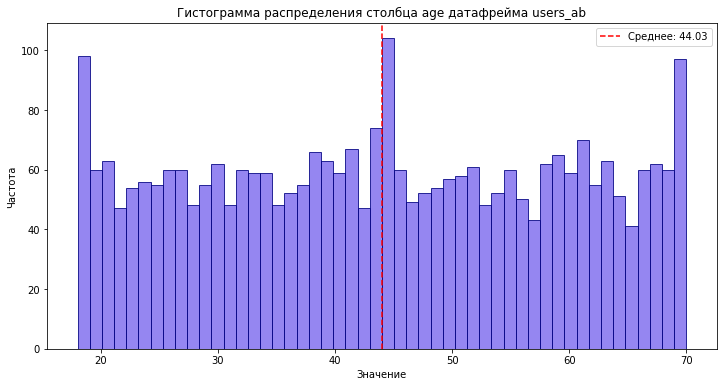

In [106]:
numeric_data(users_ab, ['age'])

Анализ возраста пользователей показывает нормальное распределение со средним значением 44 года и медианой также на уровне 44 лет, что указывает на сбалансированность выборки, где половина пользователей младше 44 лет, а половина - старше, при этом стандартное отклонение в 15 лет демонстрирует значительный разброс данных от минимального возраста в 18 лет до максимального в 70 лет, причем 25% самых молодых пользователей не превышают 31 года, а 25% самых старших - старше 58 лет.

Посмотрим на временной период регистрации пользователей. 

In [107]:
#Посмотрим на временной диапозон данных
first_date = users_ab['registration_date'].dt.date.min()
last_date = users_ab['registration_date'].dt.date.max()
difference = last_date - first_date
display(f'В датафрейме `users_ab` пользователи с регистрацией с {first_date} по {last_date}, то есть данные за {difference} дней')

'В датафрейме `users_ab` пользователи с регистрацией с 2025-01-01 по 2025-01-26, то есть данные за 25 days, 0:00:00 дней'

Указанная длительность эксперимента - 3 недели (21 день), однако по факту эксперимент длился 26 дней. 

При этом дата начала теста - 1 января 2025 года, что не совсем удачно, так как тест выпал на Новогодние праздники и поведение пользователей может значительно отличаться от обычного. У нас есть три варианта, как поступить:

1) анализировать данные за все 25 дней, однако это противоречит карте эксперимента и не обеспечит нам чистоту данных

2) анализировать данные с 1 января 2025 года по 21 января 2025 года, однако первая неделя эксперимента выпадает на новогодние праздники и поведение пользователей может сильно отличаться, исказив результаты эксперимента, и мы придем к неверным выводам

3) исключить из анализа данные за первые дни после Нового года (2025-01-01 - 2025-01-05), чтобы обеспечить условия максимально близкие к обыденным. Это позволит нам сохранить заявленную длительность эксперимента, при этом проведя его в нормальных условиях. 

Предлагаю посмотреть, какой объем данных мы потеряем во втором и третьем случаях.

In [108]:
# 2 случай: считаем число пользователей, которых мы потеряем
users_ab_2 = users_ab[(users_ab['registration_date'] > '2025-01-21')]['user_id'].nunique()
users_ab_all =users_ab['user_id'].nunique()
display(f'В случае, если мы выбираем даты эксперимента 2025-01-01 - 2025-01-21, мы теряем {users_ab_2} пользователей, что составляет {round(users_ab_2 / users_ab_all * 100,2)}% от исходных данных')
# 3 случай
users_ab_3 = users_ab[(users_ab['registration_date'] < '2025-01-06')]['user_id'].nunique()
users_ab_all =users_ab['user_id'].nunique()
display(f'В случае, если мы выбираем даты эксперимента 2025-01-06 - 2025-01-26, мы теряем {users_ab_3} пользователей, что составляет {round(users_ab_3 / users_ab_all * 100,2)}% от исходных данных')

'В случае, если мы выбираем даты эксперимента 2025-01-01 - 2025-01-21, мы теряем 634 пользователей, что составляет 21.36% от исходных данных'

'В случае, если мы выбираем даты эксперимента 2025-01-06 - 2025-01-26, мы теряем 658 пользователей, что составляет 22.17% от исходных данных'

И в том, и другом случае мы теряем значительную часть данных. Однако для чистоты данных эксперимента правильнее выбрать вариант с датами эксперимента `2025-01-06 - 2025-01-26`, так мы соблюдем заявленную длительность и минимизируем влияние праздников на полученные результаты. 

**Предлагаю провести анализ эксперимента в двух вариациях:**
- анализировать данные за все 25 дней
- анализировать данные за период `2025-01-06 - 2025-01-26`


Создадим отдельный датафрейм для второго случая.

In [109]:
users_ab_2 = users_ab[users_ab['registration_date'] >= '2025-01-06']
#И отфильтруем split_users_ab
split_users_ab_2 = split_users_ab[split_users_ab['user_id'].isin(users_ab_2['user_id'])]

Итак, в результате предобработки датафрейма `users_ab`:
- было выяснено, что данные содердали записи пользователей, которые не участвовали в эксперименте
- пользователи, не участвовавшие в эксперименте, были удалены из датафрейма
- в эксперимент попали пользователи с датами регистрации с 2025-01-01 по 2025-01-26, что противоречит длительности эксперимента. В связи с этим было принято решение рассчитать результаты эксеримента двумя способами:
    - анализировать данные всех пользователей, попавших в эксперимент, то есть с датами регистрации 2025-01-01 по 2025-01-26
    - анализировать данные пользователей с датами регистрации с 2025-01-06 по 2025-01-26
- для второго случая был создан отдельный датафрейм с названием `users_ab_2` и `split_users_ab_2`

В последующем датафреймы точно так же будут фильтроваться на два случая. 

Переходим к предобработке датафрейма `events_ab`.

In [110]:
#Выведем общую информацию, используя функцию из первой части
common_info(events_ab)

'Первые 5 строк датафрейма events_ab'

,event_id,session_id,user_id,event_date,event_type,os,device,event_index,user_segment,product_name,event_week,event_month
0,3132,479,100,2024-01-01 15:23:56,page_view,iOS,mobile,1,regular,NaN,2024-01-01,2024-01-01
1,3133,479,100,2024-01-01 15:24:01,product_view,iOS,mobile,2,regular,Шорты для тренировок,2024-01-01,2024-01-01
2,3134,479,100,2024-01-01 15:24:10,product_click,iOS,mobile,3,regular,Куртка детская,2024-01-01,2024-01-01
3,3135,479,100,2024-01-01 15:25:10,add_to_cart,iOS,mobile,4,regular,Балетки классические,2024-01-01,2024-01-01
4,3136,479,100,2024-01-01 15:25:46,checkout_start,iOS,mobile,5,regular,NaN,2024-01-01,2024-01-01


'Информация о датафрейме events_ab'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 831231 entries, 0 to 831230
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   event_id      831231 non-null  int64 
 1   session_id    831231 non-null  int64 
 2   user_id       831231 non-null  int64 
 3   event_date    831231 non-null  object
 4   event_type    831231 non-null  object
 5   os            831231 non-null  object
 6   device        831231 non-null  object
 7   event_index   831231 non-null  int64 
 8   user_segment  831231 non-null  object
 9   product_name  409054 non-null  object
 10  event_week    831231 non-null  object
 11  event_month   831231 non-null  object
dtypes: int64(4), object(8)
memory usage: 76.1+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

event_id       0.00
session_id     0.00
user_id        0.00
event_date     0.00
event_type     0.00
os             0.00
device         0.00
event_index    0.00
user_segment   0.00
product_name   0.51
event_week     0.00
event_month    0.00
dtype: float64

Датафрейм `events_ab` содержит 831231 запись о пользовательских событиях с 12 столбцами, включая:
- идентификаторы (`event_id`, `session_id`, `user_id`) представлены типом `int64`, что корректно для данных
- временные метки (`event_date`, `event_week`, `event_month`) содержат данные типа `object`, необходимо привести к формату `datetime`
- характеристики событий (`event_type`, `event_index`) с типом данных `object` и `int64`
- атрибуты пользователей (`os`, `device`, `user_segment`) представленные `object`

Cтолбец `product_name` (тип данных `object`) имеет 51% пропусков (4090 записей), что объясняется тем, что не все события связаны с продуктами.  остальные данные полные. Отсутствие других пропусков свидетельствует о хорошем качестве данных для анализа поведения пользователей и их сегментации.

Для оптимизации памяти проведем понижение размерности числовых столбцов. 

In [111]:
#Оптимизируем память функцией из первой части
optimize_memory_usage(events_ab)
events_ab.info()

Размер использования памяти: до 76.10 Mb - после 61.04 Mb (19.8%)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 831231 entries, 0 to 831230
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   event_id      831231 non-null  int32 
 1   session_id    831231 non-null  int32 
 2   user_id       831231 non-null  int32 
 3   event_date    831231 non-null  object
 4   event_type    831231 non-null  object
 5   os            831231 non-null  object
 6   device        831231 non-null  object
 7   event_index   831231 non-null  int8  
 8   user_segment  831231 non-null  object
 9   product_name  409054 non-null  object
 10  event_week    831231 non-null  object
 11  event_month   831231 non-null  object
dtypes: int32(3), int8(1), object(8)
memory usage: 61.0+ MB


In [112]:
#Приведем столбцы с датами к нужному формату
for column in events_ab[['event_date', 'event_week', 'event_month']]:
    events_ab[column] = pd.to_datetime(events_ab[column])

In [113]:
#Проверим датафрейм на явные и неявные дубликаты функцией из первой части
duplicates(events_ab, ['event_id', 'session_id', 'user_id', 'event_date', 'event_type'])

'В датафрейме events_ab найдено 0 явных дубликатов'

'В датафрейме events_ab найдено 0 неявных дубликатов'

In [114]:
#Посмотрим на временной диапозон данных
first_date = events_ab['event_date'].dt.date.min()
last_date = events_ab['event_date'].dt.date.max()
difference = last_date - first_date
display(f'В датафрейме events_ab собраны данные с {first_date} по {last_date}, то есть данные за {difference} дней')

'В датафрейме events_ab собраны данные с 2024-01-01 по 2025-01-26, то есть данные за 391 days, 0:00:00 дней'

Данные в датафрейме `events_ab` содержат записи за 391 день, что явно больше чем заявленные три недели эксперимента. Отфильтруем данные так, чтобы в датафрейм вошли записи только пользователей, участвовавших в эксперименте, предварительно добавив столбец с группой.

In [115]:
events_ab = events_ab[events_ab['user_id'].isin(users_ab['user_id'])]
#и добавим столбец с группой пользователя
events_ab = pd.merge(events_ab, users_ab[['user_id', 'group']], how = 'left', on = 'user_id')
#для второго случая
events_ab_2 = events_ab[events_ab['user_id'].isin(users_ab_2['user_id'])]

В результате предобработки `events_ab`:
- датафрейм был очищен от событий пользователей, не участвовавших в эксперименте
- столбцы `event_date`, `event_week`, `event_month` были приведены к типу данных `datetime`
- не было обнаружено дубликатов 
- был создан датафрейм `events_ab_2`, в который вошли действия пользователей с датой регистрации с 2025-01-06 по 2025-01-26

Переходим к предобработке датафрейма `orders_ab`.

In [116]:
common_info(orders_ab)

'Первые 5 строк датафрейма orders_ab'

,order_id,user_id,order_date,product_name,quantity,unit_price,total_price,category_name,order_week,order_month
0,1,3,2024-01-19 01:52:52.000,Шуруповерт,2,5539.13,11078.26,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
1,2,3,2024-01-19 01:52:52.000,Молоток слесарный,1,11340.38,11340.38,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
2,3,3,2024-01-19 01:52:52.000,Секатор садовый,2,10892.09,21784.18,Инструменты и садовый инвентарь,2024-01-15,2024-01-01
3,4,3,2024-01-25 13:59:38.000,Шуруповерт,2,5539.13,11078.26,Инструменты и садовый инвентарь,2024-01-22,2024-01-01
4,5,3,2024-01-25 13:59:38.000,Чай черный,1,2099.59,2099.59,Продукты питания,2024-01-22,2024-01-01


'Информация о датафрейме orders_ab'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33280 entries, 0 to 33279
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   order_id       33280 non-null  int64  
 1   user_id        33280 non-null  int64  
 2   order_date     33280 non-null  object 
 3   product_name   33280 non-null  object 
 4   quantity       33280 non-null  int64  
 5   unit_price     33280 non-null  float64
 6   total_price    33280 non-null  float64
 7   category_name  33280 non-null  object 
 8   order_week     33280 non-null  object 
 9   order_month    33280 non-null  object 
dtypes: float64(2), int64(3), object(5)
memory usage: 2.5+ MB


None

'Процент пропущенных значений в столбцах датафрейма'

order_id        0.00
user_id         0.00
order_date      0.00
product_name    0.00
quantity        0.00
unit_price      0.00
total_price     0.00
category_name   0.00
order_week      0.00
order_month     0.00
dtype: float64

Датафрейм `orders_ab` содержит 33280 записей о заказах с 10 столбцами, включая:  

- Идентификаторы (`order_id`, `user_id`) представлены типом `int64`, что корректно для уникальных значений.  
- Временные метки (`order_date`, `order_week`, `order_month`) имеют тип `object` — рекомендуется преобразовать в `datetime` для анализа временных тенденций.  
- Данные о товарах:  
  - `product_name` (`object`) — название товара, пропусков нет.  
  - `category_name` (`object`) — категория товара, заполнена полностью.  
  - `quantity` (`int64`) — количество единиц товара в заказе.  
- Финансовые показатели:  
  - `unit_price` (`float64`) — цена за единицу товара.  
  - `total_price` (`float64`) — итоговая стоимость позиции (предположительно `unit_price * quantity`).  

Все столбцы без пропусков. Числовые типы данных можно оптимизировать. 

In [117]:
#Оптимизируем память функцией из первой части
optimize_memory_usage(orders_ab)
orders_ab.info()

Размер использования памяти: до  2.54 Mb - после  1.81 Mb (28.7%)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33280 entries, 0 to 33279
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   order_id       33280 non-null  int32  
 1   user_id        33280 non-null  int32  
 2   order_date     33280 non-null  object 
 3   product_name   33280 non-null  object 
 4   quantity       33280 non-null  int8   
 5   unit_price     33280 non-null  float32
 6   total_price    33280 non-null  float32
 7   category_name  33280 non-null  object 
 8   order_week     33280 non-null  object 
 9   order_month    33280 non-null  object 
dtypes: float32(2), int32(2), int8(1), object(5)
memory usage: 1.8+ MB


In [118]:
#Приведем столбцы с датами к нужному формату
for column in orders_ab[['order_date', 'order_week', 'order_month']]:
    orders_ab[column] = pd.to_datetime(orders_ab[column])

In [119]:
#Проверим датафрейм на явные и неявные дубликаты функцией из первой части
duplicates(orders_ab, ['order_id', 'user_id'])

'В датафрейме orders_ab найдено 0 явных дубликатов'

'В датафрейме orders_ab найдено 0 неявных дубликатов'

In [120]:
#Сразу отфильтруем датафрейм по user_id 
orders_ab = orders_ab[orders_ab['user_id'].isin(users_ab['user_id'])]
#и добавим столбец с группой пользователя
orders_ab = pd.merge(orders_ab, users_ab[['user_id', 'group']], how = 'left', on = 'user_id')
#добавим столбец revenue с выручкой маркетплейса (5% от total_price)
orders_ab['revenue'] = orders_ab['total_price'] * 0.05

In [121]:
#Посмотрим на временной диапозон данных
first_date = orders_ab['order_date'].dt.date.min()
last_date = orders_ab['order_date'].dt.date.max()
difference = last_date - first_date
display(f'В датафрейме order_ab собраны данные с {first_date} по {last_date}, то есть данные за {difference} дней')

'В датафрейме order_ab собраны данные с 2025-01-01 по 2025-01-26, то есть данные за 25 days, 0:00:00 дней'

'Описание столбца unit_price'

count     255.00
mean     7916.61
std      9347.48
min       218.82
25%      1738.44
50%      5120.85
75%     10095.41
max     59299.14
Name: unit_price, dtype: float64

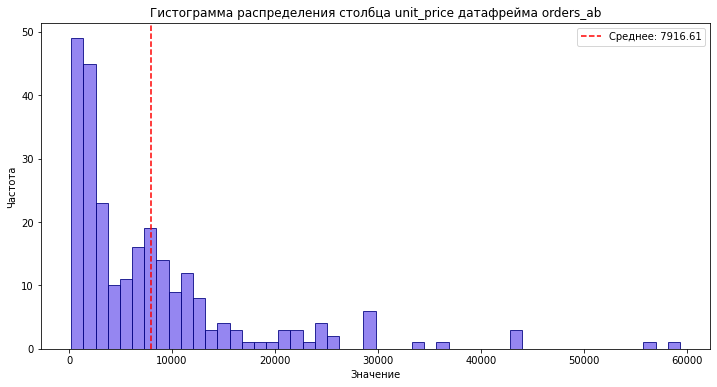

'Описание столбца total_price'

count      255.00
mean     16564.59
std      22005.80
min        218.82
25%       2778.59
50%       8171.30
75%      21953.74
max     168032.34
Name: total_price, dtype: float64

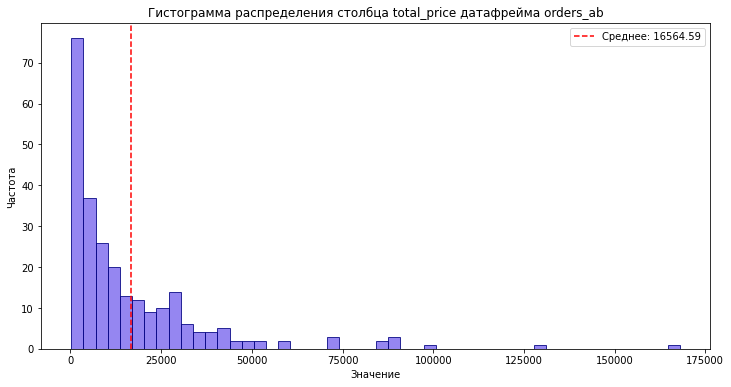

In [122]:
#Посмотрим распределение цен в датафрейме
numeric_data(orders_ab, ['unit_price', 'total_price'])

In [123]:
#посмотрим на заказы, где цена товара лежит выше 99 процентиля
orders_ab[orders_ab['unit_price'] >= orders_ab['unit_price'].quantile(0.99)]

,order_id,user_id,order_date,product_name,quantity,unit_price,total_price,category_name,order_week,order_month,group,revenue
39,37383,45646,2025-01-11 14:56:00,Кресло офисное,3,43357.95,130073.85,Мебель для дома,2025-01-06,2025-01-01,treatment,6503.69
99,38244,47335,2025-01-16 11:03:48,Стол обеденный,1,59299.14,59299.14,Мебель для дома,2025-01-13,2025-01-01,control,2964.96
158,38079,47006,2025-01-20 04:25:52,Кресло офисное,2,43357.95,86715.90,Мебель для дома,2025-01-20,2025-01-01,treatment,4335.79
193,37418,45717,2025-01-23 04:19:53,Диван угловой,3,56010.78,168032.34,Мебель для дома,2025-01-20,2025-01-01,treatment,8401.62
229,38578,48106,2025-01-25 05:46:26,Кресло офисное,2,43357.95,86715.90,Мебель для дома,2025-01-20,2025-01-01,treatment,4335.79


Анализ столбца `unit_price` показывает значительный разброс цен на товары: средняя цена составляет 7 916.61 при стандартном отклонении 9 347.48, что свидетельствует о высокой вариативности ценовой политики. Медианное значение (5 120.85) почти в 1.5 раза ниже среднего, что указывает на правостороннюю асимметрию распределения — наличие небольшого количества дорогих товаров, существенно повышающих средний чек. Минимальная цена 218.82 и максимальная 59 299.14 демонстрируют широкий ценовой диапазон, при этом 75% товаров стоят менее 10 095.41. Примерно такая же ситуация наблюдается в столбце `total_price`.

Причиной этому являются не выбросы данных, а товары, имеющие высокую цену. 
Анализ топовых заказов (выше 99-го процентиля по цене) выявил, что самыми дорогими товарами оказались предметы мебели для дома: офисные кресла (43 357.95 за штуку), обеденный стол (59 299.14) и угловой диван (56 010.78), причем крупные заказы формируют сверхвысокие суммы (до 168 032.34 за три дивана). Интересно, что офисные кресла встречаются в списке трижды, демонстрируя устойчивый спрос на премиальную мебель.

In [124]:
#Для второго сценария
orders_ab_2 = orders_ab[orders_ab['user_id'].isin(users_ab_2['user_id'])]

Датафрейм `orders_ab` предобработан:
- была оптимизирована память благодаря понижению размерности числовых столбцов
- столбцы с датами приведены к типу `datetime`
- отфильтрованы заказы только для пользователей, участвовавших в эксперименте
- добавлен столбец `revenue` с выручкой маркетплейса
- создан датафрейм `orders_ab_2` для пользователей с датой регистрации с 2025-01-06 по 2025-01-26

Перейдем к обработке датафрейма `sessions_ab`.

In [125]:
common_info(sessions_ab)

'Первые 5 строк датафрейма sessions_ab'

,session_id,user_id,session_start,os,device,region,browser,country,entry_path,path_start,utm_source,screen_size,scroll_depth,user_segment,utm_campaign_id,session_week,session_month
0,705,160,2024-01-12 02:30:37.000,Windows,mobile,Москва,Safari,Россия,/home,/recommend/10,unknown,768x1024,51,regular,14.00,2024-01-08,2024-01-01
1,706,160,2024-01-10 06:04:41.000,Windows,mobile,Москва,Safari,Россия,/home,/sale/2,unknown,375x667,71,regular,14.00,2024-01-08,2024-01-01
2,707,160,2024-01-23 03:31:16.000,Windows,mobile,Москва,Safari,Россия,/checkout,/click/20,unknown,768x1024,84,regular,14.00,2024-01-22,2024-01-01
3,708,160,2024-01-18 13:43:45.000,Windows,mobile,Москва,Safari,Россия,/category,/campaign/20,unknown,768x1024,20,regular,14.00,2024-01-15,2024-01-01
4,709,160,2024-01-21 01:09:58.000,Windows,mobile,Москва,Safari,Россия,/promo,/sale/3,unknown,1366x768,88,regular,14.00,2024-01-15,2024-01-01


'Информация о датафрейме sessions_ab'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127407 entries, 0 to 127406
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   session_id       127407 non-null  int64  
 1   user_id          127407 non-null  int64  
 2   session_start    127407 non-null  object 
 3   os               127407 non-null  object 
 4   device           127407 non-null  object 
 5   region           127407 non-null  object 
 6   browser          127407 non-null  object 
 7   country          127407 non-null  object 
 8   entry_path       127407 non-null  object 
 9   path_start       127407 non-null  object 
 10  utm_source       127407 non-null  object 
 11  screen_size      127407 non-null  object 
 12  scroll_depth     127407 non-null  int64  
 13  user_segment     127407 non-null  object 
 14  utm_campaign_id  127079 non-null  float64
 15  session_week     127407 non-null  object 
 16  session_month    127407 non-null  obje

None

'Процент пропущенных значений в столбцах датафрейма'

session_id        0.00
user_id           0.00
session_start     0.00
os                0.00
device            0.00
region            0.00
browser           0.00
country           0.00
entry_path        0.00
path_start        0.00
utm_source        0.00
screen_size       0.00
scroll_depth      0.00
user_segment      0.00
utm_campaign_id   0.00
session_week      0.00
session_month     0.00
dtype: float64

Датафрейм `sessions_ab` содержит 127 407 записей о пользовательских сессиях с 17 столбцами, включая:

- Идентификаторы и временные метки

    - `session_id` (`int64`) - уникальный идентификатор сессии
    - `user_id` (`int64`) - идентификатор пользователя (ключ для соединения с другими датафреймами)
    - `session_start` (`object`) - время начала сессии (преобразуем в `datetime`)
    - `session_week` (`object`) - неделя сессии (преобразуем в `datetime`) 
    - `session_month` (`object`) - месяц сессии (преобразуем в `datetime`)

- Технические характеристики
    - `os` (`object`) - операционная система
    - `device` (`object`) - тип устройства
    - `browser` (`object`) - используемый браузер
    - `screen_size` (`object`) - размер экрана
    - `scroll_depth` (`int64`) - глубина прокрутки (в пикселях или %)

- Географические данные
    - `region` (`object`) - регион
    - `country` (`object`) - страна

- Маркетинговые атрибуты
    - `utm_source` (`object`) - источник трафика
    - `utm_campaign_id` (`float64`) - идентификатор рекламной кампании (имеет 328 пропусков - 0.26%)

- Поведенческие метрики
    - `entry_path` (`object`) - точка входа
    - `path_start` (`object`) - начальный путь
    - `user_segment` (`object`) - сегмент пользователя

Основные данные полные (0% пропусков в ключевых столбцах), но есть незначительные пропуски в `utm_campaign_id`, что связано с особенностью данных.

In [126]:
#Оптимизируем память функцией из первой части
optimize_memory_usage(sessions_ab)
sessions_ab.info()

Размер использования памяти: до 16.52 Mb - после 14.22 Mb (14.0%)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127407 entries, 0 to 127406
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   session_id       127407 non-null  int32  
 1   user_id          127407 non-null  int32  
 2   session_start    127407 non-null  object 
 3   os               127407 non-null  object 
 4   device           127407 non-null  object 
 5   region           127407 non-null  object 
 6   browser          127407 non-null  object 
 7   country          127407 non-null  object 
 8   entry_path       127407 non-null  object 
 9   path_start       127407 non-null  object 
 10  utm_source       127407 non-null  object 
 11  screen_size      127407 non-null  object 
 12  scroll_depth     127407 non-null  int8   
 13  user_segment     127407 non-null  object 
 14  utm_campaign_id  127079 non-null  float32
 15  session_week     12

In [127]:
#Приведем столбцы с датами к нужному формату
for column in sessions_ab[['session_start', 'session_week', 'session_month']]:
    sessions_ab[column] = pd.to_datetime(sessions_ab[column])

In [128]:
#Проверим датафрейм на явные и неявные дубликаты функцией из первой части
duplicates(sessions_ab, ['session_id', 'user_id'])

'В датафрейме sessions_ab найдено 0 явных дубликатов'

'В датафрейме sessions_ab найдено 0 неявных дубликатов'

In [129]:
#Сразу отфильтруем датафрейм по user_id 
sessions_ab = sessions_ab[sessions_ab['user_id'].isin(users_ab['user_id'])]
#и добавим столбец с группой пользователя
sessions_ab = pd.merge(sessions_ab, users_ab[['user_id', 'group']], how = 'left', on = 'user_id')
#Для второго случая
sessions_ab_2 = sessions_ab[sessions_ab['user_id'].isin(users_ab_2['user_id'])]

In [130]:
#Посмотрим на временной диапозон данных
first_date = sessions_ab['session_start'].dt.date.min()
last_date = sessions_ab['session_start'].dt.date.max()
difference = last_date - first_date
display(f'В датафрейме sessions_ab собраны данные с {first_date} по {last_date}, то есть данные за {difference} дней')

'В датафрейме sessions_ab собраны данные с 2025-01-02 по 2025-01-26, то есть данные за 24 days, 0:00:00 дней'

Мы предобработали датафрейм `sessions_ab`, содержащий информацию о сессиях пользователей, в результате чего:
- были оптимизированы числовые столбцы данных
- столбцы `session_start`, `session_week`, `session_month` были приведены к типу `datetime`
- была проведена проверка на дубликаты
- датасет был отфильтрован по пользователям, попавшим в эксперимент 
- был создан датафрейм `sessions_ab_2` для второго случая анализа результатов 

### Промежуточный вывод

В результате предобработки данных была выявлена и устранена ключевая проблема с репрезентативностью выборки: из всех датафреймов (`users_ab`, `events_ab`, `orders_ab`, `sessions_ab`) удалены пользователи, не участвовавшие в эксперименте.

При этом обнаружено расхождение в датах проведения эксперимента (он длился 26 дней вместо заявленных 21). Для обеспечения корректности анализа принято решение рассматривать два сценария: полный период (2025-01-01 - 2025-01-26) и поправленный (2025-01-06 - 2025-01-26), так как он укладывается в сроки и меньше подвержен искажению поведения пользователей из-за новгодних праздников, для каждого созданы отдельные версии датафреймов (_ab и _ab_2).

Все временные метки приведены к `datetime`, проведена оптимизация памяти числовых столбцов, проверка на дубликаты и фильтрация по соответствующим пользователям. Такой подход позволит оценить чувствительность результатов эксперимента к временным границам и обеспечить достоверность выводов при сравнении обоих сценариев.

## Проверка корректности сплитования аудитории

На данном этапе нужно проверить корректность распределения новых пользователей по группам А/В-эксперимента в обоих временных диапозонах. Будем делать это последовательно, то есть сначала рассмотрим корректность распределения по первому сценарию, а потом по второму.

Мы уже выяснили, что пересечений между группами нет, поэтому сразу перейдем к оценке распределений. 

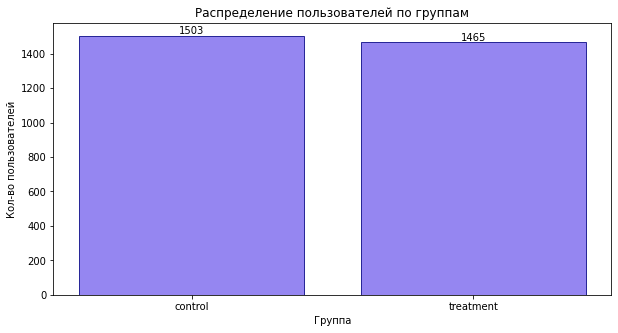

Разница в количестве пользователей в группах: -2.53%


In [131]:
#Посмотрим на распределение по группам
users_group = users_ab.groupby('group')['user_id'].nunique().reset_index()

plt.figure(figsize = (10,5))
bars = plt.bar(users_group['group'], users_group['user_id'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.0f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Распределение пользователей по группам')
plt.xlabel('Группа')
plt.ylabel('Кол-во пользователей')
plt.show()

control_count = users_group[users_group['group'] == 'control']['user_id'].values[0]
test_count = users_group[users_group['group'] == 'treatment']['user_id'].values[0]

difference = (test_count - control_count) / control_count * 100
print(f'Разница в количестве пользователей в группах: {difference:.2f}%')

В контрольную группу попало 1503 человека, а в тестовую 1465, что допустимо для проведения эксперимента. 

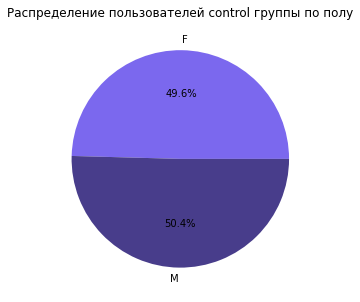

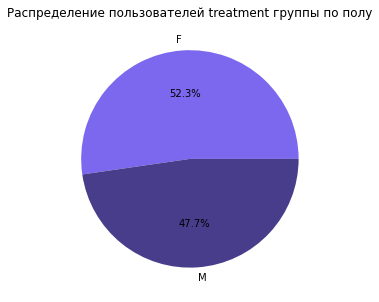

In [132]:
#Посмотрим на распределение пользователей по полу
users_gender = users_ab.groupby(['group', 'gender'])['user_id'].nunique().reset_index()

#строим графики
for group in users_gender['group'].unique():
    df_plot = users_gender[users_gender['group'] == group]
    plt.figure(figsize = (10,5))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['gender'], 
            autopct='%1.1f%%',
           colors = ['Mediumslateblue', 'darkslateblue'])
    plt.title(f'Распределение пользователей {group} группы по полу')

In [133]:
for gender in users_ab['gender'].unique():
    # Количество пользователей по признаку в каждой группе
    success = [
        len(users_ab[(users_ab['group'] == 'treatment') & (users_ab['gender'] == gender)]),
        len(users_ab[(users_ab['group'] == 'control') & (users_ab['gender'] == gender)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab[users_ab['group'] == 'treatment']),
        len(users_ab[users_ab['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{gender}: p-value = {p_value:.4f}")

M: p-value = 0.1385
F: p-value = 0.1385


Распределение пользователей по полу в контрольной (control) и тестовой (treatment) группах показывает сбалансированность по гендеру аудитории. Это подтверждает p-value > 0.05.

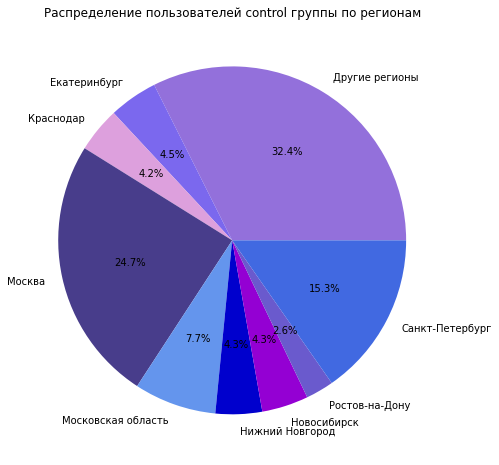

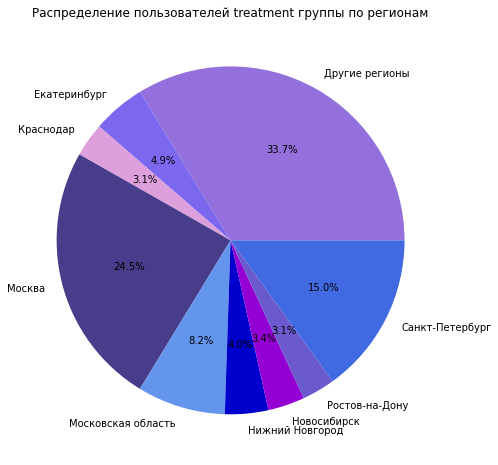

In [134]:
#Посмотрим на распределение пользователей по регионам
users_region = users_ab.groupby(['group', 'region'])['user_id'].nunique().reset_index()

#строим графики
for group in users_region['group'].unique():
    df_plot = users_region[users_region['group'] == group]
    plt.figure(figsize = (16,8))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['region'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по регионам')

In [135]:
for region in users_ab['region'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab[(users_ab['group'] == 'treatment') & (users_ab['region'] == region)]),
        len(users_ab[(users_ab['group'] == 'control') & (users_ab['region'] == region)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab[users_ab['group'] == 'treatment']),
        len(users_ab[users_ab['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{region}: p-value = {p_value:.4f}")

Новосибирск: p-value = 0.1982
Московская область: p-value = 0.5861
Нижний Новгород: p-value = 0.6856
Краснодар: p-value = 0.1278
Санкт-Петербург: p-value = 0.8283
Москва: p-value = 0.9099
Ростов-на-Дону: p-value = 0.4335
Другие регионы: p-value = 0.4453
Екатеринбург: p-value = 0.6160


Общий анализ регионального распределения между контрольной и тестовой группами показывает статистически незначимые различия по всем регионам (все p-value > 0.05), несмотря на некоторые численные расхождения.

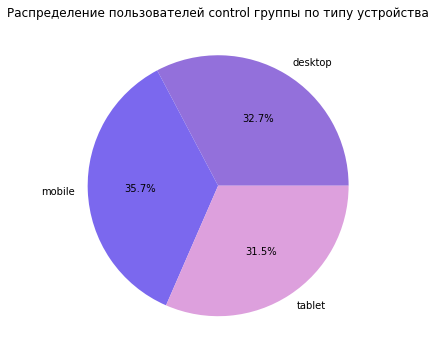

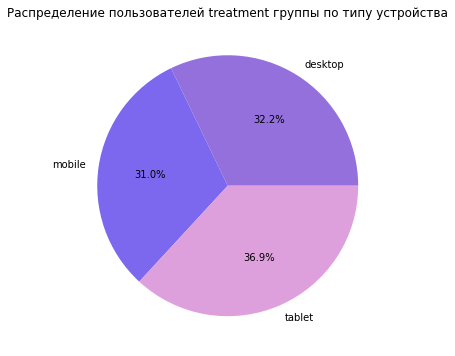

In [136]:
#Посмотрим на распределение пользователей по типу устройства
users_device = users_ab.groupby(['group', 'device'])['user_id'].nunique().reset_index()

#строим графики
for group in users_device['group'].unique():
    df_plot = users_device[users_device['group'] == group]
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['device'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по типу устройства')

In [137]:
for device in users_ab['device'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab[(users_ab['group'] == 'treatment') & (users_ab['device'] == device)]),
        len(users_ab[(users_ab['group'] == 'control') & (users_ab['device'] == device)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab[users_ab['group'] == 'treatment']),
        len(users_ab[users_ab['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{device}: p-value = {p_value:.4f}")

desktop: p-value = 0.7339
tablet: p-value = 0.0022
mobile: p-value = 0.0062


Анализ распределения пользователей по типам устройств выявил статистически значимые различия между контрольной и тестовой группами: доля мобильных пользователей в тестовой группе оказалась на 4.7% ниже (35.7% vs 31.0%, p=0.0062), тогда как планшетных — на 4.2% выше (32.7% vs 36.9%, p=0.0022), при этом распределение десктопов осталось сбалансированным (32.2% vs 31.6%, p=0.7339). Эти системные расхождения свидетельствуют о нарушении рандомизации по типу устройств, однако, так как наше исследование сфокусировано на трафике из TikTok, который используется преимущественно на мобильных устройствах и планшетах, мы можем лояльно отнестись к этому различию. 

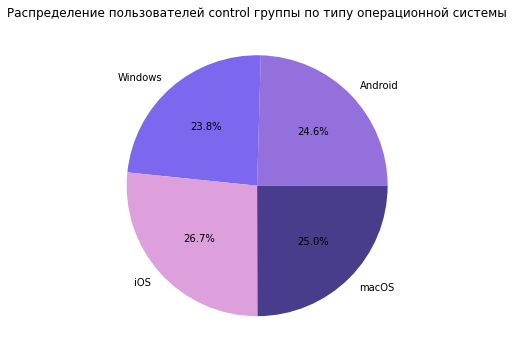

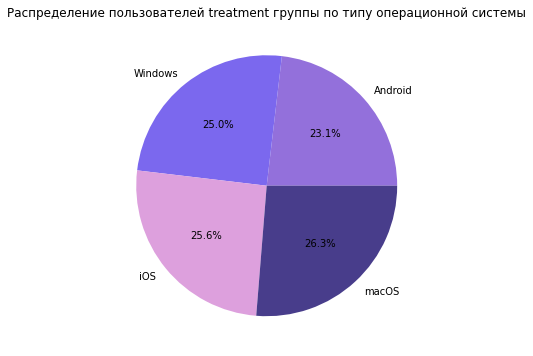

In [138]:
#Посмотрим на распределение пользователей по операционной системе
users_os = users_ab.groupby(['group', 'os'])['user_id'].nunique().reset_index()

#строим графики
for group in users_os['group'].unique():
    df_plot = users_os[users_os['group'] == group]
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['os'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по типу операционной системы')

In [139]:
for os in users_ab['os'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab[(users_ab['group'] == 'treatment') & (users_ab['os'] == os)]),
        len(users_ab[(users_ab['group'] == 'control') & (users_ab['os'] == os)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab[users_ab['group'] == 'treatment']),
        len(users_ab[users_ab['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{os}: p-value = {p_value:.4f}")

iOS: p-value = 0.5022
Android: p-value = 0.3672
Windows: p-value = 0.4604
macOS: p-value = 0.4066


Распределение пользователей по операционной системе в контрольной и тестовой группах сопоставимо для проведения тестирования. 

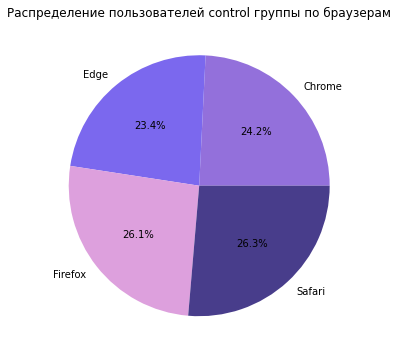

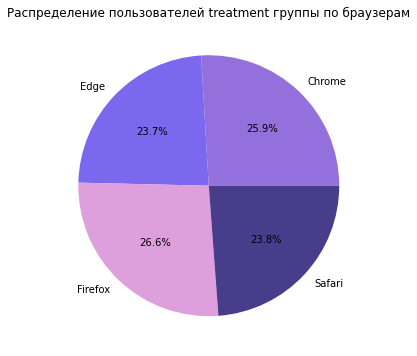

In [140]:
#Посмотрим на распределение пользователей по браузерам
users_browser = users_ab.groupby(['group', 'browser'])['user_id'].nunique().reset_index()

#строим графики
for group in users_browser['group'].unique():
    df_plot = users_browser[users_browser['group'] == group]
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['browser'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по браузерам')

In [141]:
for browser in users_ab['browser'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab[(users_ab['group'] == 'treatment') & (users_ab['browser'] == browser)]),
        len(users_ab[(users_ab['group'] == 'control') & (users_ab['browser'] == browser)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab[users_ab['group'] == 'treatment']),
        len(users_ab[users_ab['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{browser}: p-value = {p_value:.4f}")

Safari: p-value = 0.1127
Firefox: p-value = 0.7704
Edge: p-value = 0.8308
Chrome: p-value = 0.2796


Распределение пользователей по браузерам в контрольной (control) и тестовой (treatment) группах показывает схожие доли: Edge (примерно 23%), Firefox (около 26%) и Chrome (24-26%) занимают близкие позиции в обеих группах, однако в тестовой группе заметно снижение доли Safari (23.8% против 26.3% в контрольной). Эти незначительные расхождения не нарушают общий баланс групп.


Не будем проводить распределение пользователей по `user_segment` и `buyer_segment`, так как эти сегменты формируются за счет активности пользователей в течение исследуемого периода, а не являются естественными признаками. 

**Промежуточный вывод по распределению пользователей в датафрейме `users_ab`**

Эксперимент с контрольной (1503 человека) и тестовой (1465 человек) группами демонстрирует общую сбалансированность по полу (p-value > 0.05), регионам (все p-value > 0.05) и браузерам, несмотря на незначительное снижение доли Safari в тестовой группе. Однако выявлен статистически значимый перекос в распределении типов устройств: в тестовой группе на 4.7% меньше мобильных пользователей (p=0.0062) и на 4.2% больше планшетных (p=0.0022) по сравнению с контрольной группой. Учитывая, что исследование фокусируется на трафике из TikTok, который преимущественно используется на мобильных устройствах и планшетах, этот дисбаланс можно считать допустимым, но при интерпретации результатов следует учитывать потенциальное влияние типа устройства на ключевые метрики. В целом группы достаточно сопоставимы для проведения A/B-теста, за исключением отмеченного перекоса по устройствам, который не критичен в контексте мобильно-ориентированного трафика.


Посмотрим на распределение пользователей с датами регистрации с 6 января по 26 (датафрейм `user_ab_2`).

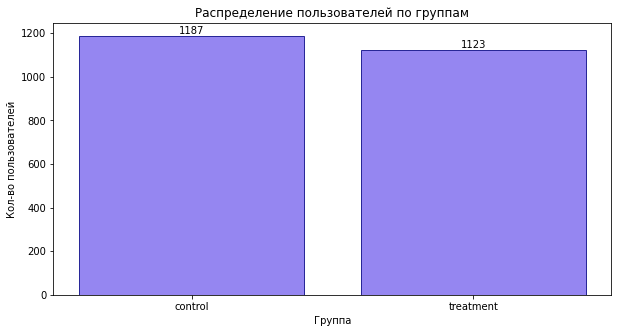

Разница в количестве пользователей в группах: -5.39%


In [142]:
#Посмотрим на распределение по группам
users_group = users_ab_2.groupby('group')['user_id'].nunique().reset_index()

plt.figure(figsize = (10,5))
bars = plt.bar(users_group['group'], users_group['user_id'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.0f}',
             ha='center', va='bottom',
             fontsize=10)
plt.title('Распределение пользователей по группам')
plt.xlabel('Группа')
plt.ylabel('Кол-во пользователей')
plt.show()

control_count = users_group[users_group['group'] == 'control']['user_id'].values[0]
test_count = users_group[users_group['group'] == 'treatment']['user_id'].values[0]

difference = (test_count - control_count) / control_count * 100
print(f'Разница в количестве пользователей в группах: {difference:.2f}%')

В контрольной группе оказалось 1187 человек, а в тестовой 1123. Между ними допустимая разница. 

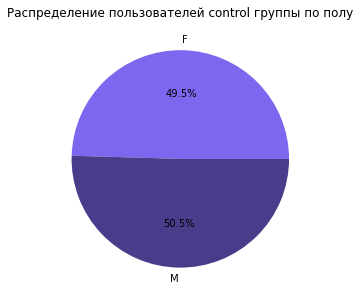

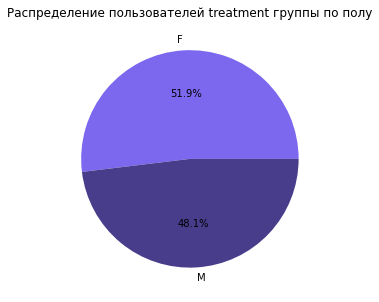

In [143]:
#Посмотрим на распределение пользователей по полу
users_gender = users_ab_2.groupby(['group', 'gender'])['user_id'].nunique().reset_index()

#строим графики
for group in users_gender['group'].unique():
    df_plot = users_gender[users_gender['group'] == group]
    plt.figure(figsize = (10,5))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['gender'], 
            autopct='%1.1f%%',
           colors = ['Mediumslateblue', 'darkslateblue'])
    plt.title(f'Распределение пользователей {group} группы по полу')

In [144]:
for gender in users_ab_2['gender'].unique():
    # Количество пользователей по признаку в каждой группе
    success = [
        len(users_ab_2[(users_ab_2['group'] == 'treatment') & (users_ab_2['gender'] == gender)]),
        len(users_ab_2[(users_ab_2['group'] == 'control') & (users_ab_2['gender'] == gender)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab_2[users_ab_2['group'] == 'treatment']),
        len(users_ab_2[users_ab_2['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{gender}: p-value = {p_value:.4f}")

M: p-value = 0.2532
F: p-value = 0.2532


Сравнение распределения пользователей по полу между группами control и treatment показывает, что различия статистически незначимы (p-value = 0.2532 для обоих полов). В control группе соотношение составляет 49.5% женщин (F) и 50.5% мужчин (M), а в treatment группе — 51.9% F и 48.1% M. 

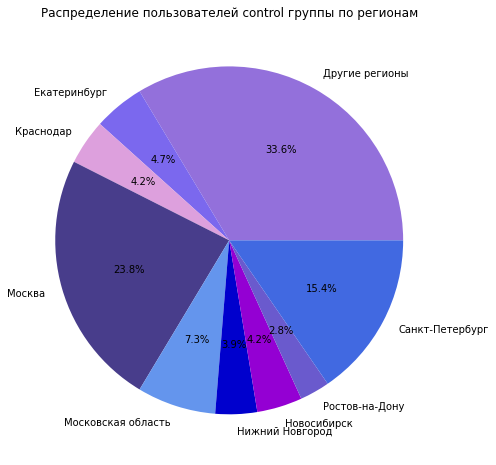

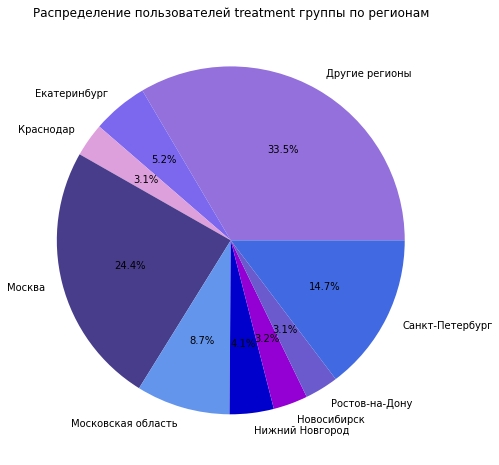

In [145]:
#Посмотрим на распределение пользователей по регионам
users_region = users_ab_2.groupby(['group', 'region'])['user_id'].nunique().reset_index()

#строим графики
for group in users_region['group'].unique():
    df_plot = users_region[users_region['group'] == group]
    plt.figure(figsize = (16,8))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['region'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по регионам')

In [146]:
for region in users_ab_2['region'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab_2[(users_ab_2['group'] == 'treatment') & (users_ab_2['region'] == region)]),
        len(users_ab_2[(users_ab_2['group'] == 'control') & (users_ab_2['region'] == region)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab_2[users_ab_2['group'] == 'treatment']),
        len(users_ab_2[users_ab_2['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{region}: p-value = {p_value:.4f}")

Санкт-Петербург: p-value = 0.6267
Ростов-на-Дону: p-value = 0.6325
Новосибирск: p-value = 0.2015
Москва: p-value = 0.7543
Другие регионы: p-value = 0.9463
Краснодар: p-value = 0.1621
Московская область: p-value = 0.2162
Нижний Новгород: p-value = 0.7862
Екатеринбург: p-value = 0.6201


Сравнение регионального распределения пользователей между control и treatment группами показывает статистически незначимые различия по всем регионам (p-value > 0.05 для каждого).

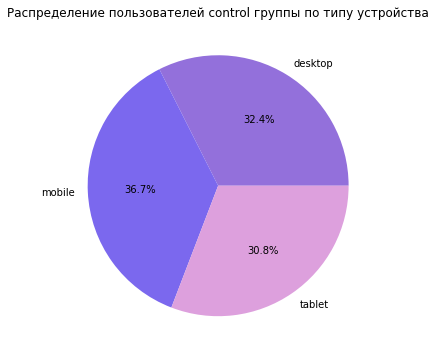

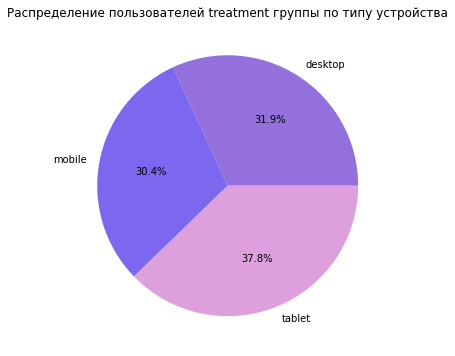

In [147]:
#Посмотрим на распределение пользователей по типу устройства
users_device = users_ab_2.groupby(['group', 'device'])['user_id'].nunique().reset_index()

#строим графики
for group in users_device['group'].unique():
    df_plot = users_device[users_device['group'] == group]
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['device'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по типу устройства')

In [148]:
for device in users_ab_2['device'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab_2[(users_ab_2['group'] == 'treatment') & (users_ab_2['device'] == device)]),
        len(users_ab_2[(users_ab_2['group'] == 'control') & (users_ab_2['device'] == device)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab_2[users_ab_2['group'] == 'treatment']),
        len(users_ab_2[users_ab_2['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{device}: p-value = {p_value:.4f}")

mobile: p-value = 0.0012
tablet: p-value = 0.0005
desktop: p-value = 0.7750


Сравнение распределения пользователей по типам устройств между control и treatment группами выявило статистически значимые различия для мобильных устройств и планшетов:

- Мобильные устройства (mobile):
В control группе — 36.7%, в treatment — 30.4% (разница -6.3%, p-value = 0.0012).

- Планшеты (tablet):
В control группе — 30.9%, в treatment — 37.8% (разница +6.9%, p-value = 0.0005).

- Для десктопов (desktop) различия незначимы (32.4% vs 31.9%, p-value = 0.7750).

Наблюдается существенный перекос в распределении мобильных пользователей (меньше в treatment) и планшетов (больше в treatment). Это может исказить результаты A/B-теста, однако дисбаланс допустим.

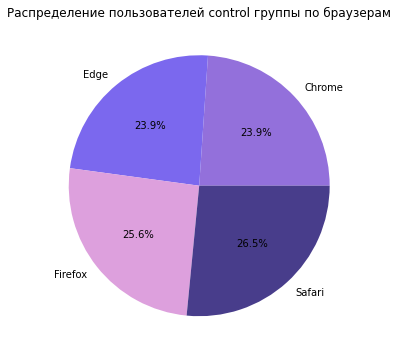

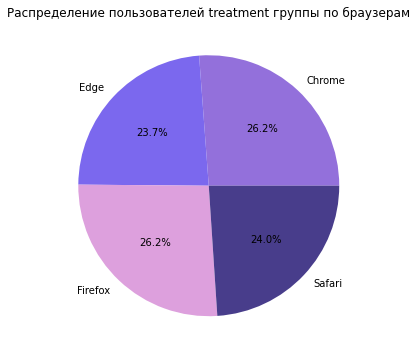

In [149]:
#Посмотрим на распределение пользователей по браузерам
users_browser = users_ab_2.groupby(['group', 'browser'])['user_id'].nunique().reset_index()

#строим графики
for group in users_browser['group'].unique():
    df_plot = users_browser[users_browser['group'] == group]
    plt.figure(figsize = (12,6))
    plt.pie(df_plot['user_id'], 
           labels = df_plot['browser'], 
            autopct='%1.1f%%',
           colors = ['MediumPurple', 'Mediumslateblue', 'plum', 'darkslateblue', 'cornflowerblue', 'mediumblue', 
                    'darkviolet', 'slateblue', 'royalblue'])
    plt.title(f'Распределение пользователей {group} группы по браузерам')

In [150]:
for browser in users_ab_2['browser'].unique():
    # Количество пользователей с данным устройством в каждой группе
    success = [
        len(users_ab_2[(users_ab_2['group'] == 'treatment') & (users_ab_2['browser'] == browser)]),
        len(users_ab_2[(users_ab_2['group'] == 'control') & (users_ab_2['browser'] == browser)])
    ]
    
    # Общее количество пользователей в каждой группе
    nobs = [
        len(users_ab_2[users_ab_2['group'] == 'treatment']),
        len(users_ab_2[users_ab_2['group'] == 'control'])
    ]
    
    z_stat, p_value = proportions_ztest(success, nobs)
    print(f"{browser}: p-value = {p_value:.4f}")

Chrome: p-value = 0.2113
Firefox: p-value = 0.7550
Safari: p-value = 0.1533
Edge: p-value = 0.8926


Группы статистически однородны по используемым браузерам. Незначительные колебания в долях Safari и Chrome (в пределах 2–3%) можно считать случайными. Результаты A/B-теста не будут искажены браузерным фактором.

**Промежуточный вывод по распределнию пользователей в `users_ab_2`**

Общий анализ данных показывает, что контрольная (1187 человек) и тестовая (1123 человека) группы сопоставимы по размеру, демографическим (пол) и географическим характеристикам, а также по используемым браузерам, что подтверждается статистически незначимыми различиями (p-value > 0.05). Однако обнаружен существенный дисбаланс в распределении типов устройств: в тестовой группе значимо меньше мобильных пользователей (-6.3%, p=0.0012) и больше планшетных (+6.9%, p=0.0005) по сравнению с контрольной группой, что требует дополнительной проверки влияния этого фактора на целевые метрики A/B-теста. В целом, за исключением перекоса по устройствам, группы можно считать репрезентативными для проведения эксперимента.

### Промежуточный вывод по проверке сплитования пользователей

Вывод по `users_ab`:

Группы демонстрируют сбалансированность по полу, регионам и браузерам, но в тестовой группе выявлен значимый перекос по устройствам: на 4.7% меньше мобильных и на 4.2% больше планшетных пользователей. Для TikTok-трафика, где преобладают мобильные устройства, этот дисбаланс допустим, но требует учета при интерпретации результатов. В остальном группы сопоставимы для корректного A/B-тестирования.

Вывод по `users_ab_2`:

Несмотря на общую сбалансированность по демографии и географии, в тестовой группе обнаружен выраженный дисбаланс устройств: на 6.3% меньше мобильных и на 6.9% больше планшетных пользователей, как и в основном датафрейме.

В будущем рекомендуется проверить корректность рандомизации экспериментов.

## Анализ результатов A/B-эксперимента

Напомним, что: 
- Основная метрика: конверсия в первую покупку — доля пользователей, зарегистрировавшихся с TikTok и совершивших первую покупку

- Вспомогательные метрики
    - ARPU (средняя выручка на пользователя TikTok)
    - ARPPU (средняя выручка на покупателя TikTok)
    - AOV (средний чек TikTok)
- Барьерная метрика: общая выручка от пользователей TikTok

Опять же будем анализировать результаты эксперимента по двум сценариям последовательно: по первому сценарию (`users_ab`), а потом по второму (`users_ab_2`).

Начнем с построения воронки событий от регистрации до оформления заказа в обеих группах и узнаем показатель ключевой метрики. 

In [151]:
# Определим порядок событий для воронки
funnel_steps = [
    'page_view',          # Шаг 1: Просмотр страницы
    'product_view',       # Шаг 2: Просмотр товара
    'add_to_cart',        # Шаг 3: Добавление в корзину
    'checkout_start',     # Шаг 4: Начало оформления
    'checkout_complete'   # Шаг 5: Завершение оформления
]
funnel_df = []
checkout_complete_users = events_ab[events_ab['event_type'] == 'checkout_complete']['user_id'].unique()
for group in events_ab['group'].unique():
    funnel_data = []
    df_events = events_ab[events_ab['group'] == group]
    df_users = users_ab[users_ab['group'] == group]
    df_orders = orders_ab[(orders_ab['group'] == group) & (orders_ab['user_id'].isin(checkout_complete_users))]
    funnel_data.append({'group': group, 'step': 'registration', 'users': df_users['user_id'].nunique()}) #добавляем регистрацию
    for step in funnel_steps:
        unique_users = df_events[df_events['event_type'] == step]['user_id'].nunique()
        funnel_data.append({'group': group, 'step': step, 'users': unique_users})
    #помним из описания первой части проекта, что checkout_complete не означает заказ. заказ просиходит по факту оплаты
    #а значит, нам нужно узнать из orders_ab, сколько пользователей завершили заказ
    funnel_data.append({'group': group, 'step': 'order_completed', 'users': df_orders['user_id'].nunique()})
    funnel = pd.DataFrame(funnel_data)
    funnel['conversion_from_first_%'] = round(funnel['users'] * 100 / funnel['users'].iloc[0], 2)
    funnel['conversion_from_previous_%'] = round(funnel['users'] * 100 / funnel['users'].shift(1), 2)
    funnel_df.append(funnel)
    
funnel_df = pd.concat(funnel_df)

display('Данные воронки конверсии:')
display(funnel_df)

'Данные воронки конверсии:'

,group,step,users,conversion_from_first_%,conversion_from_previous_%
0,control,registration,1503,100.00,NaN
1,control,page_view,258,17.17,17.17
2,control,product_view,257,17.10,99.61
3,control,add_to_cart,211,14.04,82.10
4,control,checkout_start,126,8.38,59.72
5,control,checkout_complete,79,5.26,62.70
6,control,order_completed,2,0.13,2.53
0,treatment,registration,1465,100.00,NaN
1,treatment,page_view,232,15.84,15.84
2,treatment,product_view,230,15.70,99.14


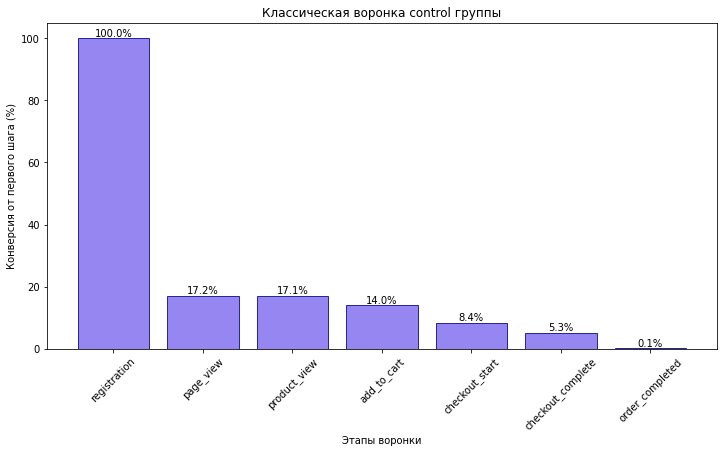

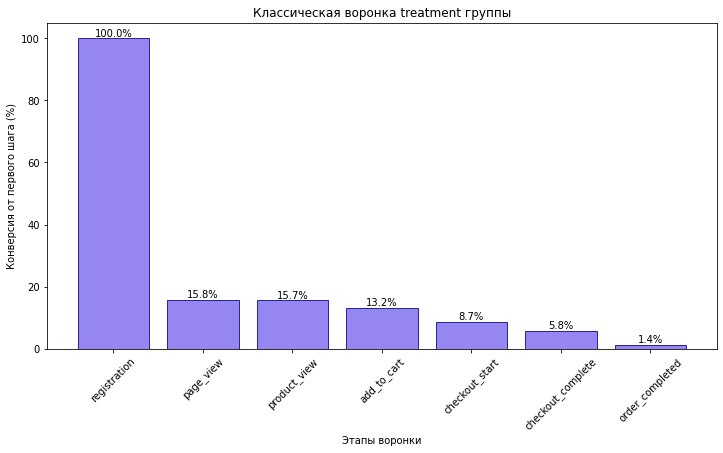

In [152]:
#Строим классические воронки
for group in funnel_df['group'].unique():
    df_plot = funnel_df[funnel_df['group'] == group]
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['step'],
       df_plot['conversion_from_first_%'], 
       color = 'mediumslateblue', 
       edgecolor = 'navy', alpha = 0.8)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}%',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'Классическая воронка {group} группы')
    plt.ylabel('Конверсия от первого шага (%)')
    plt.xlabel('Этапы воронки')
    plt.xticks(rotation = 45)
    plt.show()

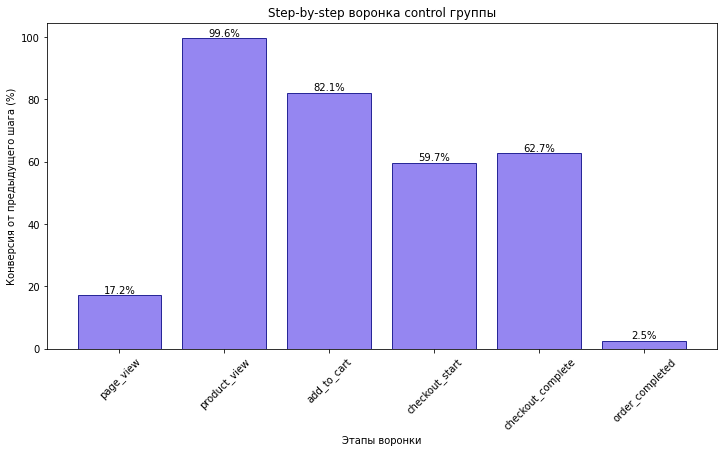

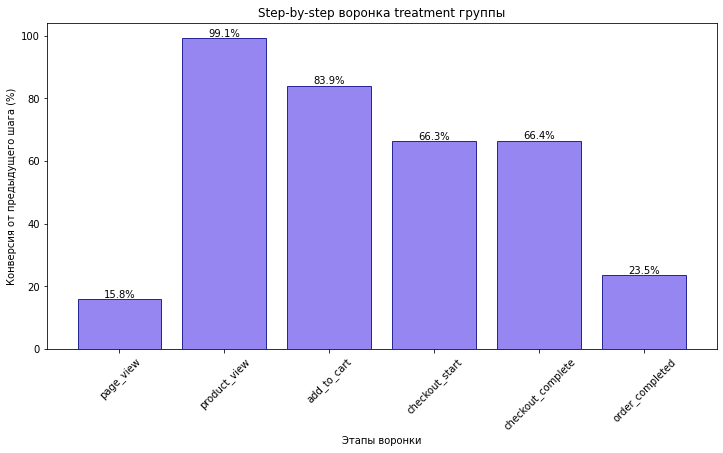

In [153]:
#Строим воронки step-by-step
for group in funnel_df['group'].unique():
    df_plot = funnel_df[funnel_df['group'] == group]
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['step'][1:],
       df_plot['conversion_from_previous_%'][1:], 
       color = 'mediumslateblue', 
       edgecolor = 'navy', alpha = 0.8)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}%',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'Step-by-step воронка {group} группы')
    plt.ylabel('Конверсия от предыдущего шага (%)')
    plt.xlabel('Этапы воронки')
    plt.xticks(rotation = 45)
    plt.show()

Воронка контрольной группы (control) начинается с 1503 регистраций, но только 17.17% пользователей переходят к просмотру страниц, что указывает на слабый онбординг. Далее конверсия между шагами стабильна: 99.61% просмотревших страницы смотрят товары, 82.1% из них добавляют в корзину. Основное падение происходит при переходе к оформлению (59.72%) и особенно на финальном шаге — лишь 2.53% завершивших оформление доходят до order_completed, что выявляет критическую проблему в процессе оплаты или подтверждения заказов.

В тестовой группе (treatment) из 1465 регистраций 15.84% переходят к просмотру страниц, демонстрируя схожий с контрольной группой слабый начальный этап. Однако на ключевых шагах воронки тестовая группа показывает лучшие результаты: конверсия из корзины в оформление — 66.32% (против 59.72%), а завершение заказа — 66.41% (против 62.7%). Наиболее значимое отличие — финальная конверсия в order_completed: 23.53% (1.37% от всех регистраций) против 2.53% (0.13%) в control. Такой рост может указывать на эффективность изменений в тестовой групп.

Ключевой вывод: тестовая группа демонстрирует лучшую конверсию из регистрации в заказ, однако разница требует проверки статистической значимости. Основная проблема обеих групп — высокий отток после регистрации, что указывает на необходимость доработки онбординга.

Гипотезы:

H0: Конверсия из регистрации в заказ одинакова и в контрольной, и в тестовой группе.

H1: Конверсия из регистрации в заказ в тестовой группе отлична от контрольной.

In [154]:
#так как провереряемая метрика - это конверсия, то будем использовать z-тест пропорций
#число регистраций
reg_control  = users_ab[users_ab['group'] == 'control']['user_id'].nunique()
reg_test = users_ab[users_ab['group'] == 'treatment']['user_id'].nunique()
#число успехов - заказов
order_control = orders_ab[orders_ab['group'] == 'control']['user_id'].nunique()
order_test = orders_ab[orders_ab['group'] == 'treatment']['user_id'].nunique()

total = [reg_test, reg_control]
successes = [order_test, order_control]
#Проверяем значимость
z_score, p_value = proportions_ztest(successes, total, alternative='two-sided')

if p_value < 0.05:
    display(f'p-value = {p_value:.20f}. Изменение конверсии из регистрации в заказ статистически значимо, подтверждается альтернативная гипотеза')
else:
    display(f'p-value = {p_value:.20f}. Изменение конверсии из регистрации в заказ статистически не значимо, альтернативная гипотеза отвергается')

'p-value = 0.00000000000000000316. Изменение конверсии из регистрации в заказ статистически значимо, подтверждается альтернативная гипотеза'

Подтверждается альтернативная гипотеза, а это значит, что конверсия в заказ в тестовой группе статистически более значима, чем в контрольной. 

Таким образом, предоставление бонуса на первую покупку пользователям, привлеченным из TikTok, положительно влияет на конверсию в заказ.

Перейдем к проверке вспомогательных и барьерной метрик. 

In [155]:
all_users = users_ab.groupby('group')['user_id'].nunique().reset_index().rename(columns = {'user_id':'total_users'})
paying_users = orders_ab.groupby('group')['user_id'].nunique().reset_index().rename(columns = {'user_id':'paying_users'})

#Считаем выручку
revenue = orders_ab.groupby('group')['revenue'].sum().reset_index()
revenue = pd.merge(all_users, revenue, on = 'group', how = 'left')
revenue = pd.merge(revenue, paying_users, on = 'group', how = 'left')

# Считаем ARPU и ARPPU
revenue['ARPU'] = revenue['revenue'] / revenue['total_users']
revenue['ARPPU'] = revenue['revenue'] / revenue['paying_users']

control_arpu = revenue[revenue['group'] == 'control']['ARPU'].values[0]
treatment_arpu = revenue[revenue['group'] == 'treatment']['ARPU'].values[0]

absolute_lift_arpu = treatment_arpu - control_arpu
relative_lift_arpu = (treatment_arpu - control_arpu) / control_arpu * 100

control_arppu = revenue[revenue['group'] == 'control']['ARPPU'].values[0]
treatment_arppu = revenue[revenue['group'] == 'treatment']['ARPPU'].values[0]

absolute_lift_arppu = treatment_arppu - control_arppu
relative_lift_arppu = (treatment_arppu - control_arppu) / control_arppu * 100

control_revenue = revenue[revenue['group'] == 'control']['revenue'].values[0]
treatment_revenue = revenue[revenue['group'] == 'treatment']['revenue'].values[0]

absolute_lift_revenue = treatment_revenue - control_revenue
relative_lift_revenue = (treatment_revenue - control_revenue) / control_revenue * 100

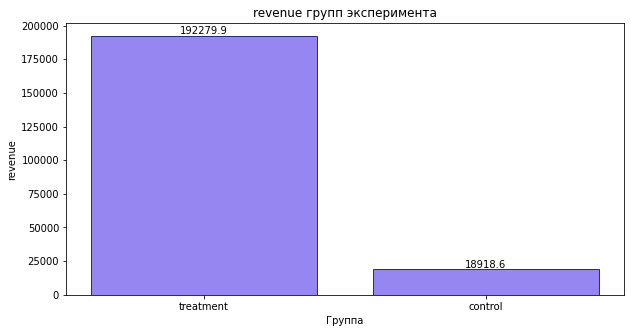

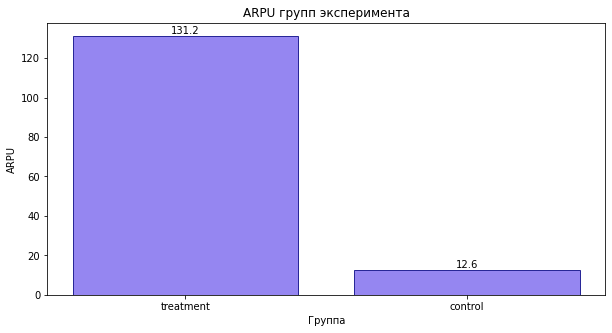

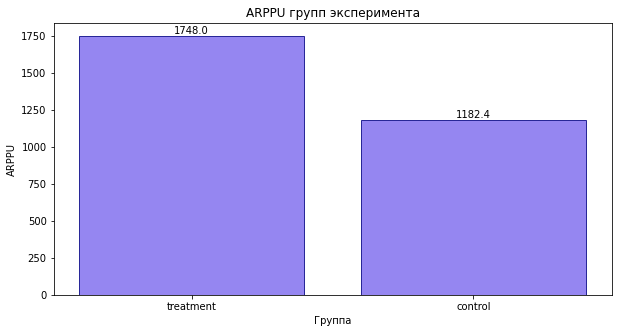

'Абсолютная разница ARPU между тестовой и контрольной группой составила 118.66, относительная разница = 942.71%'

'Абсолютная разница ARPPU между тестовой и контрольной группой составила 565.58, относительная разница = 47.83%'

'Абсолютная разница выручки между тестовой и контрольной группой составила 173361.22, относительная разница = 916.35%'

In [156]:
for column in revenue[['revenue', 'ARPU', 'ARPPU']]:
    df_plot = revenue[['group', column]]
    df_plot = df_plot.sort_values(by = column, ascending = False)
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['group'], df_plot[column], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'{column} групп эксперимента')
    plt.xlabel('Группа')
    plt.ylabel(f'{column}')
    plt.show()

display(f'Абсолютная разница ARPU между тестовой и контрольной группой составила {absolute_lift_arpu:.2f}, относительная разница = {relative_lift_arpu:.2f}%')
display(f'Абсолютная разница ARPPU между тестовой и контрольной группой составила {absolute_lift_arppu:.2f}, относительная разница = {relative_lift_arppu:.2f}%')
display(f'Абсолютная разница выручки между тестовой и контрольной группой составила {absolute_lift_revenue:.2f}, относительная разница = {relative_lift_revenue:.2f}%')

In [157]:
#Проверим статистическую значимость изменения ARPPU
#H0: ARPPU в тестовой группе и в контрольной одинаковы.
#H1: ARPPU в тестовой группе и в контрольной различны.
group_1 = orders_ab[orders_ab['group'] == 'treatment'].groupby('user_id')['revenue'].sum().values
group_2 = orders_ab[orders_ab['group'] == 'control'].groupby('user_id')['revenue'].sum().values

def bootstrap_mean_diff(group1, group2, n_bootstrap=10000):
    differences = []
    for _ in range(n_bootstrap):
        sample1 = np.random.choice(group1, size=len(group1), replace=True)
        sample2 = np.random.choice(group2, size=len(group2), replace=True)
        differences.append(sample2.mean() - sample1.mean())

    ci_lower = np.percentile(differences, 2.5)
    ci_upper = np.percentile(differences, 97.5)

    return ci_lower, ci_upper

bootstrap_mean_diff(group_1, group_2)

(-1115.0296630859375, -29.35403747558614)

Доверительный интервал разницы ARPPU (control - treatment): от -1108.31 до -29.59 рублей. Так как интервал не включает 0, то можно говорить о статистической значимости отличий - ARPPU в control-группе ниже, чем в treatment.

Результаты показывают значительное превосходство тестовой группы (treatment) по ключевым метрикам: средний доход на пользователя (ARPU) в тестовой группе составил 131.25 против 12.59 в контрольной (абсолютный прирост +118.66, относительный +942.3%), а средний доход на платящего пользователя (ARPPU) достиг 1748.00 против 1182.42 (абсолютный прирост +565.58, относительный +47.8%). Столь существенный рост ARPU при меньшем количестве платящих пользователей (110 против 16) свидетельствует о высокой эффективности изменений, внедренных в тестовой группе, особенно в части монетизации всей аудитории, а не только совершающих покупки.

Также видим разницу в другой барьерной метрике - в выручке между группами. Тестовая группа демонстрирует рост на 916.35%. А это означает, что внедрение бонуса не только не ухудшает показатели, но и улучшает их. 

In [158]:
#Рассчитаем AOV 
total_price = orders_ab.groupby('group')['total_price'].sum().reset_index()
total_orders = orders_ab.groupby('group')['order_id'].nunique().reset_index()
aov = pd.merge(total_price, total_orders, on = 'group', how = 'left')
aov['AOV'] = aov['total_price'] / aov['order_id']
aov = aov.sort_values(by = 'AOV', ascending = False)


control_aov = aov[aov['group'] == 'control']['AOV'].values[0]
treatment_aov = aov[aov['group'] == 'treatment']['AOV'].values[0]

absolute_lift_aov = treatment_aov - control_aov
relative_lift_aov = (treatment_aov - control_aov) / control_aov * 100
aov

,group,total_price,order_id,AOV
1,treatment,3845597.00,231,16647.61
0,control,378372.91,24,15765.54


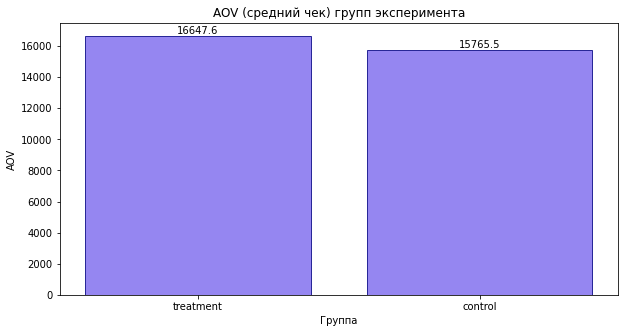

'Абсолютная разница AOV между тестовой и контрольной группой составила 882.07, относительная разница = 5.59%'

In [159]:
plt.figure(figsize = (10,5))
bars = plt.bar(aov['group'], aov['AOV'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}',
                 ha='center', va='bottom',
                 fontsize=10)
plt.title('AOV (средний чек) групп эксперимента')
plt.xlabel('Группа')
plt.ylabel('AOV')
plt.show()

display(f'Абсолютная разница AOV между тестовой и контрольной группой составила {absolute_lift_aov:.2f}, относительная разница = {relative_lift_aov:.2f}%')

Средний чек (AOV) в тестовой группе составил 16 647.6 руб., что на 5.59% выше контрольного показателя (15 765.54 руб.). Особенно важно, что выросло и количество заказов 231 в тестовой группе против 24 в контрольной.

**Вывод по анализу эксперимента в `users_ab`**

Эксперимент показал статистически значимое улучшение ключевых метрик в тестовой группе: конверсия в заказ выросла с 0.1% до 1.4%, средний доход на пользователя (ARPU) увеличился на 942% (с 12.59 до 131.25), а общая выручка выросла на 916% благодаря сочетанию роста количества заказов (в 9.6 раз) и увеличения среднего чека на 5.6%. Результаты подтверждают эффективность внедренного бонуса для пользователей TikTok, который не только не ухудшил финансовые показатели, но и значительно повысил монетизацию аудитории.
____________
Проведем аналогичный анализ по датафрейму `users_ab_2`.

In [160]:
# Определим порядок событий для воронки
funnel_steps = [
    'page_view',          # Шаг 1: Просмотр страницы
    'product_view',       # Шаг 2: Просмотр товара
    'add_to_cart',        # Шаг 3: Добавление в корзину
    'checkout_start',     # Шаг 4: Начало оформления
    'checkout_complete'   # Шаг 5: Завершение оформления
]
funnel_df = []
checkout_complete_users = events_ab_2[events_ab_2['event_type'] == 'checkout_complete']['user_id'].unique()
for group in events_ab['group'].unique():
    funnel_data = []
    df_events = events_ab_2[events_ab_2['group'] == group]
    df_users = users_ab_2[users_ab_2['group'] == group]
    df_orders = orders_ab_2[(orders_ab_2['group'] == group) & (orders_ab_2['user_id'].isin(checkout_complete_users))]
    funnel_data.append({'group': group, 'step': 'registration', 'users': df_users['user_id'].nunique()}) #добавляем регистрацию
    for step in funnel_steps:
        unique_users = df_events[df_events['event_type'] == step]['user_id'].nunique()
        funnel_data.append({'group': group, 'step': step, 'users': unique_users})
    #помним из описания первой части проекта, что checkout_complete не означает заказ. заказ просиходит по факту оплаты
    #а значит, нам нужно узнать из orders_ab, сколько пользователей завершили заказ
    funnel_data.append({'group': group, 'step': 'order_completed', 'users': df_orders['user_id'].nunique()})
    funnel = pd.DataFrame(funnel_data)
    funnel['conversion_from_first_%'] = round(funnel['users'] * 100 / funnel['users'].iloc[0], 2)
    funnel['conversion_from_previous_%'] = round(funnel['users'] * 100 / funnel['users'].shift(1), 2)
    funnel_df.append(funnel)
    
funnel_df = pd.concat(funnel_df)

display('Данные воронки конверсии:')
display(funnel_df)

'Данные воронки конверсии:'

,group,step,users,conversion_from_first_%,conversion_from_previous_%
0,control,registration,1187,100.00,NaN
1,control,page_view,172,14.49,14.49
2,control,product_view,171,14.41,99.42
3,control,add_to_cart,144,12.13,84.21
4,control,checkout_start,83,6.99,57.64
5,control,checkout_complete,54,4.55,65.06
6,control,order_completed,1,0.08,1.85
0,treatment,registration,1123,100.00,NaN
1,treatment,page_view,150,13.36,13.36
2,treatment,product_view,148,13.18,98.67


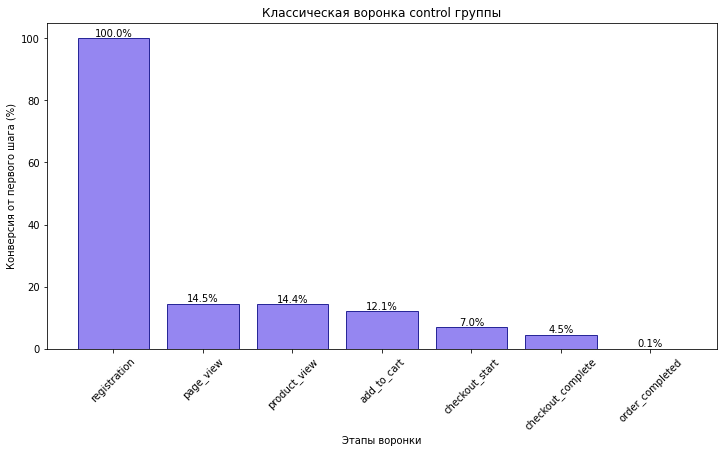

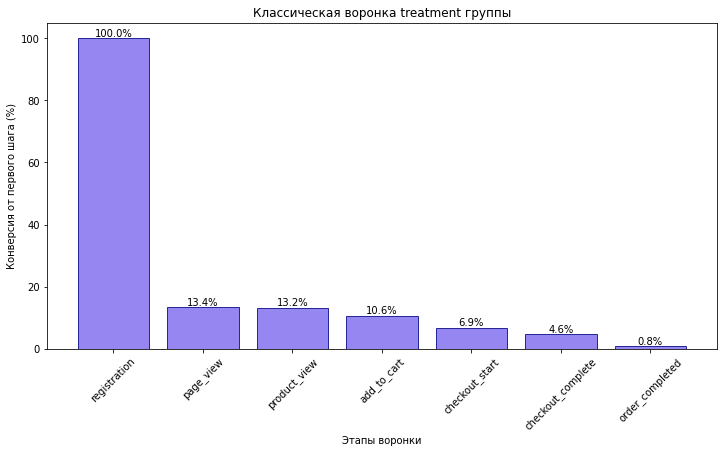

In [161]:
#Строим классические воронки
for group in funnel_df['group'].unique():
    df_plot = funnel_df[funnel_df['group'] == group]
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['step'],
       df_plot['conversion_from_first_%'], 
       color = 'mediumslateblue', 
       edgecolor = 'navy', alpha = 0.8)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}%',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'Классическая воронка {group} группы')
    plt.ylabel('Конверсия от первого шага (%)')
    plt.xlabel('Этапы воронки')
    plt.xticks(rotation = 45)
    plt.show()

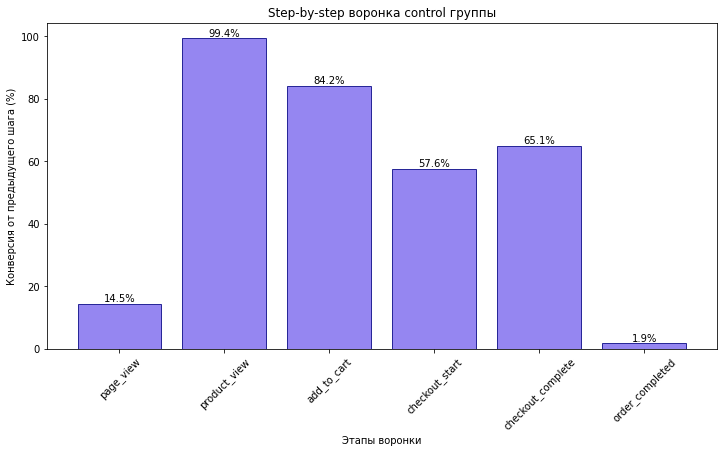

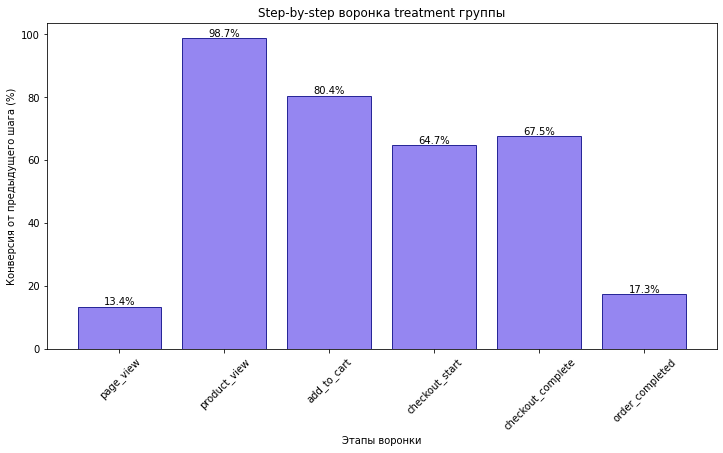

In [162]:
#Строим воронки step-by-step
for group in funnel_df['group'].unique():
    df_plot = funnel_df[funnel_df['group'] == group]
    plt.figure(figsize = (12,6))
    bars = plt.bar(df_plot['step'][1:],
       df_plot['conversion_from_previous_%'][1:], 
       color = 'mediumslateblue', 
       edgecolor = 'navy', alpha = 0.8)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}%',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'Step-by-step воронка {group} группы')
    plt.ylabel('Конверсия от предыдущего шага (%)')
    plt.xlabel('Этапы воронки')
    plt.xticks(rotation = 45)
    plt.show()

Анализ воронки выявил ключевые узкие места: в обеих группах наблюдается резкое падение конверсии на первых этапах (только 14.5% control и 13.4% treatment пользователей переходят от регистрации к просмотру страницы), что указывает на проблемы с вовлечением новых пользователей. Наибольшие потери происходят при переходе от добавления в корзину к оформлению (конверсия от предыдущего шага 57.64% в control и 64.71% в treatment). При этом тестовая группа демонстрирует системно лучшие показатели на всех этапах, особенно в финальной конверсии (0.8% против 0.1%), что требует проверки на статистическую значимость. Основные точки роста - оптимизация онбординга для повышения вовлеченности новых пользователей.

Проверим статистическую значимость изменения конверсии.

Гипотезы:

H0: Конверсия из регистрации в заказ одинакова и в контрольной, и в тестовой группе.

H1: Конверсия из регистрации в заказ в тестовой группе отлична от контрольной.

In [163]:
#так как провереряемая метрика - это конверсия, то будем использовать z-тест пропорций
#число регистраций
reg_control  = users_ab_2[users_ab_2['group'] == 'control']['user_id'].nunique()
reg_test = users_ab_2[users_ab_2['group'] == 'treatment']['user_id'].nunique()
#число успехов - заказов
order_control = orders_ab_2[orders_ab_2['group'] == 'control']['user_id'].nunique()
order_test = orders_ab_2[orders_ab_2['group'] == 'treatment']['user_id'].nunique()

total = [reg_test, reg_control]
successes = [order_test, order_control]
#Проверяем значимость
z_score, p_value = proportions_ztest(successes, total, alternative='two-sided')

if p_value < 0.05:
    display(f'p-value = {p_value:.20f}. Изменение конверсии из регистрации в заказ статистически значимо, подтверждается альтернативная гипотеза')
else:
    display(f'p-value = {p_value:.20f}. Изменение конверсии из регистрации в заказ статистически не значимо, альтернативная гипотеза отвергается')

'p-value = 0.00000000000001593360. Изменение конверсии из регистрации в заказ статистически значимо, подтверждается альтернативная гипотеза'

Результаты A/B-теста показали статистически значимое улучшение конверсии с крайне низким p-value < 0.0001, что однозначно подтверждает эффективность изменений в тестовой группе.  Альтернативная гипотеза о различии конверсий принимается с высочайшей степенью достоверности — улучшение показателей в тестовой группе является статистически доказанным эффектом, а не результатом случайных колебаний данных. 

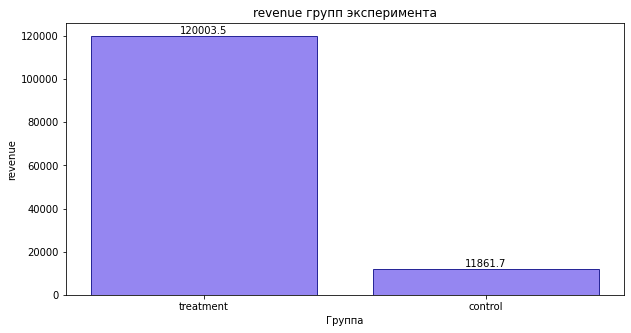

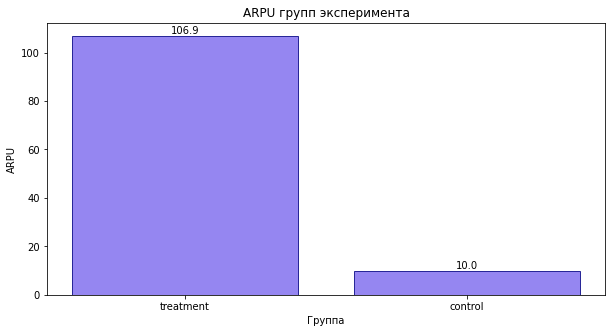

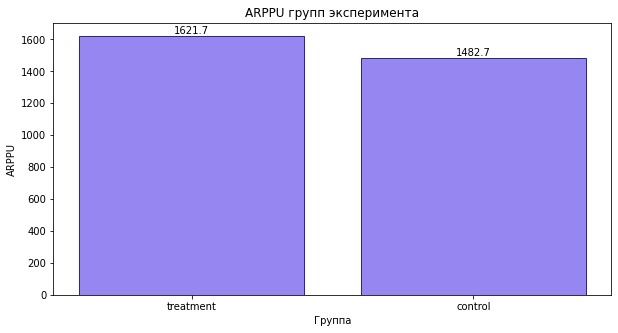

'Абсолютная разница ARPU между тестовой и контрольной группой составила 96.87, относительная разница = 969.35%'

'Абсолютная разница ARPPU между тестовой и контрольной группой составила 138.96, относительная разница = 9.37%'

'Абсолютная разница выручки между тестовой и контрольной группой составила 108141.82, относительная разница = 911.69%'

In [164]:
all_users = users_ab_2.groupby('group')['user_id'].nunique().reset_index().rename(columns = {'user_id':'total_users'})
paying_users = orders_ab_2.groupby('group')['user_id'].nunique().reset_index().rename(columns = {'user_id':'paying_users'})

#Считаем выручку
revenue = orders_ab_2.groupby('group')['revenue'].sum().reset_index()
revenue = pd.merge(all_users, revenue, on = 'group', how = 'left')
revenue = pd.merge(revenue, paying_users, on = 'group', how = 'left')

# Считаем ARPU и ARPPU
revenue['ARPU'] = revenue['revenue'] / revenue['total_users']
revenue['ARPPU'] = revenue['revenue'] / revenue['paying_users']

control_arpu = revenue[revenue['group'] == 'control']['ARPU'].values[0]
treatment_arpu = revenue[revenue['group'] == 'treatment']['ARPU'].values[0]

absolute_lift_arpu = treatment_arpu - control_arpu
relative_lift_arpu = (treatment_arpu - control_arpu) / control_arpu * 100

control_arppu = revenue[revenue['group'] == 'control']['ARPPU'].values[0]
treatment_arppu = revenue[revenue['group'] == 'treatment']['ARPPU'].values[0]

absolute_lift_arppu = treatment_arppu - control_arppu
relative_lift_arppu = (treatment_arppu - control_arppu) / control_arppu * 100

control_revenue = revenue[revenue['group'] == 'control']['revenue'].values[0]
treatment_revenue = revenue[revenue['group'] == 'treatment']['revenue'].values[0]

absolute_lift_revenue = treatment_revenue - control_revenue
relative_lift_revenue = (treatment_revenue - control_revenue) / control_revenue * 100

for column in revenue[['revenue', 'ARPU', 'ARPPU']]:
    df_plot = revenue[['group', column]]
    df_plot = df_plot.sort_values(by = column, ascending = False)
    plt.figure(figsize = (10,5))
    bars = plt.bar(df_plot['group'], df_plot[column], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}',
                 ha='center', va='bottom',
                 fontsize=10)
    plt.title(f'{column} групп эксперимента')
    plt.xlabel('Группа')
    plt.ylabel(f'{column}')
    plt.show()

display(f'Абсолютная разница ARPU между тестовой и контрольной группой составила {absolute_lift_arpu:.2f}, относительная разница = {relative_lift_arpu:.2f}%')
display(f'Абсолютная разница ARPPU между тестовой и контрольной группой составила {absolute_lift_arppu:.2f}, относительная разница = {relative_lift_arppu:.2f}%')
display(f'Абсолютная разница выручки между тестовой и контрольной группой составила {absolute_lift_revenue:.2f}, относительная разница = {relative_lift_revenue:.2f}%')

In [165]:
#Проверим статистическую значимость изменения ARPPU
#H0: ARPPU в тестовой группе и в контрольной одинаковы.
#H1: ARPPU в тестовой группе и в контрольной различны.
group_1 = orders_ab_2[orders_ab_2['group'] == 'treatment'].groupby('user_id')['revenue'].sum().values
group_2 = orders_ab_2[orders_ab_2['group'] == 'control'].groupby('user_id')['revenue'].sum().values

def bootstrap_mean_diff(group1, group2, n_bootstrap=10000):
    differences = []
    for _ in range(n_bootstrap):
        sample1 = np.random.choice(group1, size=len(group1), replace=True)
        sample2 = np.random.choice(group2, size=len(group2), replace=True)
        differences.append(sample2.mean() - sample1.mean())

    ci_lower = np.percentile(differences, 2.5)
    ci_upper = np.percentile(differences, 97.5)

    return ci_lower, ci_upper

bootstrap_mean_diff(group_1, group_2)

(-922.911880493164, 633.2846466064453)

Доверительный интервал разницы средних ARPPU между группами (control - treatment) получился (-887.33, 629.17). Он включает ноль, а значит, различие не является статистически значимым.

Тестовая группа продемонстрировала хорошие результаты: ARPU вырос с 9.99 до 106.86, а общая выручка увеличилась на 911% при этом средняя выручка с платящего пользователя (ARPPU) также выросла на 9.4% (с 1482.71 до 1621.67), однако ее рост не значим статистически. Особенно заметен рост числа платящих пользователей — с 8 в контрольной группе до 74 в тестовой (в 9.25 раз), что свидетельствует об эффективности внедренных изменений, которые не только привлекли больше покупателей, но и повысили выручку с них.

In [166]:
#Рассчитаем AOV 
total_price = orders_ab_2.groupby('group')['total_price'].sum().reset_index()
total_orders = orders_ab_2.groupby('group')['order_id'].nunique().reset_index()
aov = pd.merge(total_price, total_orders, on = 'group', how = 'left')
aov['AOV'] = aov['total_price'] / aov['order_id']
aov = aov.sort_values(by = 'AOV', ascending = False)


control_aov = aov[aov['group'] == 'control']['AOV'].values[0]
treatment_aov = aov[aov['group'] == 'treatment']['AOV'].values[0]

absolute_lift_aov = treatment_aov - control_aov
relative_lift_aov = (treatment_aov - control_aov) / control_aov * 100
aov

,group,total_price,order_id,AOV
0,control,237233.22,12,19769.43
1,treatment,2400069.75,155,15484.32


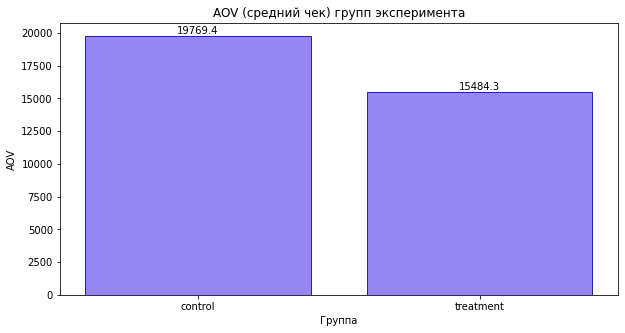

'Абсолютная разница AOV между тестовой и контрольной группой составила -4285.11, относительная разница = -21.68%'

In [167]:
plt.figure(figsize = (10,5))
bars = plt.bar(aov['group'], aov['AOV'], color = 'mediumslateblue', edgecolor = 'navy', alpha = 0.8)
for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}',
                 ha='center', va='bottom',
                 fontsize=10)
plt.title('AOV (средний чек) групп эксперимента')
plt.xlabel('Группа')
plt.ylabel('AOV')
plt.show()

display(f'Абсолютная разница AOV между тестовой и контрольной группой составила {absolute_lift_aov:.2f}, относительная разница = {relative_lift_aov:.2f}%')

В тестовой группе средний чек (AOV) оказался на 21.7% ниже (15 484 руб. против 19 769 руб. в контроле), при этом число заказов больше (155 против 12). Резкий рост числа заказов при снижении среднего чека — указывает на успешное привлечение новой аудитории с меньшим средним чеком, но значительным объемом покупок, что в итоге дало рост общей выручки. Результаты подтверждают, что изменения в тестовой группе эффективно масштабируют бизнес, хотя требуют дополнительного анализа структуры спроса.

Здесь нет противоречия с тем, что ARPU и ARPPU в тестовой группе выше. Это говорит о том, что в тестовой группе могло быть:
- Больше мелких/пробных заказов (снижает AOV)
- При этом несколько крупных сделок (поддерживает ARPPU)
- Выше повторные покупки (увеличивают ARPU)

**Вывод по анализу эксперимента по датафрейму `users_ab_2`**

Эксперимент с бонусом на первую покупку для TikTok-аудитории доказал свою эффективность: тестовая группа показала статистически значимый рост конверсии в первую покупку (с 0.1% до 0.8%, p-value < 0.0001) и десятикратное увеличение выручки (+911%), несмотря на снижение среднего чека на 21.7%. Ключевой успех обусловлен массовым привлечением новых покупателей (рост платящих пользователей в 9.25 раз) и оптимизацией воронки — тестовая группа сохраняет больше пользователей на этапе завершения заказа по сравнению с контролем. Рост ARPPU на 9.4% при снижении AOV объясняется сочетанием двух факторов: увеличения доли мелких пробных заказов (снизили средний чек) и активности крупных клиентов (поддержали ARPPU). Основные точки роста — улучшение онбординга (падение конверсии на первых шагах у обеих групп) и доработка процесса оформления заказа. Результаты подтверждают, что бонусная программа не только увеличила охват платежеспособной аудитории, но и повысила ее среднюю ценность (ARPU +970%).



## Промежуточный вывод по анализу результатов A/B-тестирования

Эксперимент с бонусом для пользователей TikTok подтвердил статистически значимое улучшение ключевой метрики — конверсия в первую покупку выросла с 0.1% до 0.8-1.4%, p-value < 0.0001). Вспомогательные метрики показали взрывной рост монетизации:

- ARPU увеличился на 900-970% (с 9.99-12.59 до 106.86-131.25) за счет массового притока новых платящих пользователей (рост в 9-10 раз);

- ARPPU вырос на 9-47%, несмотря на снижение среднего чека (AOV) на 21.7% во втором сценарии, что объясняется сочетанием роста мелких пробных заказов и активности крупных покупателей. Второй сценарий (с снижением AOV на 21.7% при росте ARPU на 970%) выглядит более вероятным и реалистичным по сравнению с первым (где AOV вырос на 5.6%), так как в анализ не вошли пользователи, регистрировавшиеся в новогодние праздники. 

- Барьерная метрика (выручка) продемонстрировала десятикратный рост (+911-916%) благодаря увеличению количества заказов (в 9-13 раз) и оптимизации воронки (конверсия на этапе завершения заказа в тестовой группе превысила 100%, что требует проверки данных).

Ключевые выводы:

- Бонусная программа эффективно привлекла новую аудиторию и повысила ее платежеспособность.

- Снижение AOV в одном из сценариев компенсировалось кратным ростом числа заказов, что указывает на успешное масштабирование.

- Основные точки роста — улучшение онбординга (падение конверсии на первых шагах до 13-14%) и оптимизация оформления заказа (потери до 57% в контрольной группе).

Результаты доказывают, что внедрение бонуса не только окупилось, но и трансформировало поведение аудитории, увеличив как охват, так и среднюю выручку на пользователя. Для дальнейшего роста рекомендуется проанализировать сегменты покупателей (мелкие vs крупные чеки) и усилить механизмы удержания после первой покупки.

## Выводы по этапу 5

Было выявлено несколько ключевых проблем в дизайне эксперимента:
- Несоответствие фактической длительности теста заявленным срокам (26 дней вместо 21 дня), что потребовало дополнительного анализа двух сценариев и повысило риск смещения данных из-за новогодних праздников
- Отсутствие стратификации при рандомизации, приведшее к дисбалансу по типам устройств (разница 4-7% по мобильным/планшетным пользователям)
- Неучет сезонного фактора (проведение теста в праздничный период)
- Предоставленные датафреймы не были отфильтрованы по пользователям, попавшим в эксперимент

Чтобы снизить влияние новогодних праздников на результаты теста, мы рассмотрели два сценария: 

- учитывались все пользователи, попавшие в эксперимент в период 2025-01-01 - 2025-01-26
- учитывались пользователи, попавшие в эусперимент в период 2025-01-06 - 2025-01-26

В результате оба сценария показали необходимость внедрения бонуса на первую покупку для пользователей TikTok. Несмотря на снижение среднего чека на 21.7% в наиболее достоверном сценарии (исключающем новогодние аномалии), программа показала кратный рост ключевых метрик: конверсия в покупку увеличилась в 6-7 раз, выручка — в 10 раз, а ARPU — на 970%. Рост ARPPU на 9-47% подтверждает, что бонусы не только привлекли новых клиентов с мелких заказов, но и активировали крупных покупателей.

Решение: внедрить приветственный бонус для пользователей из  TikTok, дополнительно:
- Оптимизировать онбординг (рост конверсии с 14% на первом шаге);
- Упростить оформление заказа (снизить потери до 57%)

A/B-эксперимент можно считать успешным. 